In [1]:
import os
import os.path
import glob
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold                                                                                                                       
from sklearn.metrics import confusion_matrix,accuracy_score

import matplotlib.pyplot as plt
import matplotlib.cm as colormap
plt.rcParams['image.cmap'] = 'Pastel1'

import numpy as np
np.random.seed(1)

from keras.preprocessing.image import img_to_array
from keras.utils import np_utils
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50
from keras.applications.imagenet_utils import preprocess_input
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential,Model
from keras.layers import Input,Flatten,Dense,Dropout,GlobalAveragePooling2D,Conv2D,MaxPooling2D

Using TensorFlow backend.


In [2]:
imagedir = "retina-dataset"

In [3]:
cur_dir = os.getcwd()
os.chdir(imagedir)  # the parent folder with sub-folders

# Get number of samples per family
list_fams = sorted(os.listdir(os.getcwd()), key=str.lower)  # vector of strings with family names
no_imgs = []  # No. of samples per family
for i in range(len(list_fams)):
    os.chdir(list_fams[i])
    len1 = len(glob.glob('*.png'))  # assuming the images are stored as 'png'
    no_imgs.append(len1)
    os.chdir('..')
num_samples = np.sum(no_imgs)  # total number of all samples

# Compute the labels
y = np.zeros(num_samples)
pos = 0
label = 0
for i in no_imgs:
    print ("Label:%2d\tFamily: %15s\tNumber of images: %d" % (label, list_fams[label], i))
    for j in range(i):
        y[pos] = label
        pos += 1
    label += 1
num_classes = label

# Compute the features
width, height,channels = (224,224,3)
#X = np.zeros((num_samples, width, height, channels))
cnt = 0
#list_paths = [] # List of image paths
print("Processing images ...")
for i in range(len(list_fams)):
    for img_file in glob.glob(list_fams[i]+'/*.png'):
        #print("[%d] Processing image: %s" % (cnt, img_file))
        #list_paths.append(os.path.join(os.getcwd(),img_file))
        #img = image.load_img(img_file, target_size=(224, 224))
        #x = image.img_to_array(img)
        #x = np.expand_dims(x, axis=0)
        #x = preprocess_input(x)
        #X[cnt] = x
        cnt += 1
print("Images processed: %d" %(cnt))

os.chdir(cur_dir)

Label: 0	Family:         Exudate	Number of images: 67600
Label: 1	Family:     Non_Exudate	Number of images: 70043
Processing images ...
Images processed: 137643


In [4]:
#X.shape

In [5]:
# Encoding classes (y) into integers (y_encoded) and then generating one-hot-encoding (Y)
encoder = LabelEncoder()
encoder.fit(y)
y_encoded = encoder.transform(y)
Y = np_utils.to_categorical(y_encoded)

In [6]:
# Creating base_model (ResNet50 notop)
image_shape = (224, 224, 3)                                                                                                                                                                                                                                                                                            
base_model = ResNet50(weights='imagenet', input_shape=image_shape, include_top=False, pooling='avg')

In [7]:
filename = 'retina-resnet50features-avgpool.npy'
if os.path.exists(filename):
    print("Loading ResNet50 extracted features from %s ..." %(filename))
    resnet50features = np.load(filename)
else:
    print("Extracting features from ResNet50 layers ...")
    resnet50features = base_model.predict(X)
    print("Saving ResNet50 extracted features into %s ..." %(filename))
    np.save(filename, resnet50features)

Loading ResNet50 extracted features from retina-resnet50features-avgpool.npy ...


In [8]:
resnet50features.shape

(137643, 2048)

In [9]:
# Create stratified k-fold subsets                                                                                                                                        
kfold = 5  # no. of folds                                                                 
skf = StratifiedKFold(kfold, shuffle=True,random_state=1)
skfind = [None] * kfold  # skfind[i][0] -> train indices, skfind[i][1] -> test indices
cnt = 0                                              
#for index in skf.split(X, y):    
for index in skf.split(resnet50features, y):         
    skfind[cnt] = index                                                 
    cnt += 1 

In [10]:
# Training top_model and saving min training loss weights
num_epochs=20000
history = []
conf_mat = np.zeros((len(list_fams),len(list_fams))) # Initializing the Confusion Matrix
#early_stopping = EarlyStopping(verbose=1, patience=20, monitor='val_loss')
checkpointer = ModelCheckpoint(filepath='retina-topweights-max_val_acc-resnet50-Adam-20000epochs.h5', monitor='val_acc', verbose=0, save_best_only=True, save_weights_only=True, mode='max')
#callbacks_list = [early_stopping, checkpointer]
callbacks_list = [checkpointer]
for i in range(kfold):
    train_indices = skfind[i][0]
    test_indices = skfind[i][1]
    X_train = resnet50features[train_indices]
    Y_train = Y[train_indices]
    X_test = resnet50features[test_indices]
    Y_test = Y[test_indices]
    y_test = y[test_indices]

    top_input = Input(shape=resnet50features.shape[1:])
    predict = Dense(num_classes, activation='softmax', name='predictions')(top_input)
    top_model = Model(input=top_input, output=predict)                            
    top_model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

    start = time.time()
    h = top_model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=num_epochs, batch_size=X_train.shape[0], verbose=1, callbacks=callbacks_list)
    end = time.time()
    history.append(h)
    
    y_prob = top_model.predict(X_test, verbose=0)  # Testing
    y_pred = np.argmax(y_prob, axis=1)
    print("[%d] Test acurracy: %.4f (%.4f s)" %(i,accuracy_score(y_test,y_pred),end-start))
    cm = confusion_matrix(y_test,y_pred)  # Compute confusion matrix for this fold
    conf_mat = conf_mat + cm  # Compute global confusion matrix

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:20: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("pr..., inputs=Tensor("in...)`


Train on 110114 samples, validate on 27529 samples
Epoch 1/20000
110114/110114 [==============================] - 1s - loss: 0.7910 - acc: 0.4853 - val_loss: 0.6866 - val_acc: 0.5161
Epoch 2/20000
110114/110114 [==============================] - 1s - loss: 0.6869 - acc: 0.5158 - val_loss: 0.6481 - val_acc: 0.6607
Epoch 3/20000
110114/110114 [==============================] - 1s - loss: 0.6488 - acc: 0.6578 - val_loss: 0.6363 - val_acc: 0.6536
Epoch 4/20000
110114/110114 [==============================] - 1s - loss: 0.6375 - acc: 0.6506 - val_loss: 0.6280 - val_acc: 0.6374
Epoch 5/20000
110114/110114 [==============================] - 1s - loss: 0.6296 - acc: 0.6341 - val_loss: 0.6104 - val_acc: 0.6577
Epoch 6/20000
110114/110114 [==============================] - 1s - loss: 0.6122 - acc: 0.6543 - val_loss: 0.5846 - val_acc: 0.6995
Epoch 7/20000
110114/110114 [==============================] - 1s - loss: 0.5865 - acc: 0.6973 - val_loss: 0.5580 - val_acc: 0.7397
Epoch 8/20000
110114/1101

110114/110114 [==============================] - 1s - loss: 0.3209 - acc: 0.8655 - val_loss: 0.3194 - val_acc: 0.8656
Epoch 124/20000
110114/110114 [==============================] - 1s - loss: 0.3202 - acc: 0.8659 - val_loss: 0.3187 - val_acc: 0.8659
Epoch 125/20000
110114/110114 [==============================] - 1s - loss: 0.3195 - acc: 0.8662 - val_loss: 0.3180 - val_acc: 0.8661
Epoch 126/20000
110114/110114 [==============================] - 1s - loss: 0.3188 - acc: 0.8666 - val_loss: 0.3174 - val_acc: 0.8668
Epoch 127/20000
110114/110114 [==============================] - 1s - loss: 0.3181 - acc: 0.8670 - val_loss: 0.3167 - val_acc: 0.8670
Epoch 128/20000
110114/110114 [==============================] - 1s - loss: 0.3174 - acc: 0.8673 - val_loss: 0.3160 - val_acc: 0.8671
Epoch 129/20000
110114/110114 [==============================] - 1s - loss: 0.3167 - acc: 0.8676 - val_loss: 0.3153 - val_acc: 0.8675
Epoch 130/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2634 - acc: 0.8959 - val_loss: 0.2629 - val_acc: 0.8958
Epoch 246/20000
110114/110114 [==============================] - 1s - loss: 0.2630 - acc: 0.8959 - val_loss: 0.2626 - val_acc: 0.8959
Epoch 247/20000
110114/110114 [==============================] - 1s - loss: 0.2627 - acc: 0.8961 - val_loss: 0.2623 - val_acc: 0.8960
Epoch 248/20000
110114/110114 [==============================] - 1s - loss: 0.2624 - acc: 0.8962 - val_loss: 0.2619 - val_acc: 0.8961
Epoch 249/20000
110114/110114 [==============================] - 1s - loss: 0.2621 - acc: 0.8963 - val_loss: 0.2616 - val_acc: 0.8962
Epoch 250/20000
110114/110114 [==============================] - 1s - loss: 0.2618 - acc: 0.8965 - val_loss: 0.2613 - val_acc: 0.8964
Epoch 251/20000
110114/110114 [==============================] - 1s - loss: 0.2615 - acc: 0.8967 - val_loss: 0.2610 - val_acc: 0.8964
Epoch 252/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2337 - acc: 0.9082 - val_loss: 0.2335 - val_acc: 0.9069
Epoch 368/20000
110114/110114 [==============================] - 1s - loss: 0.2335 - acc: 0.9083 - val_loss: 0.2333 - val_acc: 0.9071
Epoch 369/20000
110114/110114 [==============================] - 1s - loss: 0.2333 - acc: 0.9084 - val_loss: 0.2331 - val_acc: 0.9073
Epoch 370/20000
110114/110114 [==============================] - 1s - loss: 0.2331 - acc: 0.9085 - val_loss: 0.2329 - val_acc: 0.9074
Epoch 371/20000
110114/110114 [==============================] - 1s - loss: 0.2329 - acc: 0.9085 - val_loss: 0.2328 - val_acc: 0.9073
Epoch 372/20000
110114/110114 [==============================] - 1s - loss: 0.2327 - acc: 0.9085 - val_loss: 0.2326 - val_acc: 0.9075
Epoch 373/20000
110114/110114 [==============================] - 1s - loss: 0.2326 - acc: 0.9086 - val_loss: 0.2324 - val_acc: 0.9075
Epoch 374/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2147 - acc: 0.9157 - val_loss: 0.2147 - val_acc: 0.9150
Epoch 490/20000
110114/110114 [==============================] - 1s - loss: 0.2146 - acc: 0.9157 - val_loss: 0.2145 - val_acc: 0.9151
Epoch 491/20000
110114/110114 [==============================] - 1s - loss: 0.2145 - acc: 0.9158 - val_loss: 0.2144 - val_acc: 0.9152
Epoch 492/20000
110114/110114 [==============================] - 1s - loss: 0.2143 - acc: 0.9159 - val_loss: 0.2143 - val_acc: 0.9152
Epoch 493/20000
110114/110114 [==============================] - 1s - loss: 0.2142 - acc: 0.9159 - val_loss: 0.2141 - val_acc: 0.9154
Epoch 494/20000
110114/110114 [==============================] - 1s - loss: 0.2141 - acc: 0.9160 - val_loss: 0.2140 - val_acc: 0.9155
Epoch 495/20000
110114/110114 [==============================] - 1s - loss: 0.2139 - acc: 0.9160 - val_loss: 0.2139 - val_acc: 0.9156
Epoch 496/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2012 - acc: 0.9209 - val_loss: 0.2013 - val_acc: 0.9212
Epoch 612/20000
110114/110114 [==============================] - 1s - loss: 0.2011 - acc: 0.9209 - val_loss: 0.2012 - val_acc: 0.9212
Epoch 613/20000
110114/110114 [==============================] - 1s - loss: 0.2010 - acc: 0.9210 - val_loss: 0.2011 - val_acc: 0.9212
Epoch 614/20000
110114/110114 [==============================] - 1s - loss: 0.2009 - acc: 0.9210 - val_loss: 0.2010 - val_acc: 0.9212
Epoch 615/20000
110114/110114 [==============================] - 1s - loss: 0.2008 - acc: 0.9211 - val_loss: 0.2009 - val_acc: 0.9212
Epoch 616/20000
110114/110114 [==============================] - 1s - loss: 0.2008 - acc: 0.9210 - val_loss: 0.2008 - val_acc: 0.9212
Epoch 617/20000
110114/110114 [==============================] - 1s - loss: 0.2007 - acc: 0.9211 - val_loss: 0.2007 - val_acc: 0.9212
Epoch 618/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1910 - acc: 0.9249 - val_loss: 0.1911 - val_acc: 0.9256
Epoch 734/20000
110114/110114 [==============================] - 1s - loss: 0.1909 - acc: 0.9249 - val_loss: 0.1911 - val_acc: 0.9256
Epoch 735/20000
110114/110114 [==============================] - 1s - loss: 0.1908 - acc: 0.9249 - val_loss: 0.1910 - val_acc: 0.9256
Epoch 736/20000
110114/110114 [==============================] - 1s - loss: 0.1908 - acc: 0.9250 - val_loss: 0.1909 - val_acc: 0.9256
Epoch 737/20000
110114/110114 [==============================] - 1s - loss: 0.1907 - acc: 0.9250 - val_loss: 0.1908 - val_acc: 0.9256
Epoch 738/20000
110114/110114 [==============================] - 1s - loss: 0.1906 - acc: 0.9250 - val_loss: 0.1908 - val_acc: 0.9256
Epoch 739/20000
110114/110114 [==============================] - 1s - loss: 0.1905 - acc: 0.9251 - val_loss: 0.1907 - val_acc: 0.9256
Epoch 740/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1828 - acc: 0.9282 - val_loss: 0.1831 - val_acc: 0.9285
Epoch 856/20000
110114/110114 [==============================] - 1s - loss: 0.1828 - acc: 0.9282 - val_loss: 0.1831 - val_acc: 0.9287
Epoch 857/20000
110114/110114 [==============================] - 1s - loss: 0.1827 - acc: 0.9282 - val_loss: 0.1830 - val_acc: 0.9287
Epoch 858/20000
110114/110114 [==============================] - 1s - loss: 0.1827 - acc: 0.9282 - val_loss: 0.1830 - val_acc: 0.9287
Epoch 859/20000
110114/110114 [==============================] - 1s - loss: 0.1826 - acc: 0.9282 - val_loss: 0.1829 - val_acc: 0.9288
Epoch 860/20000
110114/110114 [==============================] - 1s - loss: 0.1825 - acc: 0.9283 - val_loss: 0.1829 - val_acc: 0.9288
Epoch 861/20000
110114/110114 [==============================] - 1s - loss: 0.1825 - acc: 0.9283 - val_loss: 0.1828 - val_acc: 0.9288
Epoch 862/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1761 - acc: 0.9308 - val_loss: 0.1766 - val_acc: 0.9312
Epoch 978/20000
110114/110114 [==============================] - 1s - loss: 0.1761 - acc: 0.9308 - val_loss: 0.1766 - val_acc: 0.9313
Epoch 979/20000
110114/110114 [==============================] - 1s - loss: 0.1760 - acc: 0.9309 - val_loss: 0.1765 - val_acc: 0.9314
Epoch 980/20000
110114/110114 [==============================] - 1s - loss: 0.1760 - acc: 0.9309 - val_loss: 0.1765 - val_acc: 0.9314
Epoch 981/20000
110114/110114 [==============================] - 1s - loss: 0.1759 - acc: 0.9309 - val_loss: 0.1764 - val_acc: 0.9314
Epoch 982/20000
110114/110114 [==============================] - 1s - loss: 0.1759 - acc: 0.9309 - val_loss: 0.1764 - val_acc: 0.9314
Epoch 983/20000
110114/110114 [==============================] - 1s - loss: 0.1758 - acc: 0.9309 - val_loss: 0.1763 - val_acc: 0.9314
Epoch 984/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1706 - acc: 0.9332 - val_loss: 0.1713 - val_acc: 0.9334
Epoch 1098/20000
110114/110114 [==============================] - 1s - loss: 0.1705 - acc: 0.9333 - val_loss: 0.1712 - val_acc: 0.9334
Epoch 1099/20000
110114/110114 [==============================] - 1s - loss: 0.1705 - acc: 0.9333 - val_loss: 0.1712 - val_acc: 0.9334
Epoch 1100/20000
110114/110114 [==============================] - 1s - loss: 0.1705 - acc: 0.9333 - val_loss: 0.1712 - val_acc: 0.9334
Epoch 1101/20000
110114/110114 [==============================] - 1s - loss: 0.1704 - acc: 0.9333 - val_loss: 0.1711 - val_acc: 0.9335
Epoch 1102/20000
110114/110114 [==============================] - 1s - loss: 0.1704 - acc: 0.9333 - val_loss: 0.1711 - val_acc: 0.9335
Epoch 1103/20000
110114/110114 [==============================] - 1s - loss: 0.1703 - acc: 0.9334 - val_loss: 0.1710 - val_acc: 0.9335
Epoch 1104/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1658 - acc: 0.9351 - val_loss: 0.1667 - val_acc: 0.9353
Epoch 1218/20000
110114/110114 [==============================] - 1s - loss: 0.1658 - acc: 0.9351 - val_loss: 0.1667 - val_acc: 0.9354
Epoch 1219/20000
110114/110114 [==============================] - 1s - loss: 0.1657 - acc: 0.9352 - val_loss: 0.1666 - val_acc: 0.9353
Epoch 1220/20000
110114/110114 [==============================] - 1s - loss: 0.1657 - acc: 0.9352 - val_loss: 0.1666 - val_acc: 0.9353
Epoch 1221/20000
110114/110114 [==============================] - 1s - loss: 0.1657 - acc: 0.9352 - val_loss: 0.1666 - val_acc: 0.9353
Epoch 1222/20000
110114/110114 [==============================] - 1s - loss: 0.1656 - acc: 0.9352 - val_loss: 0.1665 - val_acc: 0.9353
Epoch 1223/20000
110114/110114 [==============================] - 1s - loss: 0.1656 - acc: 0.9353 - val_loss: 0.1665 - val_acc: 0.9353
Epoch 1224/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1617 - acc: 0.9366 - val_loss: 0.1628 - val_acc: 0.9368
Epoch 1338/20000
110114/110114 [==============================] - 1s - loss: 0.1616 - acc: 0.9367 - val_loss: 0.1627 - val_acc: 0.9368
Epoch 1339/20000
110114/110114 [==============================] - 1s - loss: 0.1616 - acc: 0.9367 - val_loss: 0.1627 - val_acc: 0.9369
Epoch 1340/20000
110114/110114 [==============================] - 1s - loss: 0.1616 - acc: 0.9367 - val_loss: 0.1627 - val_acc: 0.9369
Epoch 1341/20000
110114/110114 [==============================] - 1s - loss: 0.1615 - acc: 0.9367 - val_loss: 0.1626 - val_acc: 0.9370
Epoch 1342/20000
110114/110114 [==============================] - 1s - loss: 0.1615 - acc: 0.9367 - val_loss: 0.1626 - val_acc: 0.9370
Epoch 1343/20000
110114/110114 [==============================] - 1s - loss: 0.1615 - acc: 0.9367 - val_loss: 0.1626 - val_acc: 0.9370
Epoch 1344/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1580 - acc: 0.9383 - val_loss: 0.1593 - val_acc: 0.9377
Epoch 1458/20000
110114/110114 [==============================] - 1s - loss: 0.1579 - acc: 0.9383 - val_loss: 0.1593 - val_acc: 0.9377
Epoch 1459/20000
110114/110114 [==============================] - 1s - loss: 0.1579 - acc: 0.9383 - val_loss: 0.1593 - val_acc: 0.9377
Epoch 1460/20000
110114/110114 [==============================] - 1s - loss: 0.1579 - acc: 0.9383 - val_loss: 0.1592 - val_acc: 0.9378
Epoch 1461/20000
110114/110114 [==============================] - 1s - loss: 0.1579 - acc: 0.9383 - val_loss: 0.1592 - val_acc: 0.9378
Epoch 1462/20000
110114/110114 [==============================] - 1s - loss: 0.1578 - acc: 0.9383 - val_loss: 0.1592 - val_acc: 0.9378
Epoch 1463/20000
110114/110114 [==============================] - 1s - loss: 0.1578 - acc: 0.9383 - val_loss: 0.1592 - val_acc: 0.9378
Epoch 1464/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1547 - acc: 0.9395 - val_loss: 0.1563 - val_acc: 0.9390
Epoch 1578/20000
110114/110114 [==============================] - 1s - loss: 0.1547 - acc: 0.9396 - val_loss: 0.1562 - val_acc: 0.9391
Epoch 1579/20000
110114/110114 [==============================] - 1s - loss: 0.1546 - acc: 0.9396 - val_loss: 0.1562 - val_acc: 0.9391
Epoch 1580/20000
110114/110114 [==============================] - 1s - loss: 0.1546 - acc: 0.9396 - val_loss: 0.1562 - val_acc: 0.9391
Epoch 1581/20000
110114/110114 [==============================] - 1s - loss: 0.1546 - acc: 0.9396 - val_loss: 0.1562 - val_acc: 0.9391
Epoch 1582/20000
110114/110114 [==============================] - 1s - loss: 0.1545 - acc: 0.9396 - val_loss: 0.1561 - val_acc: 0.9392
Epoch 1583/20000
110114/110114 [==============================] - 1s - loss: 0.1545 - acc: 0.9396 - val_loss: 0.1561 - val_acc: 0.9392
Epoch 1584/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1535 - val_acc: 0.9408
Epoch 1698/20000
110114/110114 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1535 - val_acc: 0.9408
Epoch 1699/20000
110114/110114 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1535 - val_acc: 0.9408
Epoch 1700/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9410 - val_loss: 0.1535 - val_acc: 0.9408
Epoch 1701/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9410 - val_loss: 0.1534 - val_acc: 0.9408
Epoch 1702/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9410 - val_loss: 0.1534 - val_acc: 0.9408
Epoch 1703/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9410 - val_loss: 0.1534 - val_acc: 0.9409
Epoch 1704/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1490 - acc: 0.9420 - val_loss: 0.1511 - val_acc: 0.9414
Epoch 1818/20000
110114/110114 [==============================] - 1s - loss: 0.1490 - acc: 0.9420 - val_loss: 0.1511 - val_acc: 0.9414
Epoch 1819/20000
110114/110114 [==============================] - 1s - loss: 0.1490 - acc: 0.9420 - val_loss: 0.1511 - val_acc: 0.9414
Epoch 1820/20000
110114/110114 [==============================] - 1s - loss: 0.1490 - acc: 0.9420 - val_loss: 0.1510 - val_acc: 0.9414
Epoch 1821/20000
110114/110114 [==============================] - 1s - loss: 0.1489 - acc: 0.9420 - val_loss: 0.1510 - val_acc: 0.9414
Epoch 1822/20000
110114/110114 [==============================] - 1s - loss: 0.1489 - acc: 0.9420 - val_loss: 0.1510 - val_acc: 0.9414
Epoch 1823/20000
110114/110114 [==============================] - 1s - loss: 0.1489 - acc: 0.9420 - val_loss: 0.1510 - val_acc: 0.9415
Epoch 1824/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1466 - acc: 0.9428 - val_loss: 0.1489 - val_acc: 0.9426
Epoch 1938/20000
110114/110114 [==============================] - 1s - loss: 0.1466 - acc: 0.9428 - val_loss: 0.1489 - val_acc: 0.9426
Epoch 1939/20000
110114/110114 [==============================] - 1s - loss: 0.1465 - acc: 0.9428 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 1940/20000
110114/110114 [==============================] - 1s - loss: 0.1465 - acc: 0.9428 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 1941/20000
110114/110114 [==============================] - 1s - loss: 0.1465 - acc: 0.9428 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 1942/20000
110114/110114 [==============================] - 1s - loss: 0.1465 - acc: 0.9429 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 1943/20000
110114/110114 [==============================] - 1s - loss: 0.1465 - acc: 0.9429 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 1944/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1443 - acc: 0.9436 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2058/20000
110114/110114 [==============================] - 1s - loss: 0.1443 - acc: 0.9436 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2059/20000
110114/110114 [==============================] - 1s - loss: 0.1443 - acc: 0.9436 - val_loss: 0.1468 - val_acc: 0.9431
Epoch 2060/20000
110114/110114 [==============================] - 1s - loss: 0.1443 - acc: 0.9437 - val_loss: 0.1468 - val_acc: 0.9431
Epoch 2061/20000
110114/110114 [==============================] - 1s - loss: 0.1442 - acc: 0.9437 - val_loss: 0.1468 - val_acc: 0.9432
Epoch 2062/20000
110114/110114 [==============================] - 1s - loss: 0.1442 - acc: 0.9437 - val_loss: 0.1468 - val_acc: 0.9432
Epoch 2063/20000
110114/110114 [==============================] - 1s - loss: 0.1442 - acc: 0.9437 - val_loss: 0.1468 - val_acc: 0.9432
Epoch 2064/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1422 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9440
Epoch 2178/20000
110114/110114 [==============================] - 1s - loss: 0.1422 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9440
Epoch 2179/20000
110114/110114 [==============================] - 1s - loss: 0.1422 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9440
Epoch 2180/20000
110114/110114 [==============================] - 1s - loss: 0.1422 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9440
Epoch 2181/20000
110114/110114 [==============================] - 1s - loss: 0.1422 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9441
Epoch 2182/20000
110114/110114 [==============================] - 1s - loss: 0.1422 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9441
Epoch 2183/20000
110114/110114 [==============================] - 1s - loss: 0.1421 - acc: 0.9445 - val_loss: 0.1449 - val_acc: 0.9441
Epoch 2184/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2298/20000
110114/110114 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2299/20000
110114/110114 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2300/20000
110114/110114 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2301/20000
110114/110114 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2302/20000
110114/110114 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2303/20000
110114/110114 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1433 - val_acc: 0.9442
Epoch 2304/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1418 - val_acc: 0.9450
Epoch 2418/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1418 - val_acc: 0.9450
Epoch 2419/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1418 - val_acc: 0.9450
Epoch 2420/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1418 - val_acc: 0.9450
Epoch 2421/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9461 - val_loss: 0.1417 - val_acc: 0.9450
Epoch 2422/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9461 - val_loss: 0.1417 - val_acc: 0.9450
Epoch 2423/20000
110114/110114 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1417 - val_acc: 0.9450
Epoch 2424/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1369 - acc: 0.9468 - val_loss: 0.1404 - val_acc: 0.9452
Epoch 2538/20000
110114/110114 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1404 - val_acc: 0.9452
Epoch 2539/20000
110114/110114 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1403 - val_acc: 0.9452
Epoch 2540/20000
110114/110114 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1403 - val_acc: 0.9452
Epoch 2541/20000
110114/110114 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1403 - val_acc: 0.9452
Epoch 2542/20000
110114/110114 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1403 - val_acc: 0.9452
Epoch 2543/20000
110114/110114 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1403 - val_acc: 0.9452
Epoch 2544/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9458
Epoch 2658/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9458
Epoch 2659/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9458
Epoch 2660/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9458
Epoch 2661/20000
110114/110114 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9458
Epoch 2662/20000
110114/110114 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9458
Epoch 2663/20000
110114/110114 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1390 - val_acc: 0.9457
Epoch 2664/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1378 - val_acc: 0.9458
Epoch 2778/20000
110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1378 - val_acc: 0.9459
Epoch 2779/20000
110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1378 - val_acc: 0.9459
Epoch 2780/20000
110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1378 - val_acc: 0.9459
Epoch 2781/20000
110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1378 - val_acc: 0.9459
Epoch 2782/20000
110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1378 - val_acc: 0.9459
Epoch 2783/20000
110114/110114 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9460
Epoch 2784/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9485 - val_loss: 0.1367 - val_acc: 0.9462
Epoch 2898/20000
110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9485 - val_loss: 0.1366 - val_acc: 0.9462
Epoch 2899/20000
110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9485 - val_loss: 0.1366 - val_acc: 0.9462
Epoch 2900/20000
110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9485 - val_loss: 0.1366 - val_acc: 0.9462
Epoch 2901/20000
110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9484 - val_loss: 0.1366 - val_acc: 0.9462
Epoch 2902/20000
110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9485 - val_loss: 0.1366 - val_acc: 0.9462
Epoch 2903/20000
110114/110114 [==============================] - 1s - loss: 0.1324 - acc: 0.9485 - val_loss: 0.1366 - val_acc: 0.9462
Epoch 2904/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1356 - val_acc: 0.9468
Epoch 3018/20000
110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1356 - val_acc: 0.9468
Epoch 3019/20000
110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1356 - val_acc: 0.9468
Epoch 3020/20000
110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1356 - val_acc: 0.9468
Epoch 3021/20000
110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1355 - val_acc: 0.9468
Epoch 3022/20000
110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1355 - val_acc: 0.9468
Epoch 3023/20000
110114/110114 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1355 - val_acc: 0.9468
Epoch 3024/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1346 - val_acc: 0.9472
Epoch 3138/20000
110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1346 - val_acc: 0.9472
Epoch 3139/20000
110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1346 - val_acc: 0.9472
Epoch 3140/20000
110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1346 - val_acc: 0.9472
Epoch 3141/20000
110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1345 - val_acc: 0.9472
Epoch 3142/20000
110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1345 - val_acc: 0.9472
Epoch 3143/20000
110114/110114 [==============================] - 1s - loss: 0.1299 - acc: 0.9491 - val_loss: 0.1345 - val_acc: 0.9472
Epoch 3144/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9496 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3258/20000
110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9496 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3259/20000
110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9496 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3260/20000
110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3261/20000
110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3262/20000
110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3263/20000
110114/110114 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9475
Epoch 3264/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1328 - val_acc: 0.9475
Epoch 3378/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1328 - val_acc: 0.9475
Epoch 3379/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1327 - val_acc: 0.9475
Epoch 3380/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1327 - val_acc: 0.9475
Epoch 3381/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1327 - val_acc: 0.9475
Epoch 3382/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1327 - val_acc: 0.9475
Epoch 3383/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1327 - val_acc: 0.9475
Epoch 3384/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1266 - acc: 0.9505 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3498/20000
110114/110114 [==============================] - 1s - loss: 0.1266 - acc: 0.9505 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3499/20000
110114/110114 [==============================] - 1s - loss: 0.1266 - acc: 0.9506 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3500/20000
110114/110114 [==============================] - 1s - loss: 0.1266 - acc: 0.9506 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3501/20000
110114/110114 [==============================] - 1s - loss: 0.1266 - acc: 0.9506 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3502/20000
110114/110114 [==============================] - 1s - loss: 0.1266 - acc: 0.9506 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3503/20000
110114/110114 [==============================] - 1s - loss: 0.1265 - acc: 0.9506 - val_loss: 0.1319 - val_acc: 0.9474
Epoch 3504/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1312 - val_acc: 0.9479
Epoch 3618/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1312 - val_acc: 0.9479
Epoch 3619/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1311 - val_acc: 0.9479
Epoch 3620/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1311 - val_acc: 0.9479
Epoch 3621/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1311 - val_acc: 0.9479
Epoch 3622/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1311 - val_acc: 0.9480
Epoch 3623/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9510 - val_loss: 0.1311 - val_acc: 0.9480
Epoch 3624/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1247 - acc: 0.9512 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3738/20000
110114/110114 [==============================] - 1s - loss: 0.1247 - acc: 0.9513 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3739/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9513 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3740/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9513 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3741/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9513 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3742/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9513 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3743/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9513 - val_loss: 0.1304 - val_acc: 0.9480
Epoch 3744/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1238 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3858/20000
110114/110114 [==============================] - 1s - loss: 0.1238 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3859/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3860/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3861/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3862/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3863/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 3864/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3978/20000
110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3979/20000
110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3980/20000
110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3981/20000
110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3982/20000
110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3983/20000
110114/110114 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1291 - val_acc: 0.9478
Epoch 3984/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1285 - val_acc: 0.9479
Epoch 4098/20000
110114/110114 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1285 - val_acc: 0.9479
Epoch 4099/20000
110114/110114 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1285 - val_acc: 0.9480
Epoch 4100/20000
110114/110114 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1285 - val_acc: 0.9480
Epoch 4101/20000
110114/110114 [==============================] - 1s - loss: 0.1221 - acc: 0.9523 - val_loss: 0.1285 - val_acc: 0.9480
Epoch 4102/20000
110114/110114 [==============================] - 1s - loss: 0.1221 - acc: 0.9523 - val_loss: 0.1285 - val_acc: 0.9480
Epoch 4103/20000
110114/110114 [==============================] - 1s - loss: 0.1220 - acc: 0.9523 - val_loss: 0.1285 - val_acc: 0.9480
Epoch 4104/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9525 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4218/20000
110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4219/20000
110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4220/20000
110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4221/20000
110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9525 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4222/20000
110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9525 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4223/20000
110114/110114 [==============================] - 1s - loss: 0.1213 - acc: 0.9525 - val_loss: 0.1279 - val_acc: 0.9482
Epoch 4224/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1206 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4338/20000
110114/110114 [==============================] - 1s - loss: 0.1206 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4339/20000
110114/110114 [==============================] - 1s - loss: 0.1206 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4340/20000
110114/110114 [==============================] - 1s - loss: 0.1205 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4341/20000
110114/110114 [==============================] - 1s - loss: 0.1205 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4342/20000
110114/110114 [==============================] - 1s - loss: 0.1205 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4343/20000
110114/110114 [==============================] - 1s - loss: 0.1205 - acc: 0.9527 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 4344/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9492
Epoch 4458/20000
110114/110114 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9493
Epoch 4459/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9493
Epoch 4460/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9493
Epoch 4461/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9493
Epoch 4462/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9492
Epoch 4463/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1269 - val_acc: 0.9492
Epoch 4464/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4578/20000
110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4579/20000
110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4580/20000
110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4581/20000
110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4582/20000
110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4583/20000
110114/110114 [==============================] - 1s - loss: 0.1191 - acc: 0.9532 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 4584/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9494
Epoch 4698/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9494
Epoch 4699/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9494
Epoch 4700/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9494
Epoch 4701/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9494
Epoch 4702/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9494
Epoch 4703/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 4704/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4818/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4819/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4820/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4821/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4822/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4823/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1256 - val_acc: 0.9495
Epoch 4824/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9494
Epoch 4938/20000
110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9495
Epoch 4939/20000
110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9495
Epoch 4940/20000
110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9495
Epoch 4941/20000
110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9495
Epoch 4942/20000
110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9495
Epoch 4943/20000
110114/110114 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1252 - val_acc: 0.9495
Epoch 4944/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1249 - val_acc: 0.9497
Epoch 5058/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 5059/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 5060/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 5061/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 5062/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1249 - val_acc: 0.9497
Epoch 5063/20000
110114/110114 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1248 - val_acc: 0.9497
Epoch 5064/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5178/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5179/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5180/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5181/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5182/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5183/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9544 - val_loss: 0.1245 - val_acc: 0.9498
Epoch 5184/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9546 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 5298/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9546 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 5299/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 5300/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 5301/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 5302/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 5303/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 5304/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5418/20000
110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5419/20000
110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5420/20000
110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5421/20000
110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5422/20000
110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5423/20000
110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1239 - val_acc: 0.9503
Epoch 5424/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5538/20000
110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5539/20000
110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5540/20000
110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5541/20000
110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5542/20000
110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5543/20000
110114/110114 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 5544/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5658/20000
110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5659/20000
110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5660/20000
110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5661/20000
110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5662/20000
110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5663/20000
110114/110114 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1234 - val_acc: 0.9504
Epoch 5664/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5778/20000
110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9552 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5779/20000
110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9552 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5780/20000
110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5781/20000
110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5782/20000
110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5783/20000
110114/110114 [==============================] - 1s - loss: 0.1139 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9506
Epoch 5784/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5898/20000
110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5899/20000
110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5900/20000
110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5901/20000
110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5902/20000
110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5903/20000
110114/110114 [==============================] - 1s - loss: 0.1135 - acc: 0.9553 - val_loss: 0.1230 - val_acc: 0.9509
Epoch 5904/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6018/20000
110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6019/20000
110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6020/20000
110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6021/20000
110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6022/20000
110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6023/20000
110114/110114 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9507
Epoch 6024/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6138/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6139/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6140/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6141/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6142/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6143/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 6144/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 6258/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 6259/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 6260/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 6261/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 6262/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 6263/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 6264/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 6378/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 6379/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 6380/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 6381/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 6382/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 6383/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 6384/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6498/20000
110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6499/20000
110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6500/20000
110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6501/20000
110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6502/20000
110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6503/20000
110114/110114 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 6504/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6618/20000
110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6619/20000
110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6620/20000
110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6621/20000
110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6622/20000
110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6623/20000
110114/110114 [==============================] - 1s - loss: 0.1115 - acc: 0.9559 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 6624/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1113 - acc: 0.9560 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 6738/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9562 - val_loss: 0.1221 - val_acc: 0.9513
Epoch 6739/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9560 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 6740/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9561 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 6741/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9561 - val_loss: 0.1221 - val_acc: 0.9513
Epoch 6742/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9560 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 6743/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9561 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 6744/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9562 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 6858/20000
110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9562 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 6859/20000
110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9562 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 6860/20000
110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9562 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 6861/20000
110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9562 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 6862/20000
110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9561 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 6863/20000
110114/110114 [==============================] - 1s - loss: 0.1110 - acc: 0.9561 - val_loss: 0.1221 - val_acc: 0.9513
Epoch 6864/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 6978/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9513
Epoch 6979/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 6980/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 6981/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 6982/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 6983/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 6984/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7098/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7099/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7100/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7101/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7102/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7103/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 7104/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7218/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 7219/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7220/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 7221/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7222/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7223/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 7224/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7338/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7339/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7340/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7341/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7342/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7343/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7344/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7458/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7459/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7460/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7461/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7462/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 7463/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9564 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7464/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7578/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7579/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7580/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7581/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7582/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9566 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7583/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7584/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9566 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7698/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9566 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7699/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9566 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7700/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7701/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9566 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7702/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9565 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7703/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9566 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7704/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7818/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7819/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7820/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7821/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7822/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7823/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1219 - val_acc: 0.9517
Epoch 7824/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7938/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7939/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7940/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7941/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7942/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7943/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1219 - val_acc: 0.9516
Epoch 7944/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9516
Epoch 8058/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 8059/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 8060/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 8061/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 8062/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 8063/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 8064/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8178/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8179/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8180/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8181/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8182/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8183/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8184/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8298/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8299/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8300/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8301/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8302/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9515
Epoch 8303/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8304/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8418/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8419/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8420/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8421/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8422/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8423/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1220 - val_acc: 0.9514
Epoch 8424/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8538/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8539/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8540/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8541/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8542/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8543/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9514
Epoch 8544/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8658/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8659/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8660/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8661/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8662/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8663/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1221 - val_acc: 0.9515
Epoch 8664/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8778/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8779/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8780/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8781/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9516
Epoch 8782/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9516
Epoch 8783/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8784/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8898/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8899/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8900/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8901/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8902/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8903/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 8904/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9516
Epoch 9018/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9019/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 9020/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9516
Epoch 9021/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9022/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9514
Epoch 9023/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9517
Epoch 9024/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9138/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9139/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9140/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9141/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9142/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9143/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9144/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 9258/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9259/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 9260/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9516
Epoch 9261/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9262/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9263/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 9264/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9378/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9379/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9380/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9381/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9382/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9383/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9514
Epoch 9384/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 9498/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9569 - val_loss: 0.1224 - val_acc: 0.9515
Epoch 9499/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9512
Epoch 9500/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9569 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 9501/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1225 - val_acc: 0.9513
Epoch 9502/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9569 - val_loss: 0.1225 - val_acc: 0.9514
Epoch 9503/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1224 - val_acc: 0.9515
Epoch 9504/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9618/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9619/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9620/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9621/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9622/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9623/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 9624/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 9738/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 9739/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 9740/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 9741/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 9742/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 9743/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1226 - val_acc: 0.9516
Epoch 9744/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9858/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9859/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9860/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9861/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9862/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9863/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 9864/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9978/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9979/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9980/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9981/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9982/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9983/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 9984/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9516
Epoch 10098/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10099/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 10100/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 10101/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9514
Epoch 10102/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1228 - val_acc: 0.9516
Epoch 10103/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1228 - val_acc: 0.9516
Epoch 10104/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10218/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10219/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10220/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10221/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10222/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10223/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9517
Epoch 10224/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9571 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 10338/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1230 - val_acc: 0.9512
Epoch 10339/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9571 - val_loss: 0.1228 - val_acc: 0.9514
Epoch 10340/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9571 - val_loss: 0.1229 - val_acc: 0.9513
Epoch 10341/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9571 - val_loss: 0.1229 - val_acc: 0.9516
Epoch 10342/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 10343/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 10344/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9514
Epoch 10458/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9514
Epoch 10459/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9514
Epoch 10460/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9514
Epoch 10461/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1229 - val_acc: 0.9514
Epoch 10462/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 10463/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1230 - val_acc: 0.9513
Epoch 10464/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1230 - val_acc: 0.9513
Epoch 10578/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1230 - val_acc: 0.9515
Epoch 10579/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1230 - val_acc: 0.9513
Epoch 10580/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9572 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 10581/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 10582/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1230 - val_acc: 0.9513
Epoch 10583/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1230 - val_acc: 0.9515
Epoch 10584/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10698/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10699/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10700/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10701/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10702/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10703/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10704/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10818/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9513
Epoch 10819/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10820/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 10821/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9512
Epoch 10822/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1231 - val_acc: 0.9515
Epoch 10823/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1231 - val_acc: 0.9512
Epoch 10824/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9512
Epoch 10938/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 10939/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9512
Epoch 10940/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9512
Epoch 10941/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9512
Epoch 10942/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9512
Epoch 10943/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9512
Epoch 10944/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 11058/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 11059/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9517
Epoch 11060/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9572 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 11061/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1232 - val_acc: 0.9516
Epoch 11062/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9572 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 11063/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 11064/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11178/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11179/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11180/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11181/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11182/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11183/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 11184/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1234 - val_acc: 0.9510
Epoch 11298/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1233 - val_acc: 0.9518
Epoch 11299/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11300/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1233 - val_acc: 0.9516
Epoch 11301/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1233 - val_acc: 0.9513
Epoch 11302/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 11303/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1233 - val_acc: 0.9517
Epoch 11304/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1234 - val_acc: 0.9512
Epoch 11418/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11419/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11420/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9573 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11421/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11422/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11423/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9511
Epoch 11424/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9517
Epoch 11538/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 11539/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 11540/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9518
Epoch 11541/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1236 - val_acc: 0.9511
Epoch 11542/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1234 - val_acc: 0.9519
Epoch 11543/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 11544/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11658/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11659/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11660/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11661/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11662/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11663/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 11664/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1235 - val_acc: 0.9517
Epoch 11778/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 11779/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1235 - val_acc: 0.9516
Epoch 11780/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 11781/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1235 - val_acc: 0.9517
Epoch 11782/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 11783/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1235 - val_acc: 0.9518
Epoch 11784/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11898/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11899/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11900/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11901/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11902/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11903/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9515
Epoch 11904/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12018/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12019/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12020/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12021/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12022/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12023/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1236 - val_acc: 0.9514
Epoch 12024/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9515
Epoch 12138/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12139/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12140/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9515
Epoch 12141/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12142/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12143/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9515
Epoch 12144/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12258/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12259/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12260/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12261/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12262/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12263/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1237 - val_acc: 0.9514
Epoch 12264/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1237 - val_acc: 0.9515
Epoch 12378/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12379/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1237 - val_acc: 0.9516
Epoch 12380/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12381/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1237 - val_acc: 0.9515
Epoch 12382/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12383/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12384/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12498/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12499/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12500/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12501/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12502/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12503/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12504/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9515
Epoch 12618/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9514
Epoch 12619/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12620/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9515
Epoch 12621/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12622/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9515
Epoch 12623/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1238 - val_acc: 0.9515
Epoch 12624/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12738/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12739/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12740/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12741/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12742/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12743/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12744/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 12858/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9578 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12859/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12860/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12861/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 12862/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12863/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9578 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12864/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12978/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12979/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12980/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12981/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12982/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12983/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 12984/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9578 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 13098/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 13099/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 13100/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1240 - val_acc: 0.9513
Epoch 13101/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1240 - val_acc: 0.9513
Epoch 13102/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1239 - val_acc: 0.9516
Epoch 13103/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1242 - val_acc: 0.9514
Epoch 13104/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 13218/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13219/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 13220/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 13221/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 13222/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 13223/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 13224/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13338/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13339/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13340/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13341/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13342/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13343/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13344/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1240 - val_acc: 0.9514
Epoch 13458/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13459/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13460/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13461/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13462/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13463/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13464/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13578/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13579/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13580/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13581/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13582/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13583/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13584/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13698/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9511
Epoch 13699/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13700/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13701/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9514
Epoch 13702/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9513
Epoch 13703/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13704/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13818/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13819/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13820/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13821/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13822/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13823/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 13824/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 13938/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9579 - val_loss: 0.1241 - val_acc: 0.9513
Epoch 13939/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1243 - val_acc: 0.9512
Epoch 13940/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9579 - val_loss: 0.1241 - val_acc: 0.9513
Epoch 13941/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 13942/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 13943/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1241 - val_acc: 0.9513
Epoch 13944/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14058/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14059/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14060/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14061/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14062/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14063/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14064/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9511
Epoch 14178/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9580 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 14179/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1244 - val_acc: 0.9513
Epoch 14180/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9579 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 14181/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1245 - val_acc: 0.9516
Epoch 14182/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9579 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 14183/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1245 - val_acc: 0.9516
Epoch 14184/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14298/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14299/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14300/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14301/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14302/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14303/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14304/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14418/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14419/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14420/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14421/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14422/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14423/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1242 - val_acc: 0.9510
Epoch 14424/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14538/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1243 - val_acc: 0.9509
Epoch 14539/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14540/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9509
Epoch 14541/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14542/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14543/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1243 - val_acc: 0.9509
Epoch 14544/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14658/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14659/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14660/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14661/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14662/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14663/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14664/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1244 - val_acc: 0.9513
Epoch 14778/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14779/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 14780/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14781/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14782/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 14783/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1242 - val_acc: 0.9511
Epoch 14784/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14898/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14899/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14900/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14901/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14902/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14903/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 14904/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9579 - val_loss: 0.1247 - val_acc: 0.9514
Epoch 15018/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9516
Epoch 15019/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9578 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 15020/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9511
Epoch 15021/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 15022/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 15023/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9579 - val_loss: 0.1243 - val_acc: 0.9511
Epoch 15024/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15138/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15139/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15140/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15141/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15142/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15143/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15144/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15258/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15259/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15260/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15261/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15262/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15263/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15264/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15378/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15379/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15380/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15381/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15382/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15383/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15384/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15498/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15499/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15500/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15501/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15502/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15503/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15504/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15618/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15619/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15620/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15621/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15622/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15623/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15624/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15738/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 15739/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15740/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15741/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9581 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 15742/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9581 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 15743/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9581 - val_loss: 0.1244 - val_acc: 0.9510
Epoch 15744/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15858/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15859/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15860/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15861/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15862/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15863/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15864/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15978/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15979/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15980/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15981/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15982/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15983/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 15984/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16098/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16099/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16100/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16101/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16102/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16103/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 16104/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 16218/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9517
Epoch 16219/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 16220/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9580 - val_loss: 0.1244 - val_acc: 0.9512
Epoch 16221/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16222/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9580 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16223/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1244 - val_acc: 0.9513
Epoch 16224/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16338/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16339/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16340/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16341/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16342/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16343/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16344/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16458/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16459/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16460/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16461/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16462/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16463/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16464/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 16578/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9514
Epoch 16579/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9514
Epoch 16580/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9514
Epoch 16581/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9514
Epoch 16582/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9514
Epoch 16583/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9514
Epoch 16584/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16698/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16699/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16700/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16701/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16702/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16703/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16704/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16818/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16819/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16820/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16821/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16822/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16823/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 16824/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16938/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16939/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16940/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16941/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16942/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16943/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 16944/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 17058/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 17059/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17060/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17061/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17062/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17063/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9514
Epoch 17064/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17178/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17179/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17180/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17181/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17182/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17183/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17184/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9512
Epoch 17298/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17299/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17300/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1245 - val_acc: 0.9512
Epoch 17301/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 17302/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9511
Epoch 17303/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9581 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17304/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17418/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17419/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17420/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17421/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17422/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17423/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17424/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17538/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17539/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17540/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17541/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17542/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17543/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17544/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17658/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17659/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17660/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17661/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17662/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17663/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17664/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17778/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17779/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17780/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17781/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17782/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17783/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17784/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17898/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9514
Epoch 17899/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 17900/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1247 - val_acc: 0.9514
Epoch 17901/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1247 - val_acc: 0.9517
Epoch 17902/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1246 - val_acc: 0.9515
Epoch 17903/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 17904/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18018/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18019/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18020/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18021/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18022/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18023/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18024/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18138/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18139/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18140/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18141/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18142/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18143/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18144/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 18258/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18259/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 18260/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18261/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18262/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 18263/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18264/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18378/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18379/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18380/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18381/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18382/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18383/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 18384/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 18498/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 18499/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 18500/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 18501/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 18502/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 18503/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 18504/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 18618/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18619/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 18620/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18621/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 18622/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18623/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18624/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9517
Epoch 18738/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9514
Epoch 18739/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1249 - val_acc: 0.9518
Epoch 18740/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1247 - val_acc: 0.9514
Epoch 18741/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18742/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18743/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9584 - val_loss: 0.1247 - val_acc: 0.9517
Epoch 18744/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18858/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18859/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18860/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18861/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18862/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18863/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18864/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 18978/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9582 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18979/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 18980/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9582 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 18981/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 18982/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9582 - val_loss: 0.1249 - val_acc: 0.9518
Epoch 18983/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1247 - val_acc: 0.9514
Epoch 18984/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19098/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19099/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19100/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19101/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19102/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 19103/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9582 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 19104/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19218/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19219/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19220/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 19221/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19222/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9515
Epoch 19223/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19224/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19338/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19339/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19340/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19341/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19342/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19343/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19344/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19458/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19459/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19460/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19461/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19462/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19463/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19464/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9582 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19578/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19579/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19580/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19581/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19582/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19583/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9515
Epoch 19584/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19698/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19699/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19700/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19701/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19702/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19703/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19704/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9581 - val_loss: 0.1252 - val_acc: 0.9517
Epoch 19818/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9582 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 19819/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9581 - val_loss: 0.1250 - val_acc: 0.9516
Epoch 19820/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1250 - val_acc: 0.9518
Epoch 19821/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9583 - val_loss: 0.1248 - val_acc: 0.9517
Epoch 19822/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9582 - val_loss: 0.1252 - val_acc: 0.9518
Epoch 19823/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9581 - val_loss: 0.1248 - val_acc: 0.9516
Epoch 19824/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19938/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19939/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19940/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19941/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19942/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19943/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9583 - val_loss: 0.1249 - val_acc: 0.9516
Epoch 19944/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.3681 - acc: 0.8291 - val_loss: 0.3658 - val_acc: 0.8333
Epoch 59/20000
110114/110114 [==============================] - 1s - loss: 0.3668 - acc: 0.8299 - val_loss: 0.3645 - val_acc: 0.8342
Epoch 60/20000
110114/110114 [==============================] - 1s - loss: 0.3654 - acc: 0.8309 - val_loss: 0.3632 - val_acc: 0.8349
Epoch 61/20000
110114/110114 [==============================] - 1s - loss: 0.3641 - acc: 0.8317 - val_loss: 0.3619 - val_acc: 0.8355
Epoch 62/20000
110114/110114 [==============================] - 1s - loss: 0.3628 - acc: 0.8326 - val_loss: 0.3606 - val_acc: 0.8366
Epoch 63/20000
110114/110114 [==============================] - 1s - loss: 0.3615 - acc: 0.8336 - val_loss: 0.3593 - val_acc: 0.8376
Epoch 64/20000
110114/110114 [==============================] - 1s - loss: 0.3602 - acc: 0.8347 - val_loss: 0.3580 - val_acc: 0.8386
Epoch 65/20000
110114/110114 [==============================] - 1s - loss: 0.3589 - 

110114/110114 [==============================] - 1s - loss: 0.2756 - acc: 0.8887 - val_loss: 0.2746 - val_acc: 0.8902
Epoch 181/20000
110114/110114 [==============================] - 1s - loss: 0.2752 - acc: 0.8889 - val_loss: 0.2742 - val_acc: 0.8904
Epoch 182/20000
110114/110114 [==============================] - 1s - loss: 0.2748 - acc: 0.8891 - val_loss: 0.2738 - val_acc: 0.8905
Epoch 183/20000
110114/110114 [==============================] - 1s - loss: 0.2743 - acc: 0.8892 - val_loss: 0.2734 - val_acc: 0.8907
Epoch 184/20000
110114/110114 [==============================] - 1s - loss: 0.2739 - acc: 0.8894 - val_loss: 0.2729 - val_acc: 0.8910
Epoch 185/20000
110114/110114 [==============================] - 1s - loss: 0.2735 - acc: 0.8897 - val_loss: 0.2725 - val_acc: 0.8913
Epoch 186/20000
110114/110114 [==============================] - 1s - loss: 0.2731 - acc: 0.8899 - val_loss: 0.2721 - val_acc: 0.8915
Epoch 187/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2374 - acc: 0.9062 - val_loss: 0.2375 - val_acc: 0.9065
Epoch 303/20000
110114/110114 [==============================] - 1s - loss: 0.2372 - acc: 0.9062 - val_loss: 0.2373 - val_acc: 0.9065
Epoch 304/20000
110114/110114 [==============================] - 1s - loss: 0.2369 - acc: 0.9063 - val_loss: 0.2370 - val_acc: 0.9065
Epoch 305/20000
110114/110114 [==============================] - 1s - loss: 0.2367 - acc: 0.9064 - val_loss: 0.2368 - val_acc: 0.9066
Epoch 306/20000
110114/110114 [==============================] - 1s - loss: 0.2365 - acc: 0.9065 - val_loss: 0.2366 - val_acc: 0.9066
Epoch 307/20000
110114/110114 [==============================] - 1s - loss: 0.2363 - acc: 0.9065 - val_loss: 0.2364 - val_acc: 0.9068
Epoch 308/20000
110114/110114 [==============================] - 1s - loss: 0.2360 - acc: 0.9066 - val_loss: 0.2362 - val_acc: 0.9070
Epoch 309/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2149 - acc: 0.9155 - val_loss: 0.2159 - val_acc: 0.9155
Epoch 425/20000
110114/110114 [==============================] - 1s - loss: 0.2148 - acc: 0.9156 - val_loss: 0.2158 - val_acc: 0.9156
Epoch 426/20000
110114/110114 [==============================] - 1s - loss: 0.2146 - acc: 0.9156 - val_loss: 0.2156 - val_acc: 0.9157
Epoch 427/20000
110114/110114 [==============================] - 1s - loss: 0.2145 - acc: 0.9156 - val_loss: 0.2155 - val_acc: 0.9158
Epoch 428/20000
110114/110114 [==============================] - 1s - loss: 0.2143 - acc: 0.9157 - val_loss: 0.2153 - val_acc: 0.9159
Epoch 429/20000
110114/110114 [==============================] - 1s - loss: 0.2142 - acc: 0.9158 - val_loss: 0.2152 - val_acc: 0.9159
Epoch 430/20000
110114/110114 [==============================] - 1s - loss: 0.2140 - acc: 0.9159 - val_loss: 0.2151 - val_acc: 0.9159
Epoch 431/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1996 - acc: 0.9213 - val_loss: 0.2014 - val_acc: 0.9215
Epoch 547/20000
110114/110114 [==============================] - 1s - loss: 0.1995 - acc: 0.9213 - val_loss: 0.2013 - val_acc: 0.9215
Epoch 548/20000
110114/110114 [==============================] - 1s - loss: 0.1994 - acc: 0.9213 - val_loss: 0.2012 - val_acc: 0.9216
Epoch 549/20000
110114/110114 [==============================] - 1s - loss: 0.1993 - acc: 0.9213 - val_loss: 0.2011 - val_acc: 0.9216
Epoch 550/20000
110114/110114 [==============================] - 1s - loss: 0.1992 - acc: 0.9213 - val_loss: 0.2010 - val_acc: 0.9216
Epoch 551/20000
110114/110114 [==============================] - 1s - loss: 0.1991 - acc: 0.9213 - val_loss: 0.2009 - val_acc: 0.9217
Epoch 552/20000
110114/110114 [==============================] - 1s - loss: 0.1990 - acc: 0.9214 - val_loss: 0.2008 - val_acc: 0.9218
Epoch 553/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1884 - acc: 0.9256 - val_loss: 0.1908 - val_acc: 0.9251
Epoch 669/20000
110114/110114 [==============================] - 1s - loss: 0.1883 - acc: 0.9256 - val_loss: 0.1907 - val_acc: 0.9251
Epoch 670/20000
110114/110114 [==============================] - 1s - loss: 0.1882 - acc: 0.9256 - val_loss: 0.1906 - val_acc: 0.9251
Epoch 671/20000
110114/110114 [==============================] - 1s - loss: 0.1881 - acc: 0.9257 - val_loss: 0.1905 - val_acc: 0.9251
Epoch 672/20000
110114/110114 [==============================] - 1s - loss: 0.1881 - acc: 0.9257 - val_loss: 0.1905 - val_acc: 0.9251
Epoch 673/20000
110114/110114 [==============================] - 1s - loss: 0.1880 - acc: 0.9257 - val_loss: 0.1904 - val_acc: 0.9250
Epoch 674/20000
110114/110114 [==============================] - 1s - loss: 0.1879 - acc: 0.9257 - val_loss: 0.1903 - val_acc: 0.9250
Epoch 675/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1796 - acc: 0.9294 - val_loss: 0.1826 - val_acc: 0.9286
Epoch 791/20000
110114/110114 [==============================] - 1s - loss: 0.1796 - acc: 0.9294 - val_loss: 0.1825 - val_acc: 0.9286
Epoch 792/20000
110114/110114 [==============================] - 1s - loss: 0.1795 - acc: 0.9294 - val_loss: 0.1824 - val_acc: 0.9286
Epoch 793/20000
110114/110114 [==============================] - 1s - loss: 0.1795 - acc: 0.9294 - val_loss: 0.1824 - val_acc: 0.9286
Epoch 794/20000
110114/110114 [==============================] - 1s - loss: 0.1794 - acc: 0.9294 - val_loss: 0.1823 - val_acc: 0.9286
Epoch 795/20000
110114/110114 [==============================] - 1s - loss: 0.1793 - acc: 0.9294 - val_loss: 0.1823 - val_acc: 0.9286
Epoch 796/20000
110114/110114 [==============================] - 1s - loss: 0.1793 - acc: 0.9294 - val_loss: 0.1822 - val_acc: 0.9287
Epoch 797/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1726 - acc: 0.9320 - val_loss: 0.1760 - val_acc: 0.9313
Epoch 913/20000
110114/110114 [==============================] - 1s - loss: 0.1725 - acc: 0.9320 - val_loss: 0.1759 - val_acc: 0.9313
Epoch 914/20000
110114/110114 [==============================] - 1s - loss: 0.1725 - acc: 0.9321 - val_loss: 0.1759 - val_acc: 0.9313
Epoch 915/20000
110114/110114 [==============================] - 1s - loss: 0.1724 - acc: 0.9321 - val_loss: 0.1759 - val_acc: 0.9313
Epoch 916/20000
110114/110114 [==============================] - 1s - loss: 0.1724 - acc: 0.9321 - val_loss: 0.1758 - val_acc: 0.9315
Epoch 917/20000
110114/110114 [==============================] - 1s - loss: 0.1723 - acc: 0.9321 - val_loss: 0.1758 - val_acc: 0.9315
Epoch 918/20000
110114/110114 [==============================] - 1s - loss: 0.1723 - acc: 0.9322 - val_loss: 0.1757 - val_acc: 0.9315
Epoch 919/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1667 - acc: 0.9348 - val_loss: 0.1706 - val_acc: 0.9333
Epoch 1035/20000
110114/110114 [==============================] - 1s - loss: 0.1667 - acc: 0.9348 - val_loss: 0.1706 - val_acc: 0.9333
Epoch 1036/20000
110114/110114 [==============================] - 1s - loss: 0.1667 - acc: 0.9348 - val_loss: 0.1705 - val_acc: 0.9333
Epoch 1037/20000
110114/110114 [==============================] - 1s - loss: 0.1666 - acc: 0.9349 - val_loss: 0.1705 - val_acc: 0.9333
Epoch 1038/20000
110114/110114 [==============================] - 1s - loss: 0.1666 - acc: 0.9349 - val_loss: 0.1704 - val_acc: 0.9333
Epoch 1039/20000
110114/110114 [==============================] - 1s - loss: 0.1665 - acc: 0.9349 - val_loss: 0.1704 - val_acc: 0.9333
Epoch 1040/20000
110114/110114 [==============================] - 1s - loss: 0.1665 - acc: 0.9349 - val_loss: 0.1704 - val_acc: 0.9333
Epoch 1041/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1619 - acc: 0.9365 - val_loss: 0.1661 - val_acc: 0.9355
Epoch 1155/20000
110114/110114 [==============================] - 1s - loss: 0.1618 - acc: 0.9365 - val_loss: 0.1661 - val_acc: 0.9355
Epoch 1156/20000
110114/110114 [==============================] - 1s - loss: 0.1618 - acc: 0.9365 - val_loss: 0.1660 - val_acc: 0.9355
Epoch 1157/20000
110114/110114 [==============================] - 1s - loss: 0.1618 - acc: 0.9365 - val_loss: 0.1660 - val_acc: 0.9355
Epoch 1158/20000
110114/110114 [==============================] - 1s - loss: 0.1617 - acc: 0.9365 - val_loss: 0.1660 - val_acc: 0.9355
Epoch 1159/20000
110114/110114 [==============================] - 1s - loss: 0.1617 - acc: 0.9365 - val_loss: 0.1659 - val_acc: 0.9355
Epoch 1160/20000
110114/110114 [==============================] - 1s - loss: 0.1616 - acc: 0.9365 - val_loss: 0.1659 - val_acc: 0.9355
Epoch 1161/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1576 - acc: 0.9381 - val_loss: 0.1623 - val_acc: 0.9367
Epoch 1275/20000
110114/110114 [==============================] - 1s - loss: 0.1576 - acc: 0.9381 - val_loss: 0.1622 - val_acc: 0.9367
Epoch 1276/20000
110114/110114 [==============================] - 1s - loss: 0.1576 - acc: 0.9381 - val_loss: 0.1622 - val_acc: 0.9367
Epoch 1277/20000
110114/110114 [==============================] - 1s - loss: 0.1575 - acc: 0.9381 - val_loss: 0.1622 - val_acc: 0.9367
Epoch 1278/20000
110114/110114 [==============================] - 1s - loss: 0.1575 - acc: 0.9381 - val_loss: 0.1621 - val_acc: 0.9368
Epoch 1279/20000
110114/110114 [==============================] - 1s - loss: 0.1575 - acc: 0.9382 - val_loss: 0.1621 - val_acc: 0.9368
Epoch 1280/20000
110114/110114 [==============================] - 1s - loss: 0.1574 - acc: 0.9382 - val_loss: 0.1621 - val_acc: 0.9368
Epoch 1281/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1539 - acc: 0.9397 - val_loss: 0.1589 - val_acc: 0.9380
Epoch 1395/20000
110114/110114 [==============================] - 1s - loss: 0.1539 - acc: 0.9397 - val_loss: 0.1589 - val_acc: 0.9380
Epoch 1396/20000
110114/110114 [==============================] - 1s - loss: 0.1539 - acc: 0.9397 - val_loss: 0.1589 - val_acc: 0.9380
Epoch 1397/20000
110114/110114 [==============================] - 1s - loss: 0.1539 - acc: 0.9397 - val_loss: 0.1588 - val_acc: 0.9380
Epoch 1398/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9397 - val_loss: 0.1588 - val_acc: 0.9380
Epoch 1399/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9397 - val_loss: 0.1588 - val_acc: 0.9380
Epoch 1400/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9397 - val_loss: 0.1588 - val_acc: 0.9381
Epoch 1401/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1507 - acc: 0.9410 - val_loss: 0.1560 - val_acc: 0.9389
Epoch 1515/20000
110114/110114 [==============================] - 1s - loss: 0.1506 - acc: 0.9410 - val_loss: 0.1560 - val_acc: 0.9389
Epoch 1516/20000
110114/110114 [==============================] - 1s - loss: 0.1506 - acc: 0.9410 - val_loss: 0.1559 - val_acc: 0.9389
Epoch 1517/20000
110114/110114 [==============================] - 1s - loss: 0.1506 - acc: 0.9410 - val_loss: 0.1559 - val_acc: 0.9389
Epoch 1518/20000
110114/110114 [==============================] - 1s - loss: 0.1506 - acc: 0.9411 - val_loss: 0.1559 - val_acc: 0.9389
Epoch 1519/20000
110114/110114 [==============================] - 1s - loss: 0.1505 - acc: 0.9411 - val_loss: 0.1559 - val_acc: 0.9389
Epoch 1520/20000
110114/110114 [==============================] - 1s - loss: 0.1505 - acc: 0.9411 - val_loss: 0.1558 - val_acc: 0.9389
Epoch 1521/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1534 - val_acc: 0.9400
Epoch 1635/20000
110114/110114 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1533 - val_acc: 0.9400
Epoch 1636/20000
110114/110114 [==============================] - 1s - loss: 0.1477 - acc: 0.9424 - val_loss: 0.1533 - val_acc: 0.9400
Epoch 1637/20000
110114/110114 [==============================] - 1s - loss: 0.1477 - acc: 0.9424 - val_loss: 0.1533 - val_acc: 0.9400
Epoch 1638/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9424 - val_loss: 0.1533 - val_acc: 0.9400
Epoch 1639/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9424 - val_loss: 0.1533 - val_acc: 0.9400
Epoch 1640/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9424 - val_loss: 0.1532 - val_acc: 0.9400
Epoch 1641/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1451 - acc: 0.9435 - val_loss: 0.1510 - val_acc: 0.9412
Epoch 1755/20000
110114/110114 [==============================] - 1s - loss: 0.1451 - acc: 0.9435 - val_loss: 0.1510 - val_acc: 0.9412
Epoch 1756/20000
110114/110114 [==============================] - 1s - loss: 0.1451 - acc: 0.9435 - val_loss: 0.1510 - val_acc: 0.9412
Epoch 1757/20000
110114/110114 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1510 - val_acc: 0.9412
Epoch 1758/20000
110114/110114 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1509 - val_acc: 0.9412
Epoch 1759/20000
110114/110114 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1509 - val_acc: 0.9412
Epoch 1760/20000
110114/110114 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1509 - val_acc: 0.9412
Epoch 1761/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1427 - acc: 0.9445 - val_loss: 0.1489 - val_acc: 0.9424
Epoch 1875/20000
110114/110114 [==============================] - 1s - loss: 0.1427 - acc: 0.9445 - val_loss: 0.1489 - val_acc: 0.9424
Epoch 1876/20000
110114/110114 [==============================] - 1s - loss: 0.1427 - acc: 0.9445 - val_loss: 0.1489 - val_acc: 0.9424
Epoch 1877/20000
110114/110114 [==============================] - 1s - loss: 0.1426 - acc: 0.9446 - val_loss: 0.1488 - val_acc: 0.9424
Epoch 1878/20000
110114/110114 [==============================] - 1s - loss: 0.1426 - acc: 0.9446 - val_loss: 0.1488 - val_acc: 0.9425
Epoch 1879/20000
110114/110114 [==============================] - 1s - loss: 0.1426 - acc: 0.9446 - val_loss: 0.1488 - val_acc: 0.9425
Epoch 1880/20000
110114/110114 [==============================] - 1s - loss: 0.1426 - acc: 0.9446 - val_loss: 0.1488 - val_acc: 0.9425
Epoch 1881/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1405 - acc: 0.9452 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 1995/20000
110114/110114 [==============================] - 1s - loss: 0.1405 - acc: 0.9452 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 1996/20000
110114/110114 [==============================] - 1s - loss: 0.1405 - acc: 0.9452 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 1997/20000
110114/110114 [==============================] - 1s - loss: 0.1405 - acc: 0.9453 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 1998/20000
110114/110114 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 1999/20000
110114/110114 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 2000/20000
110114/110114 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 2001/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2115/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2116/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2117/20000
110114/110114 [==============================] - 1s - loss: 0.1385 - acc: 0.9460 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2118/20000
110114/110114 [==============================] - 1s - loss: 0.1384 - acc: 0.9460 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2119/20000
110114/110114 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2120/20000
110114/110114 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1452 - val_acc: 0.9437
Epoch 2121/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2235/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2236/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2237/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2238/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2239/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2240/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9467 - val_loss: 0.1436 - val_acc: 0.9439
Epoch 2241/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1422 - val_acc: 0.9448
Epoch 2355/20000
110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1422 - val_acc: 0.9448
Epoch 2356/20000
110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1421 - val_acc: 0.9448
Epoch 2357/20000
110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1421 - val_acc: 0.9448
Epoch 2358/20000
110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9472 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2359/20000
110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1421 - val_acc: 0.9448
Epoch 2360/20000
110114/110114 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1421 - val_acc: 0.9448
Epoch 2361/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2475/20000
110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2476/20000
110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2477/20000
110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2478/20000
110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2479/20000
110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2480/20000
110114/110114 [==============================] - 1s - loss: 0.1333 - acc: 0.9478 - val_loss: 0.1408 - val_acc: 0.9458
Epoch 2481/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1396 - val_acc: 0.9463
Epoch 2595/20000
110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1396 - val_acc: 0.9463
Epoch 2596/20000
110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1396 - val_acc: 0.9463
Epoch 2597/20000
110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1395 - val_acc: 0.9463
Epoch 2598/20000
110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1395 - val_acc: 0.9463
Epoch 2599/20000
110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9484 - val_loss: 0.1395 - val_acc: 0.9463
Epoch 2600/20000
110114/110114 [==============================] - 1s - loss: 0.1318 - acc: 0.9484 - val_loss: 0.1395 - val_acc: 0.9463
Epoch 2601/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1305 - acc: 0.9488 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2715/20000
110114/110114 [==============================] - 1s - loss: 0.1304 - acc: 0.9488 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2716/20000
110114/110114 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2717/20000
110114/110114 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2718/20000
110114/110114 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2719/20000
110114/110114 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2720/20000
110114/110114 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2721/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1374 - val_acc: 0.9471
Epoch 2835/20000
110114/110114 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1373 - val_acc: 0.9471
Epoch 2836/20000
110114/110114 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1373 - val_acc: 0.9471
Epoch 2837/20000
110114/110114 [==============================] - 1s - loss: 0.1291 - acc: 0.9494 - val_loss: 0.1373 - val_acc: 0.9471
Epoch 2838/20000
110114/110114 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1373 - val_acc: 0.9471
Epoch 2839/20000
110114/110114 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1373 - val_acc: 0.9471
Epoch 2840/20000
110114/110114 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1373 - val_acc: 0.9471
Epoch 2841/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1364 - val_acc: 0.9475
Epoch 2955/20000
110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1364 - val_acc: 0.9475
Epoch 2956/20000
110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1363 - val_acc: 0.9475
Epoch 2957/20000
110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1363 - val_acc: 0.9475
Epoch 2958/20000
110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1363 - val_acc: 0.9475
Epoch 2959/20000
110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1363 - val_acc: 0.9475
Epoch 2960/20000
110114/110114 [==============================] - 1s - loss: 0.1279 - acc: 0.9499 - val_loss: 0.1363 - val_acc: 0.9475
Epoch 2961/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1268 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3075/20000
110114/110114 [==============================] - 1s - loss: 0.1268 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3076/20000
110114/110114 [==============================] - 1s - loss: 0.1268 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3077/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3078/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3079/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3080/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1354 - val_acc: 0.9477
Epoch 3081/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1346 - val_acc: 0.9475
Epoch 3195/20000
110114/110114 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1346 - val_acc: 0.9475
Epoch 3196/20000
110114/110114 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1346 - val_acc: 0.9475
Epoch 3197/20000
110114/110114 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1346 - val_acc: 0.9475
Epoch 3198/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9506 - val_loss: 0.1346 - val_acc: 0.9475
Epoch 3199/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9506 - val_loss: 0.1346 - val_acc: 0.9475
Epoch 3200/20000
110114/110114 [==============================] - 1s - loss: 0.1256 - acc: 0.9506 - val_loss: 0.1345 - val_acc: 0.9475
Epoch 3201/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9480
Epoch 3315/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9480
Epoch 3316/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9480
Epoch 3317/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9481
Epoch 3318/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9481
Epoch 3319/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9481
Epoch 3320/20000
110114/110114 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1338 - val_acc: 0.9481
Epoch 3321/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1331 - val_acc: 0.9483
Epoch 3435/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1330 - val_acc: 0.9483
Epoch 3436/20000
110114/110114 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1330 - val_acc: 0.9483
Epoch 3437/20000
110114/110114 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1330 - val_acc: 0.9483
Epoch 3438/20000
110114/110114 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1330 - val_acc: 0.9483
Epoch 3439/20000
110114/110114 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1330 - val_acc: 0.9483
Epoch 3440/20000
110114/110114 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1330 - val_acc: 0.9483
Epoch 3441/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1324 - val_acc: 0.9486
Epoch 3555/20000
110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1324 - val_acc: 0.9486
Epoch 3556/20000
110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1324 - val_acc: 0.9486
Epoch 3557/20000
110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1323 - val_acc: 0.9486
Epoch 3558/20000
110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1323 - val_acc: 0.9486
Epoch 3559/20000
110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1323 - val_acc: 0.9486
Epoch 3560/20000
110114/110114 [==============================] - 1s - loss: 0.1227 - acc: 0.9517 - val_loss: 0.1323 - val_acc: 0.9486
Epoch 3561/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9488
Epoch 3675/20000
110114/110114 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9488
Epoch 3676/20000
110114/110114 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9489
Epoch 3677/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9489
Epoch 3678/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9489
Epoch 3679/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9489
Epoch 3680/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1317 - val_acc: 0.9489
Epoch 3681/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3795/20000
110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3796/20000
110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3797/20000
110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3798/20000
110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3799/20000
110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3800/20000
110114/110114 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1311 - val_acc: 0.9490
Epoch 3801/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9526 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3915/20000
110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9526 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3916/20000
110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9526 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3917/20000
110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9527 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3918/20000
110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9527 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3919/20000
110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9527 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3920/20000
110114/110114 [==============================] - 1s - loss: 0.1202 - acc: 0.9527 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 3921/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4035/20000
110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4036/20000
110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4037/20000
110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4038/20000
110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4039/20000
110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4040/20000
110114/110114 [==============================] - 1s - loss: 0.1195 - acc: 0.9530 - val_loss: 0.1301 - val_acc: 0.9494
Epoch 4041/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4155/20000
110114/110114 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4156/20000
110114/110114 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4157/20000
110114/110114 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4158/20000
110114/110114 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4159/20000
110114/110114 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4160/20000
110114/110114 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 4161/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4275/20000
110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4276/20000
110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4277/20000
110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4278/20000
110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4279/20000
110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4280/20000
110114/110114 [==============================] - 1s - loss: 0.1181 - acc: 0.9534 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 4281/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9499
Epoch 4395/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9499
Epoch 4396/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9500
Epoch 4397/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9500
Epoch 4398/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9500
Epoch 4399/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9500
Epoch 4400/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1288 - val_acc: 0.9500
Epoch 4401/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9501
Epoch 4515/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9501
Epoch 4516/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9501
Epoch 4517/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9501
Epoch 4518/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9502
Epoch 4519/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9502
Epoch 4520/20000
110114/110114 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1284 - val_acc: 0.9502
Epoch 4521/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9502
Epoch 4635/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9502
Epoch 4636/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9502
Epoch 4637/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 4638/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 4639/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 4640/20000
110114/110114 [==============================] - 1s - loss: 0.1162 - acc: 0.9543 - val_loss: 0.1281 - val_acc: 0.9502
Epoch 4641/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1278 - val_acc: 0.9501
Epoch 4755/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1278 - val_acc: 0.9501
Epoch 4756/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1278 - val_acc: 0.9501
Epoch 4757/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1278 - val_acc: 0.9501
Epoch 4758/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1278 - val_acc: 0.9501
Epoch 4759/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1278 - val_acc: 0.9502
Epoch 4760/20000
110114/110114 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1278 - val_acc: 0.9502
Epoch 4761/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4875/20000
110114/110114 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4876/20000
110114/110114 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4877/20000
110114/110114 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4878/20000
110114/110114 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4879/20000
110114/110114 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4880/20000
110114/110114 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1275 - val_acc: 0.9503
Epoch 4881/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 4995/20000
110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 4996/20000
110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 4997/20000
110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 4998/20000
110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 4999/20000
110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 5000/20000
110114/110114 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1273 - val_acc: 0.9505
Epoch 5001/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1142 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9505
Epoch 5115/20000
110114/110114 [==============================] - 1s - loss: 0.1142 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9505
Epoch 5116/20000
110114/110114 [==============================] - 1s - loss: 0.1142 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9505
Epoch 5117/20000
110114/110114 [==============================] - 1s - loss: 0.1142 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9506
Epoch 5118/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9506
Epoch 5119/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9506
Epoch 5120/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1271 - val_acc: 0.9506
Epoch 5121/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5235/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5236/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5237/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5238/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5239/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5240/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5241/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5355/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5356/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 5357/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 5358/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 5359/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 5360/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 5361/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1129 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5475/20000
110114/110114 [==============================] - 1s - loss: 0.1129 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5476/20000
110114/110114 [==============================] - 1s - loss: 0.1129 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5477/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5478/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5479/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5480/20000
110114/110114 [==============================] - 1s - loss: 0.1128 - acc: 0.9556 - val_loss: 0.1266 - val_acc: 0.9503
Epoch 5481/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5595/20000
110114/110114 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5596/20000
110114/110114 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5597/20000
110114/110114 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5598/20000
110114/110114 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5599/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5600/20000
110114/110114 [==============================] - 1s - loss: 0.1124 - acc: 0.9556 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5601/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9505
Epoch 5715/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9505
Epoch 5716/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 5717/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 5718/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 5719/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 5720/20000
110114/110114 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 5721/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9559 - val_loss: 0.1263 - val_acc: 0.9504
Epoch 5835/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9559 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 5836/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9560 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5837/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9559 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 5838/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9560 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 5839/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9560 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 5840/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9560 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 5841/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5955/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5956/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5957/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5958/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5959/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5960/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9560 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 5961/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6075/20000
110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6076/20000
110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6077/20000
110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6078/20000
110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6079/20000
110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6080/20000
110114/110114 [==============================] - 1s - loss: 0.1111 - acc: 0.9561 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6081/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6195/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6196/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6197/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6198/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6199/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6200/20000
110114/110114 [==============================] - 1s - loss: 0.1108 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6201/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6315/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6316/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6317/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6318/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6319/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9506
Epoch 6320/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 6321/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6435/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6436/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6437/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6438/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6439/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6440/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6441/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6555/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6556/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6557/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6558/20000
110114/110114 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6559/20000
110114/110114 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6560/20000
110114/110114 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 6561/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6675/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6676/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6677/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6678/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6679/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6680/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 6681/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6795/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6796/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6797/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6798/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6799/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6800/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 6801/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6915/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6916/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6917/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6918/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6919/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6920/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 6921/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7035/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7036/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7037/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7038/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7039/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7040/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9506
Epoch 7041/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9507
Epoch 7155/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9507
Epoch 7156/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 7157/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9564 - val_loss: 0.1263 - val_acc: 0.9508
Epoch 7158/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 7159/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9507
Epoch 7160/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9565 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 7161/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7275/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7276/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7277/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7278/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7279/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7280/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7281/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9505
Epoch 7395/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9507
Epoch 7396/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9505
Epoch 7397/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7398/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9506
Epoch 7399/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9505
Epoch 7400/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9565 - val_loss: 0.1264 - val_acc: 0.9507
Epoch 7401/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7515/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7516/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7517/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7518/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7519/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7520/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9566 - val_loss: 0.1265 - val_acc: 0.9507
Epoch 7521/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9567 - val_loss: 0.1266 - val_acc: 0.9508
Epoch 7635/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9567 - val_loss: 0.1266 - val_acc: 0.9506
Epoch 7636/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9567 - val_loss: 0.1266 - val_acc: 0.9508
Epoch 7637/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9566 - val_loss: 0.1266 - val_acc: 0.9506
Epoch 7638/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9567 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7639/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9566 - val_loss: 0.1266 - val_acc: 0.9508
Epoch 7640/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9567 - val_loss: 0.1266 - val_acc: 0.9506
Epoch 7641/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7755/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7756/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7757/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7758/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7759/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7760/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1266 - val_acc: 0.9509
Epoch 7761/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9567 - val_loss: 0.1267 - val_acc: 0.9502
Epoch 7875/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9568 - val_loss: 0.1267 - val_acc: 0.9506
Epoch 7876/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9568 - val_loss: 0.1267 - val_acc: 0.9507
Epoch 7877/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9568 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 7878/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9567 - val_loss: 0.1267 - val_acc: 0.9505
Epoch 7879/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9568 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 7880/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9567 - val_loss: 0.1267 - val_acc: 0.9506
Epoch 7881/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9506
Epoch 7995/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9506
Epoch 7996/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9506
Epoch 7997/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9506
Epoch 7998/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9505
Epoch 7999/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9505
Epoch 8000/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9569 - val_loss: 0.1267 - val_acc: 0.9505
Epoch 8001/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9569 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 8115/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1268 - val_acc: 0.9505
Epoch 8116/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9569 - val_loss: 0.1268 - val_acc: 0.9500
Epoch 8117/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9569 - val_loss: 0.1269 - val_acc: 0.9506
Epoch 8118/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9567 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 8119/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9507
Epoch 8120/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9566 - val_loss: 0.1269 - val_acc: 0.9500
Epoch 8121/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9569 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8235/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8236/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9569 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8237/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8238/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8239/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8240/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9505
Epoch 8241/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8355/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8356/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8357/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8358/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8359/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8360/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9570 - val_loss: 0.1269 - val_acc: 0.9504
Epoch 8361/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8475/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8476/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8477/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8478/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8479/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8480/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9570 - val_loss: 0.1270 - val_acc: 0.9503
Epoch 8481/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8595/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8596/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8597/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8598/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8599/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8600/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8601/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 8715/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8716/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 8717/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 8718/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9503
Epoch 8719/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9501
Epoch 8720/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9570 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 8721/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8835/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8836/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8837/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8838/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8839/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8840/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9571 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 8841/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9570 - val_loss: 0.1273 - val_acc: 0.9501
Epoch 8955/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1273 - val_acc: 0.9501
Epoch 8956/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9501
Epoch 8957/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9570 - val_loss: 0.1273 - val_acc: 0.9503
Epoch 8958/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 8959/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9570 - val_loss: 0.1273 - val_acc: 0.9503
Epoch 8960/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9572 - val_loss: 0.1273 - val_acc: 0.9501
Epoch 8961/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9075/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9076/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9077/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9078/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9079/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9080/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9571 - val_loss: 0.1273 - val_acc: 0.9502
Epoch 9081/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1274 - val_acc: 0.9501
Epoch 9195/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1274 - val_acc: 0.9502
Epoch 9196/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9197/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9570 - val_loss: 0.1274 - val_acc: 0.9501
Epoch 9198/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1275 - val_acc: 0.9502
Epoch 9199/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1274 - val_acc: 0.9502
Epoch 9200/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1274 - val_acc: 0.9503
Epoch 9201/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9315/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9316/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9317/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9318/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9319/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9320/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9572 - val_loss: 0.1275 - val_acc: 0.9501
Epoch 9321/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1276 - val_acc: 0.9501
Epoch 9435/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9499
Epoch 9436/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9571 - val_loss: 0.1276 - val_acc: 0.9503
Epoch 9437/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9438/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9571 - val_loss: 0.1276 - val_acc: 0.9501
Epoch 9439/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9572 - val_loss: 0.1276 - val_acc: 0.9501
Epoch 9440/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1276 - val_acc: 0.9499
Epoch 9441/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9555/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9556/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9557/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9558/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9559/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9560/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9573 - val_loss: 0.1277 - val_acc: 0.9501
Epoch 9561/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1279 - val_acc: 0.9501
Epoch 9675/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9571 - val_loss: 0.1278 - val_acc: 0.9503
Epoch 9676/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9677/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9571 - val_loss: 0.1279 - val_acc: 0.9501
Epoch 9678/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9679/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9571 - val_loss: 0.1279 - val_acc: 0.9502
Epoch 9680/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1279 - val_acc: 0.9501
Epoch 9681/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9795/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9796/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9797/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9798/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9799/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9800/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9573 - val_loss: 0.1279 - val_acc: 0.9500
Epoch 9801/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9572 - val_loss: 0.1280 - val_acc: 0.9502
Epoch 9915/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1280 - val_acc: 0.9500
Epoch 9916/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9572 - val_loss: 0.1280 - val_acc: 0.9501
Epoch 9917/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1280 - val_acc: 0.9502
Epoch 9918/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1280 - val_acc: 0.9500
Epoch 9919/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9572 - val_loss: 0.1280 - val_acc: 0.9503
Epoch 9920/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 9921/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10035/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10036/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10037/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10038/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10039/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10040/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9574 - val_loss: 0.1281 - val_acc: 0.9501
Epoch 10041/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 10155/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 10156/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 10157/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9574 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 10158/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 10159/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9574 - val_loss: 0.1282 - val_acc: 0.9500
Epoch 10160/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 10161/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10275/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10276/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10277/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9504
Epoch 10278/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10279/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10280/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10281/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10395/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10396/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10397/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10398/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10399/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10400/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 10401/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10515/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10516/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10517/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10518/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10519/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10520/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1284 - val_acc: 0.9505
Epoch 10521/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9505
Epoch 10635/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9505
Epoch 10636/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9505
Epoch 10637/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 10638/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 10639/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 10640/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 10641/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10755/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10756/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10757/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10758/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10759/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10760/20000
110114/110114 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 10761/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9503
Epoch 10875/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9503
Epoch 10876/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9504
Epoch 10877/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9504
Epoch 10878/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9504
Epoch 10879/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9504
Epoch 10880/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1287 - val_acc: 0.9504
Epoch 10881/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 10995/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 10996/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 10997/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 10998/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 10999/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 11000/20000
110114/110114 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1288 - val_acc: 0.9504
Epoch 11001/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11115/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11116/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11117/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11118/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11119/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11120/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 11121/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 11235/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11236/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 11237/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 11238/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11239/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 11240/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11241/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11355/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11356/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11357/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11358/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11359/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11360/20000
110114/110114 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1289 - val_acc: 0.9503
Epoch 11361/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1290 - val_acc: 0.9500
Epoch 11475/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9576 - val_loss: 0.1290 - val_acc: 0.9504
Epoch 11476/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1290 - val_acc: 0.9504
Epoch 11477/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1290 - val_acc: 0.9499
Epoch 11478/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9576 - val_loss: 0.1290 - val_acc: 0.9502
Epoch 11479/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9577 - val_loss: 0.1290 - val_acc: 0.9499
Epoch 11480/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9576 - val_loss: 0.1290 - val_acc: 0.9503
Epoch 11481/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11595/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11596/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11597/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11598/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11599/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11600/20000
110114/110114 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11601/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9501
Epoch 11715/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9502
Epoch 11716/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9501
Epoch 11717/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9503
Epoch 11718/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9501
Epoch 11719/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9503
Epoch 11720/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1291 - val_acc: 0.9501
Epoch 11721/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11835/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11836/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11837/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11838/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11839/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11840/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 11841/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11955/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11956/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11957/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11958/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11959/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11960/20000
110114/110114 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1292 - val_acc: 0.9502
Epoch 11961/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12075/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12076/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12077/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12078/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12079/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12080/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9502
Epoch 12081/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12195/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12196/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12197/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12198/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12199/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12200/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12201/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9501
Epoch 12315/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12316/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12317/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9501
Epoch 12318/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12319/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9501
Epoch 12320/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 12321/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12435/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12436/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12437/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12438/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12439/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12440/20000
110114/110114 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12441/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12555/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12556/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12557/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12558/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9500
Epoch 12559/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12560/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1295 - val_acc: 0.9501
Epoch 12561/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12675/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12676/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12677/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12678/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12679/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12680/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12681/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9499
Epoch 12795/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9578 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12796/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9499
Epoch 12797/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9578 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12798/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9501
Epoch 12799/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9501
Epoch 12800/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1296 - val_acc: 0.9502
Epoch 12801/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 12915/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 12916/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 12917/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 12918/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 12919/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 12920/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 12921/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 13035/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 13036/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 13037/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 13038/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1297 - val_acc: 0.9499
Epoch 13039/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9578 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 13040/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13041/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13155/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13156/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13157/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13158/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13159/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13160/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1297 - val_acc: 0.9500
Epoch 13161/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9576 - val_loss: 0.1298 - val_acc: 0.9495
Epoch 13275/20000
110114/110114 [==============================] - 1s - loss: 0.1057 - acc: 0.9578 - val_loss: 0.1299 - val_acc: 0.9496
Epoch 13276/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9577 - val_loss: 0.1298 - val_acc: 0.9501
Epoch 13277/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1298 - val_acc: 0.9501
Epoch 13278/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13279/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9578 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13280/20000
110114/110114 [==============================] - 1s - loss: 0.1056 - acc: 0.9578 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13281/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13395/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13396/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13397/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13398/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13399/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13400/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13401/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13515/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13516/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13517/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9500
Epoch 13518/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9501
Epoch 13519/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9501
Epoch 13520/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1298 - val_acc: 0.9501
Epoch 13521/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13635/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13636/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13637/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13638/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13639/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13640/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 13641/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13755/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13756/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13757/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9500
Epoch 13758/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9500
Epoch 13759/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13760/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9500
Epoch 13761/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13875/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13876/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13877/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13878/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13879/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13880/20000
110114/110114 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 13881/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 13995/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 13996/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 13997/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 13998/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 13999/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 14000/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 14001/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 14115/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 14116/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 14117/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 14118/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 14119/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 14120/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 14121/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14235/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14236/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14237/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14238/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14239/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14240/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 14241/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14355/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14356/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14357/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14358/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14359/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14360/20000
110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14361/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14475/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14476/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14477/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14478/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14479/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9498
Epoch 14480/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14481/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14595/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14596/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14597/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14598/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14599/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14600/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 14601/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14715/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14716/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14717/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14718/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14719/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14720/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14721/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14835/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14836/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9579 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14837/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14838/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9496
Epoch 14839/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14840/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14841/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14955/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14956/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14957/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14958/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14959/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14960/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1302 - val_acc: 0.9497
Epoch 14961/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9497
Epoch 15075/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9496
Epoch 15076/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9497
Epoch 15077/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9496
Epoch 15078/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9497
Epoch 15079/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9496
Epoch 15080/20000
110114/110114 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9497
Epoch 15081/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9497
Epoch 15195/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15196/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9496
Epoch 15197/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9496
Epoch 15198/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9496
Epoch 15199/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9497
Epoch 15200/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15201/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15315/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15316/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15317/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15318/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15319/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15320/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1303 - val_acc: 0.9495
Epoch 15321/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15435/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15436/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15437/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15438/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15439/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15440/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15441/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15555/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15556/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15557/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15558/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15559/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15560/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15561/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1304 - val_acc: 0.9494
Epoch 15675/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9579 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15676/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15677/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15678/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15679/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9494
Epoch 15680/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9579 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15681/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15795/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15796/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15797/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15798/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15799/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15800/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15801/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1304 - val_acc: 0.9497
Epoch 15915/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 15916/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1304 - val_acc: 0.9495
Epoch 15917/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1304 - val_acc: 0.9496
Epoch 15918/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 15919/20000
110114/110114 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1304 - val_acc: 0.9496
Epoch 15920/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1304 - val_acc: 0.9496
Epoch 15921/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16035/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16036/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16037/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16038/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16039/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16040/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16041/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16155/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16156/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16157/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16158/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16159/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16160/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16161/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16275/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16276/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16277/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16278/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16279/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16280/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16281/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16395/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16396/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16397/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16398/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16399/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16400/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16401/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16515/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9496
Epoch 16516/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16517/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9495
Epoch 16518/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9496
Epoch 16519/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9494
Epoch 16520/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1305 - val_acc: 0.9496
Epoch 16521/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16635/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16636/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16637/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16638/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16639/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16640/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16641/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 16755/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 16756/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9582 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 16757/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 16758/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16759/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 16760/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 16761/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16875/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16876/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16877/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16878/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16879/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16880/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9496
Epoch 16881/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9582 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 16995/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 16996/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 16997/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9582 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 16998/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 16999/20000
110114/110114 [==============================] - 1s - loss: 0.1051 - acc: 0.9582 - val_loss: 0.1306 - val_acc: 0.9493
Epoch 17000/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17001/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17115/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17116/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17117/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17118/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17119/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17120/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9495
Epoch 17121/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17235/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17236/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17237/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17238/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17239/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17240/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1306 - val_acc: 0.9494
Epoch 17241/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9495
Epoch 17355/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17356/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9495
Epoch 17357/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9495
Epoch 17358/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17359/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9495
Epoch 17360/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17361/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17475/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17476/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17477/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17478/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17479/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17480/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17481/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9583 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17595/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9492
Epoch 17596/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9583 - val_loss: 0.1307 - val_acc: 0.9494
Epoch 17597/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17598/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1307 - val_acc: 0.9492
Epoch 17599/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9583 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17600/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17601/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17715/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17716/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17717/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17718/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17719/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17720/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17721/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17835/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17836/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9491
Epoch 17837/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9583 - val_loss: 0.1307 - val_acc: 0.9492
Epoch 17838/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9491
Epoch 17839/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9492
Epoch 17840/20000
110114/110114 [==============================] - 1s - loss: 0.1050 - acc: 0.9583 - val_loss: 0.1307 - val_acc: 0.9491
Epoch 17841/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17955/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17956/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17957/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17958/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17959/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17960/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9493
Epoch 17961/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18075/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18076/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18077/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9492
Epoch 18078/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18079/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1307 - val_acc: 0.9491
Epoch 18080/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18081/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18195/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18196/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18197/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18198/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18199/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18200/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 18201/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18315/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18316/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18317/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18318/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18319/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9582 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 18320/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18321/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18435/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18436/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18437/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18438/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18439/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18440/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18441/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18555/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18556/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18557/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18558/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18559/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18560/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18561/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18675/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18676/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18677/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18678/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18679/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18680/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18681/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18795/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18796/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18797/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18798/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18799/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18800/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1308 - val_acc: 0.9491
Epoch 18801/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18915/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18916/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18917/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18918/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18919/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18920/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 18921/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19035/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19036/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19037/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19038/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19039/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19040/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19041/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19155/20000
110114/110114 [==============================] - 1s - loss: 0.1049 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19156/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19157/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19158/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19159/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19160/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9489
Epoch 19161/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19275/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19276/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19277/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19278/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19279/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19280/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19281/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19395/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19396/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19397/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19398/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19399/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19400/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19401/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19515/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19516/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19517/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19518/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19519/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9490
Epoch 19520/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19521/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19635/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19636/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19637/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19638/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19639/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19640/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 19641/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9490
Epoch 19755/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1310 - val_acc: 0.9490
Epoch 19756/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1310 - val_acc: 0.9490
Epoch 19757/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19758/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9490
Epoch 19759/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19760/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19761/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19875/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19876/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19877/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19878/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19879/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19880/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19881/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 19995/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1310 - val_acc: 0.9492
Epoch 19996/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9489
Epoch 19997/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9490
Epoch 19998/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9585 - val_loss: 0.1310 - val_acc: 0.9488
Epoch 19999/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9583 - val_loss: 0.1310 - val_acc: 0.9491
Epoch 20000/20000
110114/110114 [==============================] - 1s - loss: 0.1048 - acc: 0.9584 - val_loss: 0.1310 - val_acc: 0.9490
[1] Test acurracy: 0.9490 (27497.1954 s)
Train on 110114 samples, 

110114/110114 [==============================] - 1s - loss: 0.3699 - acc: 0.8333 - val_loss: 0.3694 - val_acc: 0.8335
Epoch 116/20000
110114/110114 [==============================] - 1s - loss: 0.3691 - acc: 0.8337 - val_loss: 0.3686 - val_acc: 0.8341
Epoch 117/20000
110114/110114 [==============================] - 1s - loss: 0.3684 - acc: 0.8344 - val_loss: 0.3679 - val_acc: 0.8346
Epoch 118/20000
110114/110114 [==============================] - 1s - loss: 0.3677 - acc: 0.8350 - val_loss: 0.3672 - val_acc: 0.8352
Epoch 119/20000
110114/110114 [==============================] - 1s - loss: 0.3669 - acc: 0.8355 - val_loss: 0.3664 - val_acc: 0.8357
Epoch 120/20000
110114/110114 [==============================] - 1s - loss: 0.3662 - acc: 0.8360 - val_loss: 0.3657 - val_acc: 0.8361
Epoch 121/20000
110114/110114 [==============================] - 1s - loss: 0.3655 - acc: 0.8364 - val_loss: 0.3650 - val_acc: 0.8367
Epoch 122/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.3047 - acc: 0.8737 - val_loss: 0.3040 - val_acc: 0.8729
Epoch 238/20000
110114/110114 [==============================] - 1s - loss: 0.3043 - acc: 0.8740 - val_loss: 0.3036 - val_acc: 0.8729
Epoch 239/20000
110114/110114 [==============================] - 1s - loss: 0.3039 - acc: 0.8742 - val_loss: 0.3033 - val_acc: 0.8731
Epoch 240/20000
110114/110114 [==============================] - 1s - loss: 0.3036 - acc: 0.8744 - val_loss: 0.3029 - val_acc: 0.8733
Epoch 241/20000
110114/110114 [==============================] - 1s - loss: 0.3032 - acc: 0.8747 - val_loss: 0.3025 - val_acc: 0.8736
Epoch 242/20000
110114/110114 [==============================] - 1s - loss: 0.3028 - acc: 0.8750 - val_loss: 0.3022 - val_acc: 0.8739
Epoch 243/20000
110114/110114 [==============================] - 1s - loss: 0.3025 - acc: 0.8753 - val_loss: 0.3018 - val_acc: 0.8742
Epoch 244/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2693 - acc: 0.8925 - val_loss: 0.2682 - val_acc: 0.8938
Epoch 360/20000
110114/110114 [==============================] - 1s - loss: 0.2690 - acc: 0.8927 - val_loss: 0.2679 - val_acc: 0.8939
Epoch 361/20000
110114/110114 [==============================] - 1s - loss: 0.2688 - acc: 0.8928 - val_loss: 0.2677 - val_acc: 0.8940
Epoch 362/20000
110114/110114 [==============================] - 1s - loss: 0.2686 - acc: 0.8928 - val_loss: 0.2675 - val_acc: 0.8941
Epoch 363/20000
110114/110114 [==============================] - 1s - loss: 0.2684 - acc: 0.8929 - val_loss: 0.2673 - val_acc: 0.8941
Epoch 364/20000
110114/110114 [==============================] - 1s - loss: 0.2682 - acc: 0.8930 - val_loss: 0.2670 - val_acc: 0.8943
Epoch 365/20000
110114/110114 [==============================] - 1s - loss: 0.2679 - acc: 0.8931 - val_loss: 0.2668 - val_acc: 0.8945
Epoch 366/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2465 - acc: 0.9025 - val_loss: 0.2450 - val_acc: 0.9041
Epoch 482/20000
110114/110114 [==============================] - 1s - loss: 0.2463 - acc: 0.9026 - val_loss: 0.2448 - val_acc: 0.9043
Epoch 483/20000
110114/110114 [==============================] - 1s - loss: 0.2461 - acc: 0.9027 - val_loss: 0.2447 - val_acc: 0.9044
Epoch 484/20000
110114/110114 [==============================] - 1s - loss: 0.2460 - acc: 0.9028 - val_loss: 0.2445 - val_acc: 0.9043
Epoch 485/20000
110114/110114 [==============================] - 1s - loss: 0.2458 - acc: 0.9028 - val_loss: 0.2444 - val_acc: 0.9044
Epoch 486/20000
110114/110114 [==============================] - 1s - loss: 0.2457 - acc: 0.9029 - val_loss: 0.2442 - val_acc: 0.9044
Epoch 487/20000
110114/110114 [==============================] - 1s - loss: 0.2455 - acc: 0.9030 - val_loss: 0.2441 - val_acc: 0.9045
Epoch 488/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2301 - acc: 0.9095 - val_loss: 0.2284 - val_acc: 0.9103
Epoch 604/20000
110114/110114 [==============================] - 1s - loss: 0.2300 - acc: 0.9095 - val_loss: 0.2283 - val_acc: 0.9104
Epoch 605/20000
110114/110114 [==============================] - 1s - loss: 0.2299 - acc: 0.9096 - val_loss: 0.2282 - val_acc: 0.9106
Epoch 606/20000
110114/110114 [==============================] - 1s - loss: 0.2298 - acc: 0.9097 - val_loss: 0.2281 - val_acc: 0.9106
Epoch 607/20000
110114/110114 [==============================] - 1s - loss: 0.2296 - acc: 0.9096 - val_loss: 0.2280 - val_acc: 0.9106
Epoch 608/20000
110114/110114 [==============================] - 1s - loss: 0.2295 - acc: 0.9096 - val_loss: 0.2278 - val_acc: 0.9106
Epoch 609/20000
110114/110114 [==============================] - 1s - loss: 0.2294 - acc: 0.9097 - val_loss: 0.2277 - val_acc: 0.9106
Epoch 610/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2176 - acc: 0.9146 - val_loss: 0.2158 - val_acc: 0.9160
Epoch 726/20000
110114/110114 [==============================] - 1s - loss: 0.2175 - acc: 0.9147 - val_loss: 0.2157 - val_acc: 0.9160
Epoch 727/20000
110114/110114 [==============================] - 1s - loss: 0.2174 - acc: 0.9147 - val_loss: 0.2156 - val_acc: 0.9160
Epoch 728/20000
110114/110114 [==============================] - 1s - loss: 0.2174 - acc: 0.9148 - val_loss: 0.2156 - val_acc: 0.9160
Epoch 729/20000
110114/110114 [==============================] - 1s - loss: 0.2173 - acc: 0.9148 - val_loss: 0.2155 - val_acc: 0.9161
Epoch 730/20000
110114/110114 [==============================] - 1s - loss: 0.2172 - acc: 0.9148 - val_loss: 0.2154 - val_acc: 0.9161
Epoch 731/20000
110114/110114 [==============================] - 1s - loss: 0.2171 - acc: 0.9148 - val_loss: 0.2153 - val_acc: 0.9161
Epoch 732/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.2077 - acc: 0.9181 - val_loss: 0.2058 - val_acc: 0.9199
Epoch 848/20000
110114/110114 [==============================] - 1s - loss: 0.2076 - acc: 0.9181 - val_loss: 0.2057 - val_acc: 0.9199
Epoch 849/20000
110114/110114 [==============================] - 1s - loss: 0.2075 - acc: 0.9182 - val_loss: 0.2057 - val_acc: 0.9200
Epoch 850/20000
110114/110114 [==============================] - 1s - loss: 0.2075 - acc: 0.9182 - val_loss: 0.2056 - val_acc: 0.9200
Epoch 851/20000
110114/110114 [==============================] - 1s - loss: 0.2074 - acc: 0.9182 - val_loss: 0.2055 - val_acc: 0.9200
Epoch 852/20000
110114/110114 [==============================] - 1s - loss: 0.2073 - acc: 0.9182 - val_loss: 0.2054 - val_acc: 0.9200
Epoch 853/20000
110114/110114 [==============================] - 1s - loss: 0.2072 - acc: 0.9182 - val_loss: 0.2054 - val_acc: 0.9202
Epoch 854/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1995 - acc: 0.9213 - val_loss: 0.1976 - val_acc: 0.9230
Epoch 970/20000
110114/110114 [==============================] - 1s - loss: 0.1994 - acc: 0.9213 - val_loss: 0.1975 - val_acc: 0.9230
Epoch 971/20000
110114/110114 [==============================] - 1s - loss: 0.1994 - acc: 0.9213 - val_loss: 0.1975 - val_acc: 0.9231
Epoch 972/20000
110114/110114 [==============================] - 1s - loss: 0.1993 - acc: 0.9213 - val_loss: 0.1974 - val_acc: 0.9231
Epoch 973/20000
110114/110114 [==============================] - 1s - loss: 0.1992 - acc: 0.9213 - val_loss: 0.1974 - val_acc: 0.9231
Epoch 974/20000
110114/110114 [==============================] - 1s - loss: 0.1992 - acc: 0.9213 - val_loss: 0.1973 - val_acc: 0.9231
Epoch 975/20000
110114/110114 [==============================] - 1s - loss: 0.1991 - acc: 0.9213 - val_loss: 0.1972 - val_acc: 0.9231
Epoch 976/20000
110114/110114 [==============================] - 1s - loss: 0.

110114/110114 [==============================] - 1s - loss: 0.1959 - acc: 0.9226 - val_loss: 0.1940 - val_acc: 0.9242
Epoch 1031/20000
110114/110114 [==============================] - 1s - loss: 0.1958 - acc: 0.9226 - val_loss: 0.1940 - val_acc: 0.9242
Epoch 1032/20000
110114/110114 [==============================] - 1s - loss: 0.1958 - acc: 0.9226 - val_loss: 0.1939 - val_acc: 0.9242
Epoch 1033/20000
110114/110114 [==============================] - 1s - loss: 0.1957 - acc: 0.9226 - val_loss: 0.1938 - val_acc: 0.9242
Epoch 1034/20000
110114/110114 [==============================] - 1s - loss: 0.1957 - acc: 0.9226 - val_loss: 0.1938 - val_acc: 0.9244
Epoch 1035/20000
110114/110114 [==============================] - 1s - loss: 0.1956 - acc: 0.9227 - val_loss: 0.1937 - val_acc: 0.9244
Epoch 1036/20000
110114/110114 [==============================] - 1s - loss: 0.1955 - acc: 0.9227 - val_loss: 0.1937 - val_acc: 0.9244
Epoch 1037/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1896 - acc: 0.9254 - val_loss: 0.1877 - val_acc: 0.9271
Epoch 1151/20000
110114/110114 [==============================] - 1s - loss: 0.1895 - acc: 0.9255 - val_loss: 0.1877 - val_acc: 0.9272
Epoch 1152/20000
110114/110114 [==============================] - 1s - loss: 0.1895 - acc: 0.9255 - val_loss: 0.1876 - val_acc: 0.9272
Epoch 1153/20000
110114/110114 [==============================] - 1s - loss: 0.1894 - acc: 0.9255 - val_loss: 0.1876 - val_acc: 0.9272
Epoch 1154/20000
110114/110114 [==============================] - 1s - loss: 0.1894 - acc: 0.9255 - val_loss: 0.1875 - val_acc: 0.9272
Epoch 1155/20000
110114/110114 [==============================] - 1s - loss: 0.1893 - acc: 0.9255 - val_loss: 0.1875 - val_acc: 0.9272
Epoch 1156/20000
110114/110114 [==============================] - 1s - loss: 0.1893 - acc: 0.9255 - val_loss: 0.1874 - val_acc: 0.9272
Epoch 1157/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1841 - acc: 0.9278 - val_loss: 0.1823 - val_acc: 0.9291
Epoch 1271/20000
110114/110114 [==============================] - 1s - loss: 0.1841 - acc: 0.9278 - val_loss: 0.1823 - val_acc: 0.9292
Epoch 1272/20000
110114/110114 [==============================] - 1s - loss: 0.1840 - acc: 0.9279 - val_loss: 0.1822 - val_acc: 0.9292
Epoch 1273/20000
110114/110114 [==============================] - 1s - loss: 0.1840 - acc: 0.9279 - val_loss: 0.1822 - val_acc: 0.9292
Epoch 1274/20000
110114/110114 [==============================] - 1s - loss: 0.1839 - acc: 0.9279 - val_loss: 0.1821 - val_acc: 0.9292
Epoch 1275/20000
110114/110114 [==============================] - 1s - loss: 0.1839 - acc: 0.9279 - val_loss: 0.1821 - val_acc: 0.9293
Epoch 1276/20000
110114/110114 [==============================] - 1s - loss: 0.1839 - acc: 0.9279 - val_loss: 0.1820 - val_acc: 0.9293
Epoch 1277/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1793 - acc: 0.9298 - val_loss: 0.1775 - val_acc: 0.9309
Epoch 1391/20000
110114/110114 [==============================] - 1s - loss: 0.1792 - acc: 0.9298 - val_loss: 0.1775 - val_acc: 0.9309
Epoch 1392/20000
110114/110114 [==============================] - 1s - loss: 0.1792 - acc: 0.9298 - val_loss: 0.1774 - val_acc: 0.9309
Epoch 1393/20000
110114/110114 [==============================] - 1s - loss: 0.1792 - acc: 0.9298 - val_loss: 0.1774 - val_acc: 0.9309
Epoch 1394/20000
110114/110114 [==============================] - 1s - loss: 0.1791 - acc: 0.9299 - val_loss: 0.1774 - val_acc: 0.9309
Epoch 1395/20000
110114/110114 [==============================] - 1s - loss: 0.1791 - acc: 0.9299 - val_loss: 0.1773 - val_acc: 0.9308
Epoch 1396/20000
110114/110114 [==============================] - 1s - loss: 0.1791 - acc: 0.9299 - val_loss: 0.1773 - val_acc: 0.9308
Epoch 1397/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1750 - acc: 0.9314 - val_loss: 0.1733 - val_acc: 0.9323
Epoch 1511/20000
110114/110114 [==============================] - 1s - loss: 0.1750 - acc: 0.9314 - val_loss: 0.1733 - val_acc: 0.9323
Epoch 1512/20000
110114/110114 [==============================] - 1s - loss: 0.1749 - acc: 0.9314 - val_loss: 0.1732 - val_acc: 0.9323
Epoch 1513/20000
110114/110114 [==============================] - 1s - loss: 0.1749 - acc: 0.9314 - val_loss: 0.1732 - val_acc: 0.9323
Epoch 1514/20000
110114/110114 [==============================] - 1s - loss: 0.1748 - acc: 0.9314 - val_loss: 0.1732 - val_acc: 0.9323
Epoch 1515/20000
110114/110114 [==============================] - 1s - loss: 0.1748 - acc: 0.9314 - val_loss: 0.1731 - val_acc: 0.9323
Epoch 1516/20000
110114/110114 [==============================] - 1s - loss: 0.1748 - acc: 0.9314 - val_loss: 0.1731 - val_acc: 0.9324
Epoch 1517/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1711 - acc: 0.9327 - val_loss: 0.1695 - val_acc: 0.9336
Epoch 1631/20000
110114/110114 [==============================] - 1s - loss: 0.1711 - acc: 0.9327 - val_loss: 0.1695 - val_acc: 0.9336
Epoch 1632/20000
110114/110114 [==============================] - 1s - loss: 0.1711 - acc: 0.9328 - val_loss: 0.1694 - val_acc: 0.9336
Epoch 1633/20000
110114/110114 [==============================] - 1s - loss: 0.1710 - acc: 0.9328 - val_loss: 0.1694 - val_acc: 0.9336
Epoch 1634/20000
110114/110114 [==============================] - 1s - loss: 0.1710 - acc: 0.9327 - val_loss: 0.1694 - val_acc: 0.9336
Epoch 1635/20000
110114/110114 [==============================] - 1s - loss: 0.1710 - acc: 0.9328 - val_loss: 0.1694 - val_acc: 0.9337
Epoch 1636/20000
110114/110114 [==============================] - 1s - loss: 0.1709 - acc: 0.9328 - val_loss: 0.1693 - val_acc: 0.9337
Epoch 1637/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1676 - acc: 0.9344 - val_loss: 0.1661 - val_acc: 0.9349
Epoch 1751/20000
110114/110114 [==============================] - 1s - loss: 0.1676 - acc: 0.9344 - val_loss: 0.1661 - val_acc: 0.9349
Epoch 1752/20000
110114/110114 [==============================] - 1s - loss: 0.1676 - acc: 0.9344 - val_loss: 0.1660 - val_acc: 0.9349
Epoch 1753/20000
110114/110114 [==============================] - 1s - loss: 0.1675 - acc: 0.9345 - val_loss: 0.1660 - val_acc: 0.9349
Epoch 1754/20000
110114/110114 [==============================] - 1s - loss: 0.1675 - acc: 0.9345 - val_loss: 0.1660 - val_acc: 0.9349
Epoch 1755/20000
110114/110114 [==============================] - 1s - loss: 0.1675 - acc: 0.9345 - val_loss: 0.1659 - val_acc: 0.9350
Epoch 1756/20000
110114/110114 [==============================] - 1s - loss: 0.1674 - acc: 0.9345 - val_loss: 0.1659 - val_acc: 0.9350
Epoch 1757/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1644 - acc: 0.9357 - val_loss: 0.1630 - val_acc: 0.9359
Epoch 1871/20000
110114/110114 [==============================] - 1s - loss: 0.1644 - acc: 0.9357 - val_loss: 0.1629 - val_acc: 0.9358
Epoch 1872/20000
110114/110114 [==============================] - 1s - loss: 0.1643 - acc: 0.9357 - val_loss: 0.1629 - val_acc: 0.9358
Epoch 1873/20000
110114/110114 [==============================] - 1s - loss: 0.1643 - acc: 0.9357 - val_loss: 0.1629 - val_acc: 0.9358
Epoch 1874/20000
110114/110114 [==============================] - 1s - loss: 0.1643 - acc: 0.9357 - val_loss: 0.1629 - val_acc: 0.9358
Epoch 1875/20000
110114/110114 [==============================] - 1s - loss: 0.1643 - acc: 0.9357 - val_loss: 0.1629 - val_acc: 0.9358
Epoch 1876/20000
110114/110114 [==============================] - 1s - loss: 0.1642 - acc: 0.9357 - val_loss: 0.1628 - val_acc: 0.9358
Epoch 1877/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1615 - acc: 0.9370 - val_loss: 0.1601 - val_acc: 0.9369
Epoch 1991/20000
110114/110114 [==============================] - 1s - loss: 0.1614 - acc: 0.9370 - val_loss: 0.1601 - val_acc: 0.9369
Epoch 1992/20000
110114/110114 [==============================] - 1s - loss: 0.1614 - acc: 0.9370 - val_loss: 0.1601 - val_acc: 0.9370
Epoch 1993/20000
110114/110114 [==============================] - 1s - loss: 0.1614 - acc: 0.9370 - val_loss: 0.1601 - val_acc: 0.9370
Epoch 1994/20000
110114/110114 [==============================] - 1s - loss: 0.1614 - acc: 0.9370 - val_loss: 0.1600 - val_acc: 0.9370
Epoch 1995/20000
110114/110114 [==============================] - 1s - loss: 0.1613 - acc: 0.9370 - val_loss: 0.1600 - val_acc: 0.9370
Epoch 1996/20000
110114/110114 [==============================] - 1s - loss: 0.1613 - acc: 0.9371 - val_loss: 0.1600 - val_acc: 0.9370
Epoch 1997/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1587 - acc: 0.9383 - val_loss: 0.1575 - val_acc: 0.9382
Epoch 2111/20000
110114/110114 [==============================] - 1s - loss: 0.1587 - acc: 0.9383 - val_loss: 0.1575 - val_acc: 0.9382
Epoch 2112/20000
110114/110114 [==============================] - 1s - loss: 0.1587 - acc: 0.9383 - val_loss: 0.1575 - val_acc: 0.9382
Epoch 2113/20000
110114/110114 [==============================] - 1s - loss: 0.1587 - acc: 0.9383 - val_loss: 0.1575 - val_acc: 0.9382
Epoch 2114/20000
110114/110114 [==============================] - 1s - loss: 0.1586 - acc: 0.9383 - val_loss: 0.1574 - val_acc: 0.9383
Epoch 2115/20000
110114/110114 [==============================] - 1s - loss: 0.1586 - acc: 0.9383 - val_loss: 0.1574 - val_acc: 0.9383
Epoch 2116/20000
110114/110114 [==============================] - 1s - loss: 0.1586 - acc: 0.9383 - val_loss: 0.1574 - val_acc: 0.9383
Epoch 2117/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1562 - acc: 0.9394 - val_loss: 0.1551 - val_acc: 0.9394
Epoch 2231/20000
110114/110114 [==============================] - 1s - loss: 0.1562 - acc: 0.9394 - val_loss: 0.1551 - val_acc: 0.9394
Epoch 2232/20000
110114/110114 [==============================] - 1s - loss: 0.1562 - acc: 0.9394 - val_loss: 0.1551 - val_acc: 0.9394
Epoch 2233/20000
110114/110114 [==============================] - 1s - loss: 0.1561 - acc: 0.9394 - val_loss: 0.1550 - val_acc: 0.9394
Epoch 2234/20000
110114/110114 [==============================] - 1s - loss: 0.1561 - acc: 0.9394 - val_loss: 0.1550 - val_acc: 0.9394
Epoch 2235/20000
110114/110114 [==============================] - 1s - loss: 0.1561 - acc: 0.9394 - val_loss: 0.1550 - val_acc: 0.9394
Epoch 2236/20000
110114/110114 [==============================] - 1s - loss: 0.1561 - acc: 0.9394 - val_loss: 0.1550 - val_acc: 0.9394
Epoch 2237/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1539 - acc: 0.9404 - val_loss: 0.1529 - val_acc: 0.9404
Epoch 2351/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9404 - val_loss: 0.1529 - val_acc: 0.9404
Epoch 2352/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9404 - val_loss: 0.1528 - val_acc: 0.9404
Epoch 2353/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9404 - val_loss: 0.1528 - val_acc: 0.9404
Epoch 2354/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9404 - val_loss: 0.1528 - val_acc: 0.9404
Epoch 2355/20000
110114/110114 [==============================] - 1s - loss: 0.1538 - acc: 0.9404 - val_loss: 0.1528 - val_acc: 0.9404
Epoch 2356/20000
110114/110114 [==============================] - 1s - loss: 0.1537 - acc: 0.9404 - val_loss: 0.1528 - val_acc: 0.9404
Epoch 2357/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1517 - acc: 0.9411 - val_loss: 0.1508 - val_acc: 0.9414
Epoch 2471/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1508 - val_acc: 0.9414
Epoch 2472/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1508 - val_acc: 0.9414
Epoch 2473/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1507 - val_acc: 0.9414
Epoch 2474/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1507 - val_acc: 0.9414
Epoch 2475/20000
110114/110114 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1507 - val_acc: 0.9415
Epoch 2476/20000
110114/110114 [==============================] - 1s - loss: 0.1515 - acc: 0.9411 - val_loss: 0.1507 - val_acc: 0.9415
Epoch 2477/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1496 - acc: 0.9419 - val_loss: 0.1489 - val_acc: 0.9426
Epoch 2591/20000
110114/110114 [==============================] - 1s - loss: 0.1496 - acc: 0.9420 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 2592/20000
110114/110114 [==============================] - 1s - loss: 0.1496 - acc: 0.9420 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 2593/20000
110114/110114 [==============================] - 1s - loss: 0.1495 - acc: 0.9419 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 2594/20000
110114/110114 [==============================] - 1s - loss: 0.1495 - acc: 0.9420 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 2595/20000
110114/110114 [==============================] - 1s - loss: 0.1495 - acc: 0.9420 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 2596/20000
110114/110114 [==============================] - 1s - loss: 0.1495 - acc: 0.9420 - val_loss: 0.1488 - val_acc: 0.9426
Epoch 2597/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9428 - val_loss: 0.1471 - val_acc: 0.9430
Epoch 2711/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9428 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 2712/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9428 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 2713/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9428 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 2714/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9429 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 2715/20000
110114/110114 [==============================] - 1s - loss: 0.1476 - acc: 0.9429 - val_loss: 0.1470 - val_acc: 0.9431
Epoch 2716/20000
110114/110114 [==============================] - 1s - loss: 0.1475 - acc: 0.9429 - val_loss: 0.1470 - val_acc: 0.9431
Epoch 2717/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1458 - acc: 0.9437 - val_loss: 0.1454 - val_acc: 0.9434
Epoch 2831/20000
110114/110114 [==============================] - 1s - loss: 0.1458 - acc: 0.9437 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2832/20000
110114/110114 [==============================] - 1s - loss: 0.1458 - acc: 0.9437 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2833/20000
110114/110114 [==============================] - 1s - loss: 0.1458 - acc: 0.9437 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2834/20000
110114/110114 [==============================] - 1s - loss: 0.1457 - acc: 0.9437 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2835/20000
110114/110114 [==============================] - 1s - loss: 0.1457 - acc: 0.9437 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2836/20000
110114/110114 [==============================] - 1s - loss: 0.1457 - acc: 0.9437 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2837/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1441 - acc: 0.9443 - val_loss: 0.1438 - val_acc: 0.9438
Epoch 2951/20000
110114/110114 [==============================] - 1s - loss: 0.1441 - acc: 0.9443 - val_loss: 0.1438 - val_acc: 0.9438
Epoch 2952/20000
110114/110114 [==============================] - 1s - loss: 0.1440 - acc: 0.9443 - val_loss: 0.1437 - val_acc: 0.9438
Epoch 2953/20000
110114/110114 [==============================] - 1s - loss: 0.1440 - acc: 0.9443 - val_loss: 0.1437 - val_acc: 0.9438
Epoch 2954/20000
110114/110114 [==============================] - 1s - loss: 0.1440 - acc: 0.9443 - val_loss: 0.1437 - val_acc: 0.9438
Epoch 2955/20000
110114/110114 [==============================] - 1s - loss: 0.1440 - acc: 0.9443 - val_loss: 0.1437 - val_acc: 0.9439
Epoch 2956/20000
110114/110114 [==============================] - 1s - loss: 0.1440 - acc: 0.9443 - val_loss: 0.1437 - val_acc: 0.9439
Epoch 2957/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1424 - acc: 0.9447 - val_loss: 0.1423 - val_acc: 0.9446
Epoch 3071/20000
110114/110114 [==============================] - 1s - loss: 0.1424 - acc: 0.9447 - val_loss: 0.1423 - val_acc: 0.9446
Epoch 3072/20000
110114/110114 [==============================] - 1s - loss: 0.1424 - acc: 0.9447 - val_loss: 0.1423 - val_acc: 0.9446
Epoch 3073/20000
110114/110114 [==============================] - 1s - loss: 0.1424 - acc: 0.9448 - val_loss: 0.1422 - val_acc: 0.9446
Epoch 3074/20000
110114/110114 [==============================] - 1s - loss: 0.1424 - acc: 0.9447 - val_loss: 0.1422 - val_acc: 0.9446
Epoch 3075/20000
110114/110114 [==============================] - 1s - loss: 0.1424 - acc: 0.9447 - val_loss: 0.1422 - val_acc: 0.9446
Epoch 3076/20000
110114/110114 [==============================] - 1s - loss: 0.1423 - acc: 0.9447 - val_loss: 0.1422 - val_acc: 0.9446
Epoch 3077/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1409 - acc: 0.9453 - val_loss: 0.1409 - val_acc: 0.9450
Epoch 3191/20000
110114/110114 [==============================] - 1s - loss: 0.1408 - acc: 0.9453 - val_loss: 0.1409 - val_acc: 0.9450
Epoch 3192/20000
110114/110114 [==============================] - 1s - loss: 0.1408 - acc: 0.9453 - val_loss: 0.1409 - val_acc: 0.9450
Epoch 3193/20000
110114/110114 [==============================] - 1s - loss: 0.1408 - acc: 0.9454 - val_loss: 0.1408 - val_acc: 0.9450
Epoch 3194/20000
110114/110114 [==============================] - 1s - loss: 0.1408 - acc: 0.9454 - val_loss: 0.1408 - val_acc: 0.9450
Epoch 3195/20000
110114/110114 [==============================] - 1s - loss: 0.1408 - acc: 0.9454 - val_loss: 0.1408 - val_acc: 0.9450
Epoch 3196/20000
110114/110114 [==============================] - 1s - loss: 0.1408 - acc: 0.9454 - val_loss: 0.1408 - val_acc: 0.9450
Epoch 3197/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1394 - acc: 0.9460 - val_loss: 0.1396 - val_acc: 0.9455
Epoch 3311/20000
110114/110114 [==============================] - 1s - loss: 0.1394 - acc: 0.9460 - val_loss: 0.1395 - val_acc: 0.9455
Epoch 3312/20000
110114/110114 [==============================] - 1s - loss: 0.1393 - acc: 0.9460 - val_loss: 0.1395 - val_acc: 0.9455
Epoch 3313/20000
110114/110114 [==============================] - 1s - loss: 0.1393 - acc: 0.9460 - val_loss: 0.1395 - val_acc: 0.9455
Epoch 3314/20000
110114/110114 [==============================] - 1s - loss: 0.1393 - acc: 0.9460 - val_loss: 0.1395 - val_acc: 0.9455
Epoch 3315/20000
110114/110114 [==============================] - 1s - loss: 0.1393 - acc: 0.9460 - val_loss: 0.1395 - val_acc: 0.9455
Epoch 3316/20000
110114/110114 [==============================] - 1s - loss: 0.1393 - acc: 0.9460 - val_loss: 0.1395 - val_acc: 0.9455
Epoch 3317/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1380 - acc: 0.9467 - val_loss: 0.1383 - val_acc: 0.9460
Epoch 3431/20000
110114/110114 [==============================] - 1s - loss: 0.1379 - acc: 0.9467 - val_loss: 0.1383 - val_acc: 0.9460
Epoch 3432/20000
110114/110114 [==============================] - 1s - loss: 0.1379 - acc: 0.9467 - val_loss: 0.1383 - val_acc: 0.9461
Epoch 3433/20000
110114/110114 [==============================] - 1s - loss: 0.1379 - acc: 0.9467 - val_loss: 0.1383 - val_acc: 0.9461
Epoch 3434/20000
110114/110114 [==============================] - 1s - loss: 0.1379 - acc: 0.9467 - val_loss: 0.1383 - val_acc: 0.9461
Epoch 3435/20000
110114/110114 [==============================] - 1s - loss: 0.1379 - acc: 0.9468 - val_loss: 0.1383 - val_acc: 0.9461
Epoch 3436/20000
110114/110114 [==============================] - 1s - loss: 0.1379 - acc: 0.9468 - val_loss: 0.1382 - val_acc: 0.9461
Epoch 3437/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3551/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3552/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3553/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3554/20000
110114/110114 [==============================] - 1s - loss: 0.1366 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3555/20000
110114/110114 [==============================] - 1s - loss: 0.1365 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3556/20000
110114/110114 [==============================] - 1s - loss: 0.1365 - acc: 0.9471 - val_loss: 0.1371 - val_acc: 0.9465
Epoch 3557/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3671/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3672/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3673/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3674/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3675/20000
110114/110114 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3676/20000
110114/110114 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1360 - val_acc: 0.9469
Epoch 3677/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1341 - acc: 0.9479 - val_loss: 0.1350 - val_acc: 0.9473
Epoch 3791/20000
110114/110114 [==============================] - 1s - loss: 0.1341 - acc: 0.9479 - val_loss: 0.1350 - val_acc: 0.9473
Epoch 3792/20000
110114/110114 [==============================] - 1s - loss: 0.1340 - acc: 0.9479 - val_loss: 0.1350 - val_acc: 0.9473
Epoch 3793/20000
110114/110114 [==============================] - 1s - loss: 0.1340 - acc: 0.9479 - val_loss: 0.1349 - val_acc: 0.9473
Epoch 3794/20000
110114/110114 [==============================] - 1s - loss: 0.1340 - acc: 0.9479 - val_loss: 0.1349 - val_acc: 0.9473
Epoch 3795/20000
110114/110114 [==============================] - 1s - loss: 0.1340 - acc: 0.9479 - val_loss: 0.1349 - val_acc: 0.9473
Epoch 3796/20000
110114/110114 [==============================] - 1s - loss: 0.1340 - acc: 0.9479 - val_loss: 0.1349 - val_acc: 0.9473
Epoch 3797/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1329 - acc: 0.9484 - val_loss: 0.1340 - val_acc: 0.9476
Epoch 3911/20000
110114/110114 [==============================] - 1s - loss: 0.1329 - acc: 0.9485 - val_loss: 0.1340 - val_acc: 0.9477
Epoch 3912/20000
110114/110114 [==============================] - 1s - loss: 0.1329 - acc: 0.9485 - val_loss: 0.1340 - val_acc: 0.9477
Epoch 3913/20000
110114/110114 [==============================] - 1s - loss: 0.1329 - acc: 0.9485 - val_loss: 0.1340 - val_acc: 0.9477
Epoch 3914/20000
110114/110114 [==============================] - 1s - loss: 0.1328 - acc: 0.9485 - val_loss: 0.1339 - val_acc: 0.9477
Epoch 3915/20000
110114/110114 [==============================] - 1s - loss: 0.1328 - acc: 0.9485 - val_loss: 0.1339 - val_acc: 0.9477
Epoch 3916/20000
110114/110114 [==============================] - 1s - loss: 0.1328 - acc: 0.9485 - val_loss: 0.1339 - val_acc: 0.9477
Epoch 3917/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4031/20000
110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4032/20000
110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4033/20000
110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4034/20000
110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4035/20000
110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4036/20000
110114/110114 [==============================] - 1s - loss: 0.1317 - acc: 0.9490 - val_loss: 0.1330 - val_acc: 0.9480
Epoch 4037/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1307 - acc: 0.9494 - val_loss: 0.1322 - val_acc: 0.9484
Epoch 4151/20000
110114/110114 [==============================] - 1s - loss: 0.1306 - acc: 0.9494 - val_loss: 0.1321 - val_acc: 0.9484
Epoch 4152/20000
110114/110114 [==============================] - 1s - loss: 0.1306 - acc: 0.9494 - val_loss: 0.1321 - val_acc: 0.9484
Epoch 4153/20000
110114/110114 [==============================] - 1s - loss: 0.1306 - acc: 0.9494 - val_loss: 0.1321 - val_acc: 0.9484
Epoch 4154/20000
110114/110114 [==============================] - 1s - loss: 0.1306 - acc: 0.9494 - val_loss: 0.1321 - val_acc: 0.9484
Epoch 4155/20000
110114/110114 [==============================] - 1s - loss: 0.1306 - acc: 0.9494 - val_loss: 0.1321 - val_acc: 0.9484
Epoch 4156/20000
110114/110114 [==============================] - 1s - loss: 0.1306 - acc: 0.9494 - val_loss: 0.1321 - val_acc: 0.9484
Epoch 4157/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4271/20000
110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4272/20000
110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4273/20000
110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4274/20000
110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4275/20000
110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4276/20000
110114/110114 [==============================] - 1s - loss: 0.1296 - acc: 0.9496 - val_loss: 0.1313 - val_acc: 0.9487
Epoch 4277/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9497 - val_loss: 0.1305 - val_acc: 0.9488
Epoch 4391/20000
110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9497 - val_loss: 0.1305 - val_acc: 0.9488
Epoch 4392/20000
110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9497 - val_loss: 0.1305 - val_acc: 0.9489
Epoch 4393/20000
110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9498 - val_loss: 0.1305 - val_acc: 0.9489
Epoch 4394/20000
110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9498 - val_loss: 0.1305 - val_acc: 0.9489
Epoch 4395/20000
110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9498 - val_loss: 0.1305 - val_acc: 0.9489
Epoch 4396/20000
110114/110114 [==============================] - 1s - loss: 0.1286 - acc: 0.9498 - val_loss: 0.1305 - val_acc: 0.9489
Epoch 4397/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1298 - val_acc: 0.9490
Epoch 4511/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1298 - val_acc: 0.9490
Epoch 4512/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1298 - val_acc: 0.9490
Epoch 4513/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1297 - val_acc: 0.9490
Epoch 4514/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1297 - val_acc: 0.9490
Epoch 4515/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1297 - val_acc: 0.9490
Epoch 4516/20000
110114/110114 [==============================] - 1s - loss: 0.1276 - acc: 0.9502 - val_loss: 0.1297 - val_acc: 0.9490
Epoch 4517/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4631/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1290 - val_acc: 0.9491
Epoch 4632/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1290 - val_acc: 0.9491
Epoch 4633/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1290 - val_acc: 0.9491
Epoch 4634/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9504 - val_loss: 0.1290 - val_acc: 0.9491
Epoch 4635/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9505 - val_loss: 0.1290 - val_acc: 0.9491
Epoch 4636/20000
110114/110114 [==============================] - 1s - loss: 0.1267 - acc: 0.9505 - val_loss: 0.1290 - val_acc: 0.9491
Epoch 4637/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1284 - val_acc: 0.9492
Epoch 4751/20000
110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1284 - val_acc: 0.9492
Epoch 4752/20000
110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1284 - val_acc: 0.9492
Epoch 4753/20000
110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1284 - val_acc: 0.9492
Epoch 4754/20000
110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1284 - val_acc: 0.9492
Epoch 4755/20000
110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1284 - val_acc: 0.9492
Epoch 4756/20000
110114/110114 [==============================] - 1s - loss: 0.1258 - acc: 0.9508 - val_loss: 0.1283 - val_acc: 0.9492
Epoch 4757/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4871/20000
110114/110114 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4872/20000
110114/110114 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4873/20000
110114/110114 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4874/20000
110114/110114 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4875/20000
110114/110114 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4876/20000
110114/110114 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4877/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9514 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4991/20000
110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9514 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4992/20000
110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9514 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4993/20000
110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9514 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4994/20000
110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9514 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4995/20000
110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9515 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4996/20000
110114/110114 [==============================] - 1s - loss: 0.1241 - acc: 0.9515 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 4997/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5111/20000
110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5112/20000
110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5113/20000
110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5114/20000
110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5115/20000
110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5116/20000
110114/110114 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1266 - val_acc: 0.9502
Epoch 5117/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5231/20000
110114/110114 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5232/20000
110114/110114 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5233/20000
110114/110114 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5234/20000
110114/110114 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5235/20000
110114/110114 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5236/20000
110114/110114 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1260 - val_acc: 0.9501
Epoch 5237/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5351/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5352/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5353/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5354/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5355/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5356/20000
110114/110114 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 5357/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 5471/20000
110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 5472/20000
110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 5473/20000
110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 5474/20000
110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 5475/20000
110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 5476/20000
110114/110114 [==============================] - 1s - loss: 0.1211 - acc: 0.9525 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 5477/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5591/20000
110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5592/20000
110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5593/20000
110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5594/20000
110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5595/20000
110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5596/20000
110114/110114 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1246 - val_acc: 0.9505
Epoch 5597/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9507
Epoch 5711/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9507
Epoch 5712/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 5713/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 5714/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 5715/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 5716/20000
110114/110114 [==============================] - 1s - loss: 0.1198 - acc: 0.9529 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 5717/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5831/20000
110114/110114 [==============================] - 1s - loss: 0.1192 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5832/20000
110114/110114 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5833/20000
110114/110114 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5834/20000
110114/110114 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5835/20000
110114/110114 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5836/20000
110114/110114 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1238 - val_acc: 0.9507
Epoch 5837/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1235 - val_acc: 0.9507
Epoch 5951/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1235 - val_acc: 0.9507
Epoch 5952/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1235 - val_acc: 0.9507
Epoch 5953/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1235 - val_acc: 0.9507
Epoch 5954/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1234 - val_acc: 0.9507
Epoch 5955/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1234 - val_acc: 0.9507
Epoch 5956/20000
110114/110114 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1234 - val_acc: 0.9507
Epoch 5957/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1180 - acc: 0.9536 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6071/20000
110114/110114 [==============================] - 1s - loss: 0.1180 - acc: 0.9536 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6072/20000
110114/110114 [==============================] - 1s - loss: 0.1180 - acc: 0.9537 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6073/20000
110114/110114 [==============================] - 1s - loss: 0.1180 - acc: 0.9537 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6074/20000
110114/110114 [==============================] - 1s - loss: 0.1180 - acc: 0.9537 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6075/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6076/20000
110114/110114 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1231 - val_acc: 0.9509
Epoch 6077/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6191/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6192/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6193/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6194/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6195/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6196/20000
110114/110114 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 6197/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 6311/20000
110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 6312/20000
110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 6313/20000
110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 6314/20000
110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 6315/20000
110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 6316/20000
110114/110114 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1225 - val_acc: 0.9513
Epoch 6317/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 6431/20000
110114/110114 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 6432/20000
110114/110114 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1223 - val_acc: 0.9515
Epoch 6433/20000
110114/110114 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 6434/20000
110114/110114 [==============================] - 1s - loss: 0.1163 - acc: 0.9542 - val_loss: 0.1222 - val_acc: 0.9515
Epoch 6435/20000
110114/110114 [==============================] - 1s - loss: 0.1163 - acc: 0.9542 - val_loss: 0.1222 - val_acc: 0.9516
Epoch 6436/20000
110114/110114 [==============================] - 1s - loss: 0.1163 - acc: 0.9542 - val_loss: 0.1222 - val_acc: 0.9516
Epoch 6437/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6551/20000
110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6552/20000
110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6553/20000
110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6554/20000
110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6555/20000
110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6556/20000
110114/110114 [==============================] - 1s - loss: 0.1159 - acc: 0.9543 - val_loss: 0.1220 - val_acc: 0.9517
Epoch 6557/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6671/20000
110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6672/20000
110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6673/20000
110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6674/20000
110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6675/20000
110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6676/20000
110114/110114 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 6677/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 6791/20000
110114/110114 [==============================] - 1s - loss: 0.1149 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 6792/20000
110114/110114 [==============================] - 1s - loss: 0.1149 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9513
Epoch 6793/20000
110114/110114 [==============================] - 1s - loss: 0.1149 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9513
Epoch 6794/20000
110114/110114 [==============================] - 1s - loss: 0.1149 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 6795/20000
110114/110114 [==============================] - 1s - loss: 0.1149 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 6796/20000
110114/110114 [==============================] - 1s - loss: 0.1149 - acc: 0.9544 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 6797/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6911/20000
110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6912/20000
110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6913/20000
110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6914/20000
110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6915/20000
110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6916/20000
110114/110114 [==============================] - 1s - loss: 0.1145 - acc: 0.9546 - val_loss: 0.1214 - val_acc: 0.9514
Epoch 6917/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7031/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7032/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7033/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7034/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7035/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7036/20000
110114/110114 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 7037/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7151/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7152/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7153/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7154/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7155/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7156/20000
110114/110114 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7157/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9553 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7271/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9553 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7272/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9553 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7273/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9553 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7274/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7275/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7276/20000
110114/110114 [==============================] - 1s - loss: 0.1133 - acc: 0.9554 - val_loss: 0.1209 - val_acc: 0.9521
Epoch 7277/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7391/20000
110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7392/20000
110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7393/20000
110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7394/20000
110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7395/20000
110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7396/20000
110114/110114 [==============================] - 1s - loss: 0.1130 - acc: 0.9555 - val_loss: 0.1208 - val_acc: 0.9521
Epoch 7397/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7511/20000
110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7512/20000
110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7513/20000
110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7514/20000
110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7515/20000
110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7516/20000
110114/110114 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 7517/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7631/20000
110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7632/20000
110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7633/20000
110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7634/20000
110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7635/20000
110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7636/20000
110114/110114 [==============================] - 1s - loss: 0.1123 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9520
Epoch 7637/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7751/20000
110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7752/20000
110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7753/20000
110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7754/20000
110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7755/20000
110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7756/20000
110114/110114 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9521
Epoch 7757/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7871/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7872/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7873/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7874/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7875/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7876/20000
110114/110114 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 7877/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7991/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7992/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7993/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7994/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7995/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7996/20000
110114/110114 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 7997/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8111/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8112/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8113/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8114/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8115/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8116/20000
110114/110114 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8117/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8231/20000
110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8232/20000
110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8233/20000
110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8234/20000
110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8235/20000
110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8236/20000
110114/110114 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8237/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8351/20000
110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8352/20000
110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8353/20000
110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8354/20000
110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8355/20000
110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8356/20000
110114/110114 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8357/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8471/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8472/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9562 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8473/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8474/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9562 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8475/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8476/20000
110114/110114 [==============================] - 1s - loss: 0.1105 - acc: 0.9562 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8477/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8591/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8592/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8593/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8594/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8595/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8596/20000
110114/110114 [==============================] - 1s - loss: 0.1103 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8597/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8711/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8712/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8713/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8714/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8715/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8716/20000
110114/110114 [==============================] - 1s - loss: 0.1101 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8717/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8831/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8832/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8833/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8834/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8835/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8836/20000
110114/110114 [==============================] - 1s - loss: 0.1099 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8837/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8951/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9521
Epoch 8952/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1204 - val_acc: 0.9517
Epoch 8953/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9521
Epoch 8954/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 8955/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 8956/20000
110114/110114 [==============================] - 1s - loss: 0.1098 - acc: 0.9563 - val_loss: 0.1204 - val_acc: 0.9520
Epoch 8957/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9071/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9072/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9073/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9074/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9075/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9076/20000
110114/110114 [==============================] - 1s - loss: 0.1096 - acc: 0.9564 - val_loss: 0.1204 - val_acc: 0.9519
Epoch 9077/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9564 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9191/20000
110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9565 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9192/20000
110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9193/20000
110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9564 - val_loss: 0.1205 - val_acc: 0.9522
Epoch 9194/20000
110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9567 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9195/20000
110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9564 - val_loss: 0.1205 - val_acc: 0.9520
Epoch 9196/20000
110114/110114 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1204 - val_acc: 0.9518
Epoch 9197/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9311/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9312/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9313/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9314/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9315/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9316/20000
110114/110114 [==============================] - 1s - loss: 0.1094 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9317/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9565 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9431/20000
110114/110114 [==============================] - 1s - loss: 0.1093 - acc: 0.9568 - val_loss: 0.1205 - val_acc: 0.9516
Epoch 9432/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9433/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9519
Epoch 9434/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9517
Epoch 9435/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9436/20000
110114/110114 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1205 - val_acc: 0.9516
Epoch 9437/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9551/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9552/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9553/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9554/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9567 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9555/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9566 - val_loss: 0.1205 - val_acc: 0.9518
Epoch 9556/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9567 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9557/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9567 - val_loss: 0.1206 - val_acc: 0.9517
Epoch 9671/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9516
Epoch 9672/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9567 - val_loss: 0.1207 - val_acc: 0.9520
Epoch 9673/20000
110114/110114 [==============================] - 1s - loss: 0.1091 - acc: 0.9570 - val_loss: 0.1206 - val_acc: 0.9517
Epoch 9674/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9567 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9675/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9676/20000
110114/110114 [==============================] - 1s - loss: 0.1090 - acc: 0.9567 - val_loss: 0.1206 - val_acc: 0.9516
Epoch 9677/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9791/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9792/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9793/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9794/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9795/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9796/20000
110114/110114 [==============================] - 1s - loss: 0.1089 - acc: 0.9568 - val_loss: 0.1206 - val_acc: 0.9518
Epoch 9797/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9568 - val_loss: 0.1207 - val_acc: 0.9518
Epoch 9911/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9568 - val_loss: 0.1207 - val_acc: 0.9518
Epoch 9912/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9568 - val_loss: 0.1207 - val_acc: 0.9518
Epoch 9913/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9518
Epoch 9914/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9568 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 9915/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9518
Epoch 9916/20000
110114/110114 [==============================] - 1s - loss: 0.1088 - acc: 0.9568 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 9917/20000
110114/110114 [==============================] - 1s - l

110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10031/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10032/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10033/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10034/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10035/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10036/20000
110114/110114 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10037/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9517
Epoch 10151/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1207 - val_acc: 0.9514
Epoch 10152/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1208 - val_acc: 0.9517
Epoch 10153/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1207 - val_acc: 0.9514
Epoch 10154/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1208 - val_acc: 0.9517
Epoch 10155/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9571 - val_loss: 0.1207 - val_acc: 0.9514
Epoch 10156/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1208 - val_acc: 0.9517
Epoch 10157/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9513
Epoch 10271/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9513
Epoch 10272/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9514
Epoch 10273/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9513
Epoch 10274/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9514
Epoch 10275/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9514
Epoch 10276/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9514
Epoch 10277/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1209 - val_acc: 0.9513
Epoch 10391/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1210 - val_acc: 0.9518
Epoch 10392/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9571 - val_loss: 0.1209 - val_acc: 0.9515
Epoch 10393/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9569 - val_loss: 0.1210 - val_acc: 0.9517
Epoch 10394/20000
110114/110114 [==============================] - 1s - loss: 0.1086 - acc: 0.9570 - val_loss: 0.1209 - val_acc: 0.9512
Epoch 10395/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9571 - val_loss: 0.1209 - val_acc: 0.9517
Epoch 10396/20000
110114/110114 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1208 - val_acc: 0.9514
Epoch 10397/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10511/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10512/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10513/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10514/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10515/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10516/20000
110114/110114 [==============================] - 1s - loss: 0.1084 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10517/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10631/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9571 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10632/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9513
Epoch 10633/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9571 - val_loss: 0.1209 - val_acc: 0.9515
Epoch 10634/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9511
Epoch 10635/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9572 - val_loss: 0.1209 - val_acc: 0.9517
Epoch 10636/20000
110114/110114 [==============================] - 1s - loss: 0.1083 - acc: 0.9571 - val_loss: 0.1209 - val_acc: 0.9514
Epoch 10637/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9572 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10751/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9572 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10752/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9572 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10753/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9572 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10754/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9572 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10755/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9572 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10756/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10757/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9514
Epoch 10871/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10872/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9514
Epoch 10873/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10874/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9514
Epoch 10875/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10876/20000
110114/110114 [==============================] - 1s - loss: 0.1082 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9514
Epoch 10877/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10991/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10992/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10993/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10994/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10995/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9514
Epoch 10996/20000
110114/110114 [==============================] - 1s - loss: 0.1081 - acc: 0.9573 - val_loss: 0.1210 - val_acc: 0.9515
Epoch 10997/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11111/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9573 - val_loss: 0.1211 - val_acc: 0.9515
Epoch 11112/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11113/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9573 - val_loss: 0.1211 - val_acc: 0.9515
Epoch 11114/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9512
Epoch 11115/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9573 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 11116/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9512
Epoch 11117/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9573 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11231/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11232/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9573 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11233/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11234/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9573 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11235/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11236/20000
110114/110114 [==============================] - 1s - loss: 0.1080 - acc: 0.9574 - val_loss: 0.1211 - val_acc: 0.9513
Epoch 11237/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11351/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11352/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11353/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11354/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11355/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11356/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11357/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 11471/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 11472/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11473/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 11474/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9575 - val_loss: 0.1212 - val_acc: 0.9514
Epoch 11475/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9574 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 11476/20000
110114/110114 [==============================] - 1s - loss: 0.1079 - acc: 0.9575 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 11477/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11591/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11592/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11593/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11594/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11595/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11596/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11597/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 11711/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9515
Epoch 11712/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9515
Epoch 11713/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11714/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11715/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9515
Epoch 11716/20000
110114/110114 [==============================] - 1s - loss: 0.1078 - acc: 0.9575 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11717/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11831/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11832/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11833/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11834/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11835/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11836/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 11837/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11951/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11952/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11953/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11954/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11955/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11956/20000
110114/110114 [==============================] - 1s - loss: 0.1077 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9517
Epoch 11957/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12071/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12072/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12073/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12074/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12075/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12076/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1214 - val_acc: 0.9516
Epoch 12077/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12191/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12192/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12193/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12194/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12195/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12196/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9517
Epoch 12197/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9575 - val_loss: 0.1215 - val_acc: 0.9515
Epoch 12311/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9516
Epoch 12312/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9515
Epoch 12313/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9516
Epoch 12314/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9515
Epoch 12315/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9515
Epoch 12316/20000
110114/110114 [==============================] - 1s - loss: 0.1076 - acc: 0.9576 - val_loss: 0.1215 - val_acc: 0.9515
Epoch 12317/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12431/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12432/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12433/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12434/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12435/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12436/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12437/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12551/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12552/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12553/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12554/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12555/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9576 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12556/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9515
Epoch 12557/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12671/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12672/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12673/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12674/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12675/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12676/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9575 - val_loss: 0.1216 - val_acc: 0.9514
Epoch 12677/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12791/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9514
Epoch 12792/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12793/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9515
Epoch 12794/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9514
Epoch 12795/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9514
Epoch 12796/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9514
Epoch 12797/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12911/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12912/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12913/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12914/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12915/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12916/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1217 - val_acc: 0.9513
Epoch 12917/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9575 - val_loss: 0.1218 - val_acc: 0.9516
Epoch 13031/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9577 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13032/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9574 - val_loss: 0.1218 - val_acc: 0.9515
Epoch 13033/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9511
Epoch 13034/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1218 - val_acc: 0.9517
Epoch 13035/20000
110114/110114 [==============================] - 1s - loss: 0.1074 - acc: 0.9577 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13036/20000
110114/110114 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1219 - val_acc: 0.9515
Epoch 13037/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13151/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13152/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13153/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13154/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13155/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13156/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9512
Epoch 13157/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13271/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13272/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13273/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13274/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13275/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13276/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1218 - val_acc: 0.9513
Epoch 13277/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13391/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13392/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13393/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13394/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13395/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13396/20000
110114/110114 [==============================] - 1s - loss: 0.1073 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9513
Epoch 13397/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13511/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13512/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13513/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13514/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13515/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13516/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13517/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13631/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13632/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13633/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13634/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13635/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13636/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1219 - val_acc: 0.9512
Epoch 13637/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13751/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13752/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13753/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13754/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13755/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13756/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13757/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9513
Epoch 13871/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9513
Epoch 13872/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13873/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9513
Epoch 13874/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13875/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13876/20000
110114/110114 [==============================] - 1s - loss: 0.1072 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9513
Epoch 13877/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13991/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13992/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13993/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13994/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13995/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13996/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1220 - val_acc: 0.9512
Epoch 13997/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14111/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 14112/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14113/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 14114/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 14115/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14116/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9512
Epoch 14117/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14231/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14232/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14233/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14234/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14235/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14236/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14237/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14351/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14352/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14353/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1221 - val_acc: 0.9510
Epoch 14354/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14355/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14356/20000
110114/110114 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1221 - val_acc: 0.9511
Epoch 14357/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 14471/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 14472/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 14473/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14474/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14475/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14476/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14477/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14591/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 14592/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 14593/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14594/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14595/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1222 - val_acc: 0.9511
Epoch 14596/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14597/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14711/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14712/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14713/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14714/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14715/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14716/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1222 - val_acc: 0.9510
Epoch 14717/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9509
Epoch 14831/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14832/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9509
Epoch 14833/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14834/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9509
Epoch 14835/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14836/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9509
Epoch 14837/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14951/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14952/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14953/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14954/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14955/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14956/20000
110114/110114 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 14957/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15071/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15072/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15073/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15074/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15075/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15076/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 15077/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 15191/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 15192/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 15193/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 15194/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9508
Epoch 15195/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 15196/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1223 - val_acc: 0.9510
Epoch 15197/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15311/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15312/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15313/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15314/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15315/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15316/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15317/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15431/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15432/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15433/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15434/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15435/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 15436/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9508
Epoch 15437/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15551/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15552/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15553/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15554/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15555/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15556/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15557/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 15671/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 15672/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 15673/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9509
Epoch 15674/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9577 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 15675/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9509
Epoch 15676/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1224 - val_acc: 0.9511
Epoch 15677/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15791/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 15792/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15793/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 15794/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15795/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15796/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15797/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15911/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 15912/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 15913/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 15914/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1226 - val_acc: 0.9514
Epoch 15915/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9574 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 15916/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1226 - val_acc: 0.9514
Epoch 15917/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16031/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16032/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16033/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16034/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16035/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16036/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16037/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1226 - val_acc: 0.9514
Epoch 16151/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9573 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16152/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9577 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16153/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 16154/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16155/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9513
Epoch 16156/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16157/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16271/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16272/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16273/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16274/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16275/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16276/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16277/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9572 - val_loss: 0.1227 - val_acc: 0.9512
Epoch 16391/20000
110114/110114 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 16392/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9574 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16393/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9577 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16394/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16395/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16396/20000
110114/110114 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1226 - val_acc: 0.9514
Epoch 16397/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16511/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16512/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16513/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16514/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16515/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16516/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16517/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16631/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16632/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16633/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16634/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9509
Epoch 16635/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9511
Epoch 16636/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16637/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16751/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16752/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16753/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16754/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16755/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16756/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1226 - val_acc: 0.9510
Epoch 16757/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 16871/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 16872/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 16873/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 16874/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 16875/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 16876/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 16877/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9509
Epoch 16991/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 16992/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9509
Epoch 16993/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 16994/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 16995/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 16996/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 16997/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17111/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17112/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17113/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17114/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17115/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17116/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17117/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17231/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17232/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17233/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17234/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17235/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17236/20000
110114/110114 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17237/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17351/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17352/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17353/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17354/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17355/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17356/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17357/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17471/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17472/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17473/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17474/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17475/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9510
Epoch 17476/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17477/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17591/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17592/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17593/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17594/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17595/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17596/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1227 - val_acc: 0.9511
Epoch 17597/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17711/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17712/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17713/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17714/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17715/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17716/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17717/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17831/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17832/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17833/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17834/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17835/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17836/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 17837/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17951/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17952/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17953/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17954/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17955/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17956/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 17957/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18071/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18072/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18073/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18074/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18075/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18076/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18077/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18191/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18192/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18193/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18194/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18195/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18196/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18197/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18311/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18312/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18313/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18314/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18315/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18316/20000
110114/110114 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9512
Epoch 18317/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18431/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18432/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18433/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18434/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18435/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18436/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1228 - val_acc: 0.9511
Epoch 18437/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18551/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18552/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18553/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18554/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18555/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18556/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18557/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18671/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18672/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18673/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18674/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18675/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18676/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18677/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18791/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18792/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18793/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9512
Epoch 18794/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18795/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18796/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18797/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18911/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18912/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18913/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18914/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18915/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18916/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 18917/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19031/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19032/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19033/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19034/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19035/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19036/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19037/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19151/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19152/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19153/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19154/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19155/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19156/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19157/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19271/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19272/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19273/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19274/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19275/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19276/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9511
Epoch 19277/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19391/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19392/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19393/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19394/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19395/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19396/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1229 - val_acc: 0.9510
Epoch 19397/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19511/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19512/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19513/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19514/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19515/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19516/20000
110114/110114 [==============================] - 1s - loss: 0.1065 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19517/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19631/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19632/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19633/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19634/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19635/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19636/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19637/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9510
Epoch 19751/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19752/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9513
Epoch 19753/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19754/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19755/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19756/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19757/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19871/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19872/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19873/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19874/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19875/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19876/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19877/20000
110114/110114 [==============================] -

110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19991/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19992/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19993/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19994/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19995/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19996/20000
110114/110114 [==============================] - 1s - loss: 0.1064 - acc: 0.9578 - val_loss: 0.1230 - val_acc: 0.9511
Epoch 19997/20000
110114/110114 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.3314 - acc: 0.8583 - val_loss: 0.3341 - val_acc: 0.8561
Epoch 112/20000
110115/110115 [==============================] - 1s - loss: 0.3306 - acc: 0.8589 - val_loss: 0.3333 - val_acc: 0.8565
Epoch 113/20000
110115/110115 [==============================] - 1s - loss: 0.3298 - acc: 0.8593 - val_loss: 0.3325 - val_acc: 0.8570
Epoch 114/20000
110115/110115 [==============================] - 1s - loss: 0.3290 - acc: 0.8598 - val_loss: 0.3318 - val_acc: 0.8574
Epoch 115/20000
110115/110115 [==============================] - 1s - loss: 0.3283 - acc: 0.8603 - val_loss: 0.3310 - val_acc: 0.8583
Epoch 116/20000
110115/110115 [==============================] - 1s - loss: 0.3275 - acc: 0.8607 - val_loss: 0.3303 - val_acc: 0.8589
Epoch 117/20000
110115/110115 [==============================] - 1s - loss: 0.3267 - acc: 0.8611 - val_loss: 0.3295 - val_acc: 0.8595
Epoch 118/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2690 - acc: 0.8917 - val_loss: 0.2723 - val_acc: 0.8901
Epoch 234/20000
110115/110115 [==============================] - 1s - loss: 0.2686 - acc: 0.8919 - val_loss: 0.2720 - val_acc: 0.8904
Epoch 235/20000
110115/110115 [==============================] - 1s - loss: 0.2683 - acc: 0.8921 - val_loss: 0.2717 - val_acc: 0.8904
Epoch 236/20000
110115/110115 [==============================] - 1s - loss: 0.2680 - acc: 0.8922 - val_loss: 0.2714 - val_acc: 0.8907
Epoch 237/20000
110115/110115 [==============================] - 1s - loss: 0.2676 - acc: 0.8923 - val_loss: 0.2710 - val_acc: 0.8908
Epoch 238/20000
110115/110115 [==============================] - 1s - loss: 0.2673 - acc: 0.8924 - val_loss: 0.2707 - val_acc: 0.8909
Epoch 239/20000
110115/110115 [==============================] - 1s - loss: 0.2670 - acc: 0.8927 - val_loss: 0.2704 - val_acc: 0.8911
Epoch 240/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2377 - acc: 0.9050 - val_loss: 0.2413 - val_acc: 0.9034
Epoch 356/20000
110115/110115 [==============================] - 1s - loss: 0.2375 - acc: 0.9051 - val_loss: 0.2411 - val_acc: 0.9036
Epoch 357/20000
110115/110115 [==============================] - 1s - loss: 0.2373 - acc: 0.9052 - val_loss: 0.2409 - val_acc: 0.9036
Epoch 358/20000
110115/110115 [==============================] - 1s - loss: 0.2371 - acc: 0.9053 - val_loss: 0.2407 - val_acc: 0.9037
Epoch 359/20000
110115/110115 [==============================] - 1s - loss: 0.2369 - acc: 0.9054 - val_loss: 0.2405 - val_acc: 0.9037
Epoch 360/20000
110115/110115 [==============================] - 1s - loss: 0.2367 - acc: 0.9056 - val_loss: 0.2404 - val_acc: 0.9038
Epoch 361/20000
110115/110115 [==============================] - 1s - loss: 0.2365 - acc: 0.9057 - val_loss: 0.2402 - val_acc: 0.9039
Epoch 362/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2177 - acc: 0.9141 - val_loss: 0.2216 - val_acc: 0.9111
Epoch 478/20000
110115/110115 [==============================] - 1s - loss: 0.2176 - acc: 0.9141 - val_loss: 0.2214 - val_acc: 0.9112
Epoch 479/20000
110115/110115 [==============================] - 1s - loss: 0.2175 - acc: 0.9142 - val_loss: 0.2213 - val_acc: 0.9113
Epoch 480/20000
110115/110115 [==============================] - 1s - loss: 0.2173 - acc: 0.9143 - val_loss: 0.2212 - val_acc: 0.9114
Epoch 481/20000
110115/110115 [==============================] - 1s - loss: 0.2172 - acc: 0.9144 - val_loss: 0.2210 - val_acc: 0.9115
Epoch 482/20000
110115/110115 [==============================] - 1s - loss: 0.2171 - acc: 0.9146 - val_loss: 0.2209 - val_acc: 0.9116
Epoch 483/20000
110115/110115 [==============================] - 1s - loss: 0.2169 - acc: 0.9146 - val_loss: 0.2208 - val_acc: 0.9116
Epoch 484/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2036 - acc: 0.9197 - val_loss: 0.2076 - val_acc: 0.9164
Epoch 600/20000
110115/110115 [==============================] - 1s - loss: 0.2035 - acc: 0.9197 - val_loss: 0.2075 - val_acc: 0.9164
Epoch 601/20000
110115/110115 [==============================] - 1s - loss: 0.2034 - acc: 0.9197 - val_loss: 0.2074 - val_acc: 0.9164
Epoch 602/20000
110115/110115 [==============================] - 1s - loss: 0.2033 - acc: 0.9198 - val_loss: 0.2073 - val_acc: 0.9164
Epoch 603/20000
110115/110115 [==============================] - 1s - loss: 0.2032 - acc: 0.9198 - val_loss: 0.2072 - val_acc: 0.9164
Epoch 604/20000
110115/110115 [==============================] - 1s - loss: 0.2031 - acc: 0.9198 - val_loss: 0.2071 - val_acc: 0.9164
Epoch 605/20000
110115/110115 [==============================] - 1s - loss: 0.2030 - acc: 0.9198 - val_loss: 0.2070 - val_acc: 0.9164
Epoch 606/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1929 - acc: 0.9241 - val_loss: 0.1970 - val_acc: 0.9207
Epoch 722/20000
110115/110115 [==============================] - 1s - loss: 0.1928 - acc: 0.9242 - val_loss: 0.1969 - val_acc: 0.9208
Epoch 723/20000
110115/110115 [==============================] - 1s - loss: 0.1927 - acc: 0.9243 - val_loss: 0.1968 - val_acc: 0.9208
Epoch 724/20000
110115/110115 [==============================] - 1s - loss: 0.1926 - acc: 0.9243 - val_loss: 0.1967 - val_acc: 0.9208
Epoch 725/20000
110115/110115 [==============================] - 1s - loss: 0.1925 - acc: 0.9243 - val_loss: 0.1967 - val_acc: 0.9209
Epoch 726/20000
110115/110115 [==============================] - 1s - loss: 0.1925 - acc: 0.9244 - val_loss: 0.1966 - val_acc: 0.9210
Epoch 727/20000
110115/110115 [==============================] - 1s - loss: 0.1924 - acc: 0.9244 - val_loss: 0.1965 - val_acc: 0.9210
Epoch 728/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1843 - acc: 0.9276 - val_loss: 0.1886 - val_acc: 0.9244
Epoch 844/20000
110115/110115 [==============================] - 1s - loss: 0.1843 - acc: 0.9277 - val_loss: 0.1885 - val_acc: 0.9244
Epoch 845/20000
110115/110115 [==============================] - 1s - loss: 0.1842 - acc: 0.9277 - val_loss: 0.1885 - val_acc: 0.9244
Epoch 846/20000
110115/110115 [==============================] - 1s - loss: 0.1842 - acc: 0.9277 - val_loss: 0.1884 - val_acc: 0.9245
Epoch 847/20000
110115/110115 [==============================] - 1s - loss: 0.1841 - acc: 0.9278 - val_loss: 0.1883 - val_acc: 0.9245
Epoch 848/20000
110115/110115 [==============================] - 1s - loss: 0.1840 - acc: 0.9278 - val_loss: 0.1883 - val_acc: 0.9245
Epoch 849/20000
110115/110115 [==============================] - 1s - loss: 0.1840 - acc: 0.9278 - val_loss: 0.1882 - val_acc: 0.9245
Epoch 850/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1774 - acc: 0.9305 - val_loss: 0.1817 - val_acc: 0.9273
Epoch 966/20000
110115/110115 [==============================] - 1s - loss: 0.1773 - acc: 0.9305 - val_loss: 0.1817 - val_acc: 0.9272
Epoch 967/20000
110115/110115 [==============================] - 1s - loss: 0.1773 - acc: 0.9305 - val_loss: 0.1816 - val_acc: 0.9272
Epoch 968/20000
110115/110115 [==============================] - 1s - loss: 0.1772 - acc: 0.9305 - val_loss: 0.1816 - val_acc: 0.9273
Epoch 969/20000
110115/110115 [==============================] - 1s - loss: 0.1772 - acc: 0.9305 - val_loss: 0.1815 - val_acc: 0.9273
Epoch 970/20000
110115/110115 [==============================] - 1s - loss: 0.1771 - acc: 0.9305 - val_loss: 0.1815 - val_acc: 0.9273
Epoch 971/20000
110115/110115 [==============================] - 1s - loss: 0.1771 - acc: 0.9306 - val_loss: 0.1814 - val_acc: 0.9274
Epoch 972/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1743 - acc: 0.9315 - val_loss: 0.1788 - val_acc: 0.9284
Epoch 1027/20000
110115/110115 [==============================] - 1s - loss: 0.1743 - acc: 0.9314 - val_loss: 0.1787 - val_acc: 0.9284
Epoch 1028/20000
110115/110115 [==============================] - 1s - loss: 0.1742 - acc: 0.9315 - val_loss: 0.1787 - val_acc: 0.9284
Epoch 1029/20000
110115/110115 [==============================] - 1s - loss: 0.1742 - acc: 0.9315 - val_loss: 0.1786 - val_acc: 0.9285
Epoch 1030/20000
110115/110115 [==============================] - 1s - loss: 0.1742 - acc: 0.9314 - val_loss: 0.1786 - val_acc: 0.9285
Epoch 1031/20000
110115/110115 [==============================] - 1s - loss: 0.1741 - acc: 0.9315 - val_loss: 0.1785 - val_acc: 0.9286
Epoch 1032/20000
110115/110115 [==============================] - 1s - loss: 0.1741 - acc: 0.9316 - val_loss: 0.1785 - val_acc: 0.9286
Epoch 1033/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1690 - acc: 0.9340 - val_loss: 0.1736 - val_acc: 0.9311
Epoch 1147/20000
110115/110115 [==============================] - 1s - loss: 0.1690 - acc: 0.9340 - val_loss: 0.1736 - val_acc: 0.9311
Epoch 1148/20000
110115/110115 [==============================] - 1s - loss: 0.1689 - acc: 0.9340 - val_loss: 0.1735 - val_acc: 0.9312
Epoch 1149/20000
110115/110115 [==============================] - 1s - loss: 0.1689 - acc: 0.9340 - val_loss: 0.1735 - val_acc: 0.9312
Epoch 1150/20000
110115/110115 [==============================] - 1s - loss: 0.1689 - acc: 0.9340 - val_loss: 0.1734 - val_acc: 0.9313
Epoch 1151/20000
110115/110115 [==============================] - 1s - loss: 0.1688 - acc: 0.9340 - val_loss: 0.1734 - val_acc: 0.9313
Epoch 1152/20000
110115/110115 [==============================] - 1s - loss: 0.1688 - acc: 0.9340 - val_loss: 0.1734 - val_acc: 0.9313
Epoch 1153/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1644 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9325
Epoch 1267/20000
110115/110115 [==============================] - 1s - loss: 0.1644 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9327
Epoch 1268/20000
110115/110115 [==============================] - 1s - loss: 0.1644 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9327
Epoch 1269/20000
110115/110115 [==============================] - 1s - loss: 0.1643 - acc: 0.9359 - val_loss: 0.1690 - val_acc: 0.9327
Epoch 1270/20000
110115/110115 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1690 - val_acc: 0.9327
Epoch 1271/20000
110115/110115 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1690 - val_acc: 0.9327
Epoch 1272/20000
110115/110115 [==============================] - 1s - loss: 0.1642 - acc: 0.9360 - val_loss: 0.1689 - val_acc: 0.9327
Epoch 1273/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1604 - acc: 0.9377 - val_loss: 0.1652 - val_acc: 0.9336
Epoch 1387/20000
110115/110115 [==============================] - 1s - loss: 0.1604 - acc: 0.9377 - val_loss: 0.1652 - val_acc: 0.9336
Epoch 1388/20000
110115/110115 [==============================] - 1s - loss: 0.1603 - acc: 0.9377 - val_loss: 0.1652 - val_acc: 0.9336
Epoch 1389/20000
110115/110115 [==============================] - 1s - loss: 0.1603 - acc: 0.9377 - val_loss: 0.1652 - val_acc: 0.9336
Epoch 1390/20000
110115/110115 [==============================] - 1s - loss: 0.1603 - acc: 0.9377 - val_loss: 0.1651 - val_acc: 0.9336
Epoch 1391/20000
110115/110115 [==============================] - 1s - loss: 0.1602 - acc: 0.9377 - val_loss: 0.1651 - val_acc: 0.9336
Epoch 1392/20000
110115/110115 [==============================] - 1s - loss: 0.1602 - acc: 0.9377 - val_loss: 0.1651 - val_acc: 0.9336
Epoch 1393/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1568 - acc: 0.9389 - val_loss: 0.1618 - val_acc: 0.9347
Epoch 1507/20000
110115/110115 [==============================] - 1s - loss: 0.1568 - acc: 0.9389 - val_loss: 0.1618 - val_acc: 0.9347
Epoch 1508/20000
110115/110115 [==============================] - 1s - loss: 0.1568 - acc: 0.9390 - val_loss: 0.1618 - val_acc: 0.9346
Epoch 1509/20000
110115/110115 [==============================] - 1s - loss: 0.1567 - acc: 0.9389 - val_loss: 0.1617 - val_acc: 0.9346
Epoch 1510/20000
110115/110115 [==============================] - 1s - loss: 0.1567 - acc: 0.9389 - val_loss: 0.1617 - val_acc: 0.9346
Epoch 1511/20000
110115/110115 [==============================] - 1s - loss: 0.1567 - acc: 0.9390 - val_loss: 0.1617 - val_acc: 0.9346
Epoch 1512/20000
110115/110115 [==============================] - 1s - loss: 0.1567 - acc: 0.9389 - val_loss: 0.1617 - val_acc: 0.9347
Epoch 1513/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1536 - acc: 0.9402 - val_loss: 0.1588 - val_acc: 0.9356
Epoch 1627/20000
110115/110115 [==============================] - 1s - loss: 0.1536 - acc: 0.9402 - val_loss: 0.1587 - val_acc: 0.9356
Epoch 1628/20000
110115/110115 [==============================] - 1s - loss: 0.1536 - acc: 0.9402 - val_loss: 0.1587 - val_acc: 0.9356
Epoch 1629/20000
110115/110115 [==============================] - 1s - loss: 0.1535 - acc: 0.9402 - val_loss: 0.1587 - val_acc: 0.9356
Epoch 1630/20000
110115/110115 [==============================] - 1s - loss: 0.1535 - acc: 0.9403 - val_loss: 0.1587 - val_acc: 0.9356
Epoch 1631/20000
110115/110115 [==============================] - 1s - loss: 0.1535 - acc: 0.9403 - val_loss: 0.1587 - val_acc: 0.9357
Epoch 1632/20000
110115/110115 [==============================] - 1s - loss: 0.1535 - acc: 0.9403 - val_loss: 0.1586 - val_acc: 0.9356
Epoch 1633/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1507 - acc: 0.9415 - val_loss: 0.1560 - val_acc: 0.9371
Epoch 1747/20000
110115/110115 [==============================] - 1s - loss: 0.1507 - acc: 0.9415 - val_loss: 0.1560 - val_acc: 0.9371
Epoch 1748/20000
110115/110115 [==============================] - 1s - loss: 0.1507 - acc: 0.9415 - val_loss: 0.1560 - val_acc: 0.9371
Epoch 1749/20000
110115/110115 [==============================] - 1s - loss: 0.1507 - acc: 0.9415 - val_loss: 0.1560 - val_acc: 0.9371
Epoch 1750/20000
110115/110115 [==============================] - 1s - loss: 0.1506 - acc: 0.9415 - val_loss: 0.1560 - val_acc: 0.9371
Epoch 1751/20000
110115/110115 [==============================] - 1s - loss: 0.1506 - acc: 0.9415 - val_loss: 0.1559 - val_acc: 0.9371
Epoch 1752/20000
110115/110115 [==============================] - 1s - loss: 0.1506 - acc: 0.9416 - val_loss: 0.1559 - val_acc: 0.9371
Epoch 1753/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1481 - acc: 0.9425 - val_loss: 0.1536 - val_acc: 0.9386
Epoch 1867/20000
110115/110115 [==============================] - 1s - loss: 0.1481 - acc: 0.9425 - val_loss: 0.1536 - val_acc: 0.9386
Epoch 1868/20000
110115/110115 [==============================] - 1s - loss: 0.1481 - acc: 0.9425 - val_loss: 0.1535 - val_acc: 0.9386
Epoch 1869/20000
110115/110115 [==============================] - 1s - loss: 0.1480 - acc: 0.9425 - val_loss: 0.1535 - val_acc: 0.9386
Epoch 1870/20000
110115/110115 [==============================] - 1s - loss: 0.1480 - acc: 0.9425 - val_loss: 0.1535 - val_acc: 0.9387
Epoch 1871/20000
110115/110115 [==============================] - 1s - loss: 0.1480 - acc: 0.9425 - val_loss: 0.1535 - val_acc: 0.9387
Epoch 1872/20000
110115/110115 [==============================] - 1s - loss: 0.1480 - acc: 0.9425 - val_loss: 0.1535 - val_acc: 0.9387
Epoch 1873/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1457 - acc: 0.9433 - val_loss: 0.1513 - val_acc: 0.9400
Epoch 1987/20000
110115/110115 [==============================] - 1s - loss: 0.1457 - acc: 0.9433 - val_loss: 0.1513 - val_acc: 0.9401
Epoch 1988/20000
110115/110115 [==============================] - 1s - loss: 0.1457 - acc: 0.9433 - val_loss: 0.1513 - val_acc: 0.9401
Epoch 1989/20000
110115/110115 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1513 - val_acc: 0.9401
Epoch 1990/20000
110115/110115 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1513 - val_acc: 0.9401
Epoch 1991/20000
110115/110115 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1513 - val_acc: 0.9401
Epoch 1992/20000
110115/110115 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1512 - val_acc: 0.9401
Epoch 1993/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1435 - acc: 0.9444 - val_loss: 0.1493 - val_acc: 0.9412
Epoch 2107/20000
110115/110115 [==============================] - 1s - loss: 0.1435 - acc: 0.9444 - val_loss: 0.1493 - val_acc: 0.9412
Epoch 2108/20000
110115/110115 [==============================] - 1s - loss: 0.1434 - acc: 0.9444 - val_loss: 0.1493 - val_acc: 0.9412
Epoch 2109/20000
110115/110115 [==============================] - 1s - loss: 0.1434 - acc: 0.9444 - val_loss: 0.1493 - val_acc: 0.9412
Epoch 2110/20000
110115/110115 [==============================] - 1s - loss: 0.1434 - acc: 0.9445 - val_loss: 0.1492 - val_acc: 0.9412
Epoch 2111/20000
110115/110115 [==============================] - 1s - loss: 0.1434 - acc: 0.9445 - val_loss: 0.1492 - val_acc: 0.9412
Epoch 2112/20000
110115/110115 [==============================] - 1s - loss: 0.1434 - acc: 0.9445 - val_loss: 0.1492 - val_acc: 0.9412
Epoch 2113/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1414 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2227/20000
110115/110115 [==============================] - 1s - loss: 0.1414 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2228/20000
110115/110115 [==============================] - 1s - loss: 0.1414 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2229/20000
110115/110115 [==============================] - 1s - loss: 0.1414 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2230/20000
110115/110115 [==============================] - 1s - loss: 0.1414 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2231/20000
110115/110115 [==============================] - 1s - loss: 0.1413 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2232/20000
110115/110115 [==============================] - 1s - loss: 0.1413 - acc: 0.9451 - val_loss: 0.1474 - val_acc: 0.9420
Epoch 2233/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1395 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2347/20000
110115/110115 [==============================] - 1s - loss: 0.1395 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2348/20000
110115/110115 [==============================] - 1s - loss: 0.1395 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2349/20000
110115/110115 [==============================] - 1s - loss: 0.1395 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2350/20000
110115/110115 [==============================] - 1s - loss: 0.1395 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2351/20000
110115/110115 [==============================] - 1s - loss: 0.1395 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2352/20000
110115/110115 [==============================] - 1s - loss: 0.1394 - acc: 0.9458 - val_loss: 0.1457 - val_acc: 0.9423
Epoch 2353/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1378 - acc: 0.9463 - val_loss: 0.1442 - val_acc: 0.9431
Epoch 2467/20000
110115/110115 [==============================] - 1s - loss: 0.1377 - acc: 0.9463 - val_loss: 0.1441 - val_acc: 0.9431
Epoch 2468/20000
110115/110115 [==============================] - 1s - loss: 0.1377 - acc: 0.9463 - val_loss: 0.1441 - val_acc: 0.9431
Epoch 2469/20000
110115/110115 [==============================] - 1s - loss: 0.1377 - acc: 0.9463 - val_loss: 0.1441 - val_acc: 0.9431
Epoch 2470/20000
110115/110115 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1441 - val_acc: 0.9431
Epoch 2471/20000
110115/110115 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1441 - val_acc: 0.9431
Epoch 2472/20000
110115/110115 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1441 - val_acc: 0.9431
Epoch 2473/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1361 - acc: 0.9469 - val_loss: 0.1427 - val_acc: 0.9435
Epoch 2587/20000
110115/110115 [==============================] - 1s - loss: 0.1361 - acc: 0.9469 - val_loss: 0.1427 - val_acc: 0.9435
Epoch 2588/20000
110115/110115 [==============================] - 1s - loss: 0.1361 - acc: 0.9469 - val_loss: 0.1427 - val_acc: 0.9435
Epoch 2589/20000
110115/110115 [==============================] - 1s - loss: 0.1361 - acc: 0.9470 - val_loss: 0.1427 - val_acc: 0.9435
Epoch 2590/20000
110115/110115 [==============================] - 1s - loss: 0.1361 - acc: 0.9470 - val_loss: 0.1427 - val_acc: 0.9435
Epoch 2591/20000
110115/110115 [==============================] - 1s - loss: 0.1360 - acc: 0.9470 - val_loss: 0.1426 - val_acc: 0.9435
Epoch 2592/20000
110115/110115 [==============================] - 1s - loss: 0.1360 - acc: 0.9470 - val_loss: 0.1426 - val_acc: 0.9435
Epoch 2593/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1346 - acc: 0.9475 - val_loss: 0.1414 - val_acc: 0.9441
Epoch 2707/20000
110115/110115 [==============================] - 1s - loss: 0.1346 - acc: 0.9475 - val_loss: 0.1414 - val_acc: 0.9442
Epoch 2708/20000
110115/110115 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1413 - val_acc: 0.9442
Epoch 2709/20000
110115/110115 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1413 - val_acc: 0.9442
Epoch 2710/20000
110115/110115 [==============================] - 1s - loss: 0.1345 - acc: 0.9475 - val_loss: 0.1413 - val_acc: 0.9442
Epoch 2711/20000
110115/110115 [==============================] - 1s - loss: 0.1345 - acc: 0.9475 - val_loss: 0.1413 - val_acc: 0.9442
Epoch 2712/20000
110115/110115 [==============================] - 1s - loss: 0.1345 - acc: 0.9475 - val_loss: 0.1413 - val_acc: 0.9442
Epoch 2713/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9445
Epoch 2827/20000
110115/110115 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9445
Epoch 2828/20000
110115/110115 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9445
Epoch 2829/20000
110115/110115 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9445
Epoch 2830/20000
110115/110115 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9445
Epoch 2831/20000
110115/110115 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9445
Epoch 2832/20000
110115/110115 [==============================] - 1s - loss: 0.1330 - acc: 0.9481 - val_loss: 0.1401 - val_acc: 0.9446
Epoch 2833/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1390 - val_acc: 0.9446
Epoch 2947/20000
110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1390 - val_acc: 0.9446
Epoch 2948/20000
110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1389 - val_acc: 0.9446
Epoch 2949/20000
110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1389 - val_acc: 0.9446
Epoch 2950/20000
110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1389 - val_acc: 0.9446
Epoch 2951/20000
110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1389 - val_acc: 0.9446
Epoch 2952/20000
110115/110115 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1389 - val_acc: 0.9446
Epoch 2953/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1305 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9450
Epoch 3067/20000
110115/110115 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9450
Epoch 3068/20000
110115/110115 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9450
Epoch 3069/20000
110115/110115 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9450
Epoch 3070/20000
110115/110115 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9450
Epoch 3071/20000
110115/110115 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1378 - val_acc: 0.9450
Epoch 3072/20000
110115/110115 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1378 - val_acc: 0.9450
Epoch 3073/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9452
Epoch 3187/20000
110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9452
Epoch 3188/20000
110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9452
Epoch 3189/20000
110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9452
Epoch 3190/20000
110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9452
Epoch 3191/20000
110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1368 - val_acc: 0.9451
Epoch 3192/20000
110115/110115 [==============================] - 1s - loss: 0.1292 - acc: 0.9496 - val_loss: 0.1368 - val_acc: 0.9451
Epoch 3193/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1281 - acc: 0.9500 - val_loss: 0.1360 - val_acc: 0.9456
Epoch 3307/20000
110115/110115 [==============================] - 1s - loss: 0.1281 - acc: 0.9500 - val_loss: 0.1360 - val_acc: 0.9456
Epoch 3308/20000
110115/110115 [==============================] - 1s - loss: 0.1281 - acc: 0.9500 - val_loss: 0.1359 - val_acc: 0.9456
Epoch 3309/20000
110115/110115 [==============================] - 1s - loss: 0.1281 - acc: 0.9500 - val_loss: 0.1359 - val_acc: 0.9456
Epoch 3310/20000
110115/110115 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1359 - val_acc: 0.9456
Epoch 3311/20000
110115/110115 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1359 - val_acc: 0.9457
Epoch 3312/20000
110115/110115 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1359 - val_acc: 0.9457
Epoch 3313/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1270 - acc: 0.9503 - val_loss: 0.1351 - val_acc: 0.9459
Epoch 3427/20000
110115/110115 [==============================] - 1s - loss: 0.1270 - acc: 0.9503 - val_loss: 0.1351 - val_acc: 0.9459
Epoch 3428/20000
110115/110115 [==============================] - 1s - loss: 0.1270 - acc: 0.9504 - val_loss: 0.1351 - val_acc: 0.9459
Epoch 3429/20000
110115/110115 [==============================] - 1s - loss: 0.1270 - acc: 0.9504 - val_loss: 0.1351 - val_acc: 0.9459
Epoch 3430/20000
110115/110115 [==============================] - 1s - loss: 0.1269 - acc: 0.9504 - val_loss: 0.1351 - val_acc: 0.9459
Epoch 3431/20000
110115/110115 [==============================] - 1s - loss: 0.1269 - acc: 0.9504 - val_loss: 0.1351 - val_acc: 0.9459
Epoch 3432/20000
110115/110115 [==============================] - 1s - loss: 0.1269 - acc: 0.9504 - val_loss: 0.1350 - val_acc: 0.9459
Epoch 3433/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1343 - val_acc: 0.9462
Epoch 3547/20000
110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1343 - val_acc: 0.9462
Epoch 3548/20000
110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1343 - val_acc: 0.9462
Epoch 3549/20000
110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1343 - val_acc: 0.9462
Epoch 3550/20000
110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1343 - val_acc: 0.9462
Epoch 3551/20000
110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1343 - val_acc: 0.9462
Epoch 3552/20000
110115/110115 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1342 - val_acc: 0.9462
Epoch 3553/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9467
Epoch 3667/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9467
Epoch 3668/20000
110115/110115 [==============================] - 1s - loss: 0.1249 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9466
Epoch 3669/20000
110115/110115 [==============================] - 1s - loss: 0.1249 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9466
Epoch 3670/20000
110115/110115 [==============================] - 1s - loss: 0.1249 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9466
Epoch 3671/20000
110115/110115 [==============================] - 1s - loss: 0.1249 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9466
Epoch 3672/20000
110115/110115 [==============================] - 1s - loss: 0.1249 - acc: 0.9511 - val_loss: 0.1335 - val_acc: 0.9466
Epoch 3673/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3787/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3788/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3789/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3790/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3791/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3792/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 3793/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1322 - val_acc: 0.9472
Epoch 3907/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1322 - val_acc: 0.9472
Epoch 3908/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1322 - val_acc: 0.9472
Epoch 3909/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1322 - val_acc: 0.9472
Epoch 3910/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1322 - val_acc: 0.9472
Epoch 3911/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1321 - val_acc: 0.9472
Epoch 3912/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1321 - val_acc: 0.9472
Epoch 3913/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9523 - val_loss: 0.1316 - val_acc: 0.9477
Epoch 4027/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9523 - val_loss: 0.1316 - val_acc: 0.9477
Epoch 4028/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9523 - val_loss: 0.1316 - val_acc: 0.9477
Epoch 4029/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9523 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 4030/20000
110115/110115 [==============================] - 1s - loss: 0.1222 - acc: 0.9523 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 4031/20000
110115/110115 [==============================] - 1s - loss: 0.1222 - acc: 0.9523 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 4032/20000
110115/110115 [==============================] - 1s - loss: 0.1222 - acc: 0.9523 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 4033/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9525 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4147/20000
110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9525 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4148/20000
110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9525 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4149/20000
110115/110115 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4150/20000
110115/110115 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4151/20000
110115/110115 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4152/20000
110115/110115 [==============================] - 1s - loss: 0.1214 - acc: 0.9526 - val_loss: 0.1310 - val_acc: 0.9480
Epoch 4153/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1305 - val_acc: 0.9479
Epoch 4267/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1305 - val_acc: 0.9479
Epoch 4268/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1305 - val_acc: 0.9479
Epoch 4269/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1304 - val_acc: 0.9479
Epoch 4270/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1304 - val_acc: 0.9479
Epoch 4271/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1304 - val_acc: 0.9479
Epoch 4272/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9528 - val_loss: 0.1304 - val_acc: 0.9479
Epoch 4273/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1300 - val_acc: 0.9481
Epoch 4387/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9530 - val_loss: 0.1300 - val_acc: 0.9481
Epoch 4388/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9530 - val_loss: 0.1300 - val_acc: 0.9481
Epoch 4389/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9530 - val_loss: 0.1300 - val_acc: 0.9481
Epoch 4390/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9530 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 4391/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9530 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 4392/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9530 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 4393/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1193 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4507/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4508/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4509/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4510/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4511/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4512/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 4513/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9483
Epoch 4627/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9483
Epoch 4628/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9483
Epoch 4629/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 4630/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 4631/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 4632/20000
110115/110115 [==============================] - 1s - loss: 0.1185 - acc: 0.9535 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 4633/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9484
Epoch 4747/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9485
Epoch 4748/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9485
Epoch 4749/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9485
Epoch 4750/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9485
Epoch 4751/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9485
Epoch 4752/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9537 - val_loss: 0.1287 - val_acc: 0.9485
Epoch 4753/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1283 - val_acc: 0.9483
Epoch 4867/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1283 - val_acc: 0.9483
Epoch 4868/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1283 - val_acc: 0.9483
Epoch 4869/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1283 - val_acc: 0.9483
Epoch 4870/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1283 - val_acc: 0.9483
Epoch 4871/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1283 - val_acc: 0.9484
Epoch 4872/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1283 - val_acc: 0.9484
Epoch 4873/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4987/20000
110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4988/20000
110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4989/20000
110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4990/20000
110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4991/20000
110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4992/20000
110115/110115 [==============================] - 1s - loss: 0.1167 - acc: 0.9540 - val_loss: 0.1280 - val_acc: 0.9484
Epoch 4993/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5107/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5108/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5109/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5110/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5111/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5112/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1277 - val_acc: 0.9485
Epoch 5113/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9486
Epoch 5227/20000
110115/110115 [==============================] - 1s - loss: 0.1156 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9486
Epoch 5228/20000
110115/110115 [==============================] - 1s - loss: 0.1156 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9486
Epoch 5229/20000
110115/110115 [==============================] - 1s - loss: 0.1156 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 5230/20000
110115/110115 [==============================] - 1s - loss: 0.1156 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9486
Epoch 5231/20000
110115/110115 [==============================] - 1s - loss: 0.1156 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9486
Epoch 5232/20000
110115/110115 [==============================] - 1s - loss: 0.1156 - acc: 0.9542 - val_loss: 0.1274 - val_acc: 0.9486
Epoch 5233/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9545 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5347/20000
110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9545 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5348/20000
110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9545 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5349/20000
110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9545 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5350/20000
110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9545 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5351/20000
110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5352/20000
110115/110115 [==============================] - 1s - loss: 0.1151 - acc: 0.9546 - val_loss: 0.1271 - val_acc: 0.9488
Epoch 5353/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9490
Epoch 5467/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9490
Epoch 5468/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9490
Epoch 5469/20000
110115/110115 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9490
Epoch 5470/20000
110115/110115 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9491
Epoch 5471/20000
110115/110115 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9491
Epoch 5472/20000
110115/110115 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1269 - val_acc: 0.9491
Epoch 5473/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1267 - val_acc: 0.9490
Epoch 5587/20000
110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1267 - val_acc: 0.9490
Epoch 5588/20000
110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1267 - val_acc: 0.9490
Epoch 5589/20000
110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1266 - val_acc: 0.9490
Epoch 5590/20000
110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1266 - val_acc: 0.9490
Epoch 5591/20000
110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1266 - val_acc: 0.9490
Epoch 5592/20000
110115/110115 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1266 - val_acc: 0.9490
Epoch 5593/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1265 - val_acc: 0.9494
Epoch 5707/20000
110115/110115 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1265 - val_acc: 0.9494
Epoch 5708/20000
110115/110115 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1265 - val_acc: 0.9494
Epoch 5709/20000
110115/110115 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1265 - val_acc: 0.9494
Epoch 5710/20000
110115/110115 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1265 - val_acc: 0.9494
Epoch 5711/20000
110115/110115 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 5712/20000
110115/110115 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1264 - val_acc: 0.9493
Epoch 5713/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5827/20000
110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5828/20000
110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5829/20000
110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5830/20000
110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5831/20000
110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5832/20000
110115/110115 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1263 - val_acc: 0.9494
Epoch 5833/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5947/20000
110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5948/20000
110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5949/20000
110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5950/20000
110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5951/20000
110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5952/20000
110115/110115 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1261 - val_acc: 0.9495
Epoch 5953/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6067/20000
110115/110115 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6068/20000
110115/110115 [==============================] - 1s - loss: 0.1125 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6069/20000
110115/110115 [==============================] - 1s - loss: 0.1125 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6070/20000
110115/110115 [==============================] - 1s - loss: 0.1125 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6071/20000
110115/110115 [==============================] - 1s - loss: 0.1125 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6072/20000
110115/110115 [==============================] - 1s - loss: 0.1125 - acc: 0.9552 - val_loss: 0.1260 - val_acc: 0.9497
Epoch 6073/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1259 - val_acc: 0.9499
Epoch 6187/20000
110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1259 - val_acc: 0.9499
Epoch 6188/20000
110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1259 - val_acc: 0.9499
Epoch 6189/20000
110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6190/20000
110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6191/20000
110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6192/20000
110115/110115 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6193/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1258 - val_acc: 0.9501
Epoch 6307/20000
110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6308/20000
110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9555 - val_loss: 0.1258 - val_acc: 0.9501
Epoch 6309/20000
110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6310/20000
110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1259 - val_acc: 0.9501
Epoch 6311/20000
110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1258 - val_acc: 0.9501
Epoch 6312/20000
110115/110115 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1259 - val_acc: 0.9499
Epoch 6313/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1257 - val_acc: 0.9501
Epoch 6427/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1257 - val_acc: 0.9501
Epoch 6428/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1257 - val_acc: 0.9501
Epoch 6429/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1257 - val_acc: 0.9501
Epoch 6430/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1257 - val_acc: 0.9501
Epoch 6431/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1257 - val_acc: 0.9501
Epoch 6432/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6433/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6547/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6548/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6549/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6550/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6551/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9501
Epoch 6552/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1256 - val_acc: 0.9502
Epoch 6553/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9556 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6667/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6668/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6669/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6670/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6671/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6672/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9501
Epoch 6673/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6787/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6788/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6789/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6790/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6791/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6792/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6793/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6907/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9507
Epoch 6908/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1255 - val_acc: 0.9502
Epoch 6909/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 6910/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1254 - val_acc: 0.9502
Epoch 6911/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1254 - val_acc: 0.9501
Epoch 6912/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1254 - val_acc: 0.9507
Epoch 6913/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7027/20000
110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7028/20000
110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7029/20000
110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7030/20000
110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7031/20000
110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7032/20000
110115/110115 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7033/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7147/20000
110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7148/20000
110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7149/20000
110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7150/20000
110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7151/20000
110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7152/20000
110115/110115 [==============================] - 1s - loss: 0.1100 - acc: 0.9563 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7153/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1098 - acc: 0.9565 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7267/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9565 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7268/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9565 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7269/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9565 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7270/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9565 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7271/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9565 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7272/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7273/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7387/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7388/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7389/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7390/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7391/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7392/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9566 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7393/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7507/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7508/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7509/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7510/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7511/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7512/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9567 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7513/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7627/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7628/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7629/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7630/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7631/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7632/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 7633/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7747/20000
110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7748/20000
110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7749/20000
110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7750/20000
110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7751/20000
110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7752/20000
110115/110115 [==============================] - 1s - loss: 0.1090 - acc: 0.9568 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 7753/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7867/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7868/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7869/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7870/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7871/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7872/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9569 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 7873/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1255 - val_acc: 0.9506
Epoch 7987/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1255 - val_acc: 0.9506
Epoch 7988/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 7989/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 7990/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9506
Epoch 7991/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 7992/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9569 - val_loss: 0.1255 - val_acc: 0.9506
Epoch 7993/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 8107/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 8108/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 8109/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9507
Epoch 8110/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9508
Epoch 8111/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9508
Epoch 8112/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9508
Epoch 8113/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9509
Epoch 8227/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9507
Epoch 8228/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9509
Epoch 8229/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9506
Epoch 8230/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1255 - val_acc: 0.9509
Epoch 8231/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9509
Epoch 8232/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9507
Epoch 8233/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8347/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8348/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8349/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8350/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8351/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8352/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8353/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9569 - val_loss: 0.1257 - val_acc: 0.9506
Epoch 8467/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8468/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1257 - val_acc: 0.9504
Epoch 8469/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8470/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 8471/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9569 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8472/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1256 - val_acc: 0.9508
Epoch 8473/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8587/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8588/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8589/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8590/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8591/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8592/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9571 - val_loss: 0.1257 - val_acc: 0.9507
Epoch 8593/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9505
Epoch 8707/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9505
Epoch 8708/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9505
Epoch 8709/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9505
Epoch 8710/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9505
Epoch 8711/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9505
Epoch 8712/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1258 - val_acc: 0.9506
Epoch 8713/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9506
Epoch 8827/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9506
Epoch 8828/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9506
Epoch 8829/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9507
Epoch 8830/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9506
Epoch 8831/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9507
Epoch 8832/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9572 - val_loss: 0.1258 - val_acc: 0.9506
Epoch 8833/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 8947/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 8948/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1259 - val_acc: 0.9506
Epoch 8949/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9506
Epoch 8950/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9506
Epoch 8951/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9506
Epoch 8952/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9506
Epoch 8953/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9067/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9068/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9069/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9070/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9071/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9072/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9572 - val_loss: 0.1259 - val_acc: 0.9507
Epoch 9073/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9187/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9188/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9189/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9190/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9191/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9192/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9572 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9193/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9574 - val_loss: 0.1260 - val_acc: 0.9506
Epoch 9307/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1261 - val_acc: 0.9502
Epoch 9308/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9574 - val_loss: 0.1260 - val_acc: 0.9506
Epoch 9309/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9572 - val_loss: 0.1261 - val_acc: 0.9503
Epoch 9310/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9574 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9311/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9574 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 9312/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1261 - val_acc: 0.9502
Epoch 9313/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9427/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9428/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9429/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9430/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9431/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9432/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1261 - val_acc: 0.9505
Epoch 9433/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9547/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1262 - val_acc: 0.9501
Epoch 9548/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 9549/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9550/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9551/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1262 - val_acc: 0.9504
Epoch 9552/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 9553/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9667/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9668/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9669/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9670/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9671/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9672/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9575 - val_loss: 0.1262 - val_acc: 0.9503
Epoch 9673/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9787/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1263 - val_acc: 0.9504
Epoch 9788/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1263 - val_acc: 0.9500
Epoch 9789/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9577 - val_loss: 0.1263 - val_acc: 0.9504
Epoch 9790/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1264 - val_acc: 0.9501
Epoch 9791/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9577 - val_loss: 0.1263 - val_acc: 0.9502
Epoch 9792/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9573 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9793/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9907/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9908/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9909/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9910/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9911/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9912/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 9913/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1264 - val_acc: 0.9502
Epoch 10027/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 10028/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1264 - val_acc: 0.9503
Epoch 10029/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1264 - val_acc: 0.9502
Epoch 10030/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 10031/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1264 - val_acc: 0.9503
Epoch 10032/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9574 - val_loss: 0.1264 - val_acc: 0.9500
Epoch 10033/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1264 - val_acc: 0.9503
Epoch 10147/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 10148/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 10149/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 10150/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 10151/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 10152/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9577 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 10153/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 10267/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1266 - val_acc: 0.9498
Epoch 10268/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 10269/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1265 - val_acc: 0.9500
Epoch 10270/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1265 - val_acc: 0.9502
Epoch 10271/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1265 - val_acc: 0.9502
Epoch 10272/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1265 - val_acc: 0.9501
Epoch 10273/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10387/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10388/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10389/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10390/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10391/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10392/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9501
Epoch 10393/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9504
Epoch 10507/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1267 - val_acc: 0.9498
Epoch 10508/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9504
Epoch 10509/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10510/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 10511/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1266 - val_acc: 0.9505
Epoch 10512/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9497
Epoch 10513/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10627/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10628/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10629/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10630/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10631/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9577 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10632/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10633/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10747/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10748/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10749/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10750/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10751/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10752/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9576 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 10753/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10867/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10868/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10869/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10870/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10871/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10872/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 10873/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10987/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10988/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10989/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10990/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10991/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10992/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 10993/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9502
Epoch 11107/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11108/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9502
Epoch 11109/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11110/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11111/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11112/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11113/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11227/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11228/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11229/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11230/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11231/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11232/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9577 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 11233/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11347/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 11348/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 11349/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11350/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 11351/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11352/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 11353/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11467/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11468/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11469/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11470/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11471/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11472/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 11473/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11587/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11588/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11589/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11590/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11591/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11592/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9501
Epoch 11593/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11707/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 11708/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11709/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 11710/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11711/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 11712/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 11713/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 11827/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9497
Epoch 11828/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 11829/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 11830/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 11831/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11832/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 11833/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11947/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11948/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11949/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11950/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11951/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11952/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1272 - val_acc: 0.9500
Epoch 11953/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 12067/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 12068/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12069/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 12070/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 12071/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9579 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12072/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 12073/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12187/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12188/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12189/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12190/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12191/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12192/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1273 - val_acc: 0.9498
Epoch 12193/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9498
Epoch 12307/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9498
Epoch 12308/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9499
Epoch 12309/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12310/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9498
Epoch 12311/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1274 - val_acc: 0.9498
Epoch 12312/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1274 - val_acc: 0.9498
Epoch 12313/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12427/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12428/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12429/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12430/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12431/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12432/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1274 - val_acc: 0.9497
Epoch 12433/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12547/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12548/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9498
Epoch 12549/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9496
Epoch 12550/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1275 - val_acc: 0.9498
Epoch 12551/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12552/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12553/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12667/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12668/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12669/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12670/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12671/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12672/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 12673/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9497
Epoch 12787/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 12788/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9497
Epoch 12789/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 12790/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9497
Epoch 12791/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 12792/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9497
Epoch 12793/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9499
Epoch 12907/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 12908/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9499
Epoch 12909/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9499
Epoch 12910/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 12911/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9499
Epoch 12912/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1276 - val_acc: 0.9499
Epoch 12913/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 13027/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 13028/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 13029/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 13030/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1276 - val_acc: 0.9498
Epoch 13031/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1277 - val_acc: 0.9498
Epoch 13032/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1277 - val_acc: 0.9498
Epoch 13033/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13147/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13148/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1277 - val_acc: 0.9498
Epoch 13149/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13150/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1277 - val_acc: 0.9498
Epoch 13151/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13152/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13153/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13267/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13268/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13269/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13270/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13271/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13272/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 13273/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13387/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 13388/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 13389/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 13390/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 13391/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 13392/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13393/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13507/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13508/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13509/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13510/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13511/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13512/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1278 - val_acc: 0.9498
Epoch 13513/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13627/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 13628/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1279 - val_acc: 0.9502
Epoch 13629/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 13630/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9502
Epoch 13631/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1279 - val_acc: 0.9496
Epoch 13632/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13633/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13747/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13748/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13749/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13750/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13751/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13752/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 13753/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13867/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13868/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13869/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 13870/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1280 - val_acc: 0.9496
Epoch 13871/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9502
Epoch 13872/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 13873/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13987/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13988/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13989/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13990/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13991/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13992/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9498
Epoch 13993/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14107/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14108/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14109/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14110/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14111/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14112/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14113/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14227/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14228/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14229/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14230/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14231/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14232/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 14233/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14347/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14348/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14349/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14350/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14351/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14352/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14353/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14467/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14468/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14469/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14470/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14471/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14472/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 14473/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14587/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14588/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14589/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14590/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14591/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14592/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1281 - val_acc: 0.9498
Epoch 14593/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14707/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14708/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14709/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14710/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14711/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14712/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 14713/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14827/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9500
Epoch 14828/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14829/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14830/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9500
Epoch 14831/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14832/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9500
Epoch 14833/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14947/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14948/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14949/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14950/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14951/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14952/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1282 - val_acc: 0.9501
Epoch 14953/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15067/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1283 - val_acc: 0.9502
Epoch 15068/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9499
Epoch 15069/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1283 - val_acc: 0.9501
Epoch 15070/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9502
Epoch 15071/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1283 - val_acc: 0.9502
Epoch 15072/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9502
Epoch 15073/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15187/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15188/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15189/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15190/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15191/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15192/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1283 - val_acc: 0.9503
Epoch 15193/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9497
Epoch 15307/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9581 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15308/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9498
Epoch 15309/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1284 - val_acc: 0.9506
Epoch 15310/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9581 - val_loss: 0.1284 - val_acc: 0.9499
Epoch 15311/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1284 - val_acc: 0.9499
Epoch 15312/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1284 - val_acc: 0.9506
Epoch 15313/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15427/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15428/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15429/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15430/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15431/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15432/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1284 - val_acc: 0.9503
Epoch 15433/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15547/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15548/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15549/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15550/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15551/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15552/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15553/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15667/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9579 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15668/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15669/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15670/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15671/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15672/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9503
Epoch 15673/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15787/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15788/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15789/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15790/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15791/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15792/20000
110115/110115 [==============================] - 1s - loss: 0.1054 - acc: 0.9580 - val_loss: 0.1285 - val_acc: 0.9504
Epoch 15793/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 15907/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 15908/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 15909/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 15910/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 15911/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1286 - val_acc: 0.9504
Epoch 15912/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 15913/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16027/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16028/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16029/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16030/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16031/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16032/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1286 - val_acc: 0.9505
Epoch 16033/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16147/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16148/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16149/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16150/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9504
Epoch 16151/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16152/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16153/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16267/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16268/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16269/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16270/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16271/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16272/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1287 - val_acc: 0.9505
Epoch 16273/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16387/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16388/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16389/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16390/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16391/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16392/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16393/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16507/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16508/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16509/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16510/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16511/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16512/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16513/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16627/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16628/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16629/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16630/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16631/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16632/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1288 - val_acc: 0.9505
Epoch 16633/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16747/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16748/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16749/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16750/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16751/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16752/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16753/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 16867/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16868/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9579 - val_loss: 0.1290 - val_acc: 0.9501
Epoch 16869/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 16870/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9501
Epoch 16871/20000
110115/110115 [==============================] - 1s - loss: 0.1053 - acc: 0.9581 - val_loss: 0.1289 - val_acc: 0.9504
Epoch 16872/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1289 - val_acc: 0.9505
Epoch 16873/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16987/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16988/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16989/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16990/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16991/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16992/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 16993/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17107/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17108/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17109/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17110/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17111/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17112/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1290 - val_acc: 0.9505
Epoch 17113/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17227/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17228/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17229/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17230/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17231/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17232/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17233/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17347/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17348/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17349/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17350/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17351/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17352/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17353/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9504
Epoch 17467/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9504
Epoch 17468/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17469/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9506
Epoch 17470/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17471/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17472/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1291 - val_acc: 0.9505
Epoch 17473/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17587/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17588/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17589/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17590/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17591/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17592/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17593/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1292 - val_acc: 0.9504
Epoch 17707/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17708/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9501
Epoch 17709/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9579 - val_loss: 0.1293 - val_acc: 0.9503
Epoch 17710/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9503
Epoch 17711/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1292 - val_acc: 0.9505
Epoch 17712/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1292 - val_acc: 0.9504
Epoch 17713/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17827/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17828/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17829/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17830/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17831/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17832/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17833/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1293 - val_acc: 0.9505
Epoch 17947/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1294 - val_acc: 0.9503
Epoch 17948/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9500
Epoch 17949/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9496
Epoch 17950/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9582 - val_loss: 0.1293 - val_acc: 0.9501
Epoch 17951/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9503
Epoch 17952/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1293 - val_acc: 0.9504
Epoch 17953/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18067/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18068/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18069/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18070/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18071/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18072/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1294 - val_acc: 0.9504
Epoch 18073/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9582 - val_loss: 0.1294 - val_acc: 0.9502
Epoch 18187/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9502
Epoch 18188/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1294 - val_acc: 0.9500
Epoch 18189/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9499
Epoch 18190/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1294 - val_acc: 0.9499
Epoch 18191/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1296 - val_acc: 0.9496
Epoch 18192/20000
110115/110115 [==============================] - 1s - loss: 0.1052 - acc: 0.9581 - val_loss: 0.1294 - val_acc: 0.9500
Epoch 18193/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18307/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18308/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18309/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18310/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18311/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18312/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18313/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18427/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18428/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18429/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18430/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18431/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18432/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9504
Epoch 18433/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18547/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18548/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18549/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18550/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18551/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9580 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18552/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1295 - val_acc: 0.9503
Epoch 18553/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18667/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18668/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18669/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18670/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18671/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18672/20000
110115/110115 [==============================] - 1s - loss: 0.1051 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18673/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18787/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18788/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18789/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18790/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18791/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18792/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1296 - val_acc: 0.9503
Epoch 18793/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18907/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18908/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18909/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18910/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18911/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18912/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 18913/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19027/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9501
Epoch 19028/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19029/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9503
Epoch 19030/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19031/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19032/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1297 - val_acc: 0.9499
Epoch 19033/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19147/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19148/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19149/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19150/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19151/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19152/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1297 - val_acc: 0.9502
Epoch 19153/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19267/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19268/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19269/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19270/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19271/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19272/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19273/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19387/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19388/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19389/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19390/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19391/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19392/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1298 - val_acc: 0.9502
Epoch 19393/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19507/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19508/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19509/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19510/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19511/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19512/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19513/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9580 - val_loss: 0.1299 - val_acc: 0.9503
Epoch 19627/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9500
Epoch 19628/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9498
Epoch 19629/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9501
Epoch 19630/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9497
Epoch 19631/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9503
Epoch 19632/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1299 - val_acc: 0.9500
Epoch 19633/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19747/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19748/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19749/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19750/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19751/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19752/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1299 - val_acc: 0.9499
Epoch 19753/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9501
Epoch 19867/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 19868/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9503
Epoch 19869/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9582 - val_loss: 0.1300 - val_acc: 0.9498
Epoch 19870/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9502
Epoch 19871/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9497
Epoch 19872/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1301 - val_acc: 0.9497
Epoch 19873/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 19987/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 19988/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 19989/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 19990/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9499
Epoch 19991/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 19992/20000
110115/110115 [==============================] - 1s - loss: 0.1050 - acc: 0.9581 - val_loss: 0.1300 - val_acc: 0.9500
Epoch 19993/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.3228 - acc: 0.8647 - val_loss: 0.3233 - val_acc: 0.8626
Epoch 108/20000
110115/110115 [==============================] - 1s - loss: 0.3220 - acc: 0.8653 - val_loss: 0.3225 - val_acc: 0.8633
Epoch 109/20000
110115/110115 [==============================] - 1s - loss: 0.3212 - acc: 0.8659 - val_loss: 0.3217 - val_acc: 0.8637
Epoch 110/20000
110115/110115 [==============================] - 1s - loss: 0.3204 - acc: 0.8663 - val_loss: 0.3210 - val_acc: 0.8638
Epoch 111/20000
110115/110115 [==============================] - 1s - loss: 0.3196 - acc: 0.8666 - val_loss: 0.3202 - val_acc: 0.8644
Epoch 112/20000
110115/110115 [==============================] - 1s - loss: 0.3189 - acc: 0.8671 - val_loss: 0.3194 - val_acc: 0.8646
Epoch 113/20000
110115/110115 [==============================] - 1s - loss: 0.3181 - acc: 0.8674 - val_loss: 0.3187 - val_acc: 0.8656
Epoch 114/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2605 - acc: 0.8970 - val_loss: 0.2618 - val_acc: 0.8963
Epoch 230/20000
110115/110115 [==============================] - 1s - loss: 0.2601 - acc: 0.8972 - val_loss: 0.2615 - val_acc: 0.8963
Epoch 231/20000
110115/110115 [==============================] - 1s - loss: 0.2598 - acc: 0.8972 - val_loss: 0.2611 - val_acc: 0.8965
Epoch 232/20000
110115/110115 [==============================] - 1s - loss: 0.2595 - acc: 0.8973 - val_loss: 0.2608 - val_acc: 0.8967
Epoch 233/20000
110115/110115 [==============================] - 1s - loss: 0.2591 - acc: 0.8974 - val_loss: 0.2605 - val_acc: 0.8968
Epoch 234/20000
110115/110115 [==============================] - 1s - loss: 0.2588 - acc: 0.8977 - val_loss: 0.2602 - val_acc: 0.8969
Epoch 235/20000
110115/110115 [==============================] - 1s - loss: 0.2585 - acc: 0.8978 - val_loss: 0.2598 - val_acc: 0.8969
Epoch 236/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2298 - acc: 0.9097 - val_loss: 0.2315 - val_acc: 0.9081
Epoch 352/20000
110115/110115 [==============================] - 1s - loss: 0.2296 - acc: 0.9097 - val_loss: 0.2313 - val_acc: 0.9081
Epoch 353/20000
110115/110115 [==============================] - 1s - loss: 0.2294 - acc: 0.9099 - val_loss: 0.2312 - val_acc: 0.9082
Epoch 354/20000
110115/110115 [==============================] - 1s - loss: 0.2292 - acc: 0.9099 - val_loss: 0.2310 - val_acc: 0.9082
Epoch 355/20000
110115/110115 [==============================] - 1s - loss: 0.2290 - acc: 0.9101 - val_loss: 0.2308 - val_acc: 0.9083
Epoch 356/20000
110115/110115 [==============================] - 1s - loss: 0.2288 - acc: 0.9101 - val_loss: 0.2306 - val_acc: 0.9083
Epoch 357/20000
110115/110115 [==============================] - 1s - loss: 0.2286 - acc: 0.9102 - val_loss: 0.2304 - val_acc: 0.9083
Epoch 358/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.2105 - acc: 0.9173 - val_loss: 0.2126 - val_acc: 0.9149
Epoch 474/20000
110115/110115 [==============================] - 1s - loss: 0.2104 - acc: 0.9173 - val_loss: 0.2125 - val_acc: 0.9149
Epoch 475/20000
110115/110115 [==============================] - 1s - loss: 0.2103 - acc: 0.9174 - val_loss: 0.2123 - val_acc: 0.9149
Epoch 476/20000
110115/110115 [==============================] - 1s - loss: 0.2101 - acc: 0.9174 - val_loss: 0.2122 - val_acc: 0.9150
Epoch 477/20000
110115/110115 [==============================] - 1s - loss: 0.2100 - acc: 0.9174 - val_loss: 0.2121 - val_acc: 0.9149
Epoch 478/20000
110115/110115 [==============================] - 1s - loss: 0.2099 - acc: 0.9175 - val_loss: 0.2120 - val_acc: 0.9149
Epoch 479/20000
110115/110115 [==============================] - 1s - loss: 0.2097 - acc: 0.9175 - val_loss: 0.2118 - val_acc: 0.9150
Epoch 480/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1970 - acc: 0.9229 - val_loss: 0.1993 - val_acc: 0.9203
Epoch 596/20000
110115/110115 [==============================] - 1s - loss: 0.1969 - acc: 0.9230 - val_loss: 0.1992 - val_acc: 0.9203
Epoch 597/20000
110115/110115 [==============================] - 1s - loss: 0.1968 - acc: 0.9230 - val_loss: 0.1991 - val_acc: 0.9203
Epoch 598/20000
110115/110115 [==============================] - 1s - loss: 0.1967 - acc: 0.9231 - val_loss: 0.1991 - val_acc: 0.9204
Epoch 599/20000
110115/110115 [==============================] - 1s - loss: 0.1966 - acc: 0.9231 - val_loss: 0.1990 - val_acc: 0.9204
Epoch 600/20000
110115/110115 [==============================] - 1s - loss: 0.1965 - acc: 0.9231 - val_loss: 0.1989 - val_acc: 0.9204
Epoch 601/20000
110115/110115 [==============================] - 1s - loss: 0.1964 - acc: 0.9232 - val_loss: 0.1988 - val_acc: 0.9206
Epoch 602/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1868 - acc: 0.9271 - val_loss: 0.1894 - val_acc: 0.9238
Epoch 718/20000
110115/110115 [==============================] - 1s - loss: 0.1867 - acc: 0.9271 - val_loss: 0.1893 - val_acc: 0.9238
Epoch 719/20000
110115/110115 [==============================] - 1s - loss: 0.1866 - acc: 0.9272 - val_loss: 0.1892 - val_acc: 0.9239
Epoch 720/20000
110115/110115 [==============================] - 1s - loss: 0.1865 - acc: 0.9272 - val_loss: 0.1892 - val_acc: 0.9239
Epoch 721/20000
110115/110115 [==============================] - 1s - loss: 0.1865 - acc: 0.9272 - val_loss: 0.1891 - val_acc: 0.9239
Epoch 722/20000
110115/110115 [==============================] - 1s - loss: 0.1864 - acc: 0.9272 - val_loss: 0.1890 - val_acc: 0.9239
Epoch 723/20000
110115/110115 [==============================] - 1s - loss: 0.1863 - acc: 0.9272 - val_loss: 0.1889 - val_acc: 0.9239
Epoch 724/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1787 - acc: 0.9302 - val_loss: 0.1815 - val_acc: 0.9270
Epoch 840/20000
110115/110115 [==============================] - 1s - loss: 0.1787 - acc: 0.9303 - val_loss: 0.1815 - val_acc: 0.9271
Epoch 841/20000
110115/110115 [==============================] - 1s - loss: 0.1786 - acc: 0.9303 - val_loss: 0.1814 - val_acc: 0.9271
Epoch 842/20000
110115/110115 [==============================] - 1s - loss: 0.1785 - acc: 0.9303 - val_loss: 0.1814 - val_acc: 0.9271
Epoch 843/20000
110115/110115 [==============================] - 1s - loss: 0.1785 - acc: 0.9303 - val_loss: 0.1813 - val_acc: 0.9271
Epoch 844/20000
110115/110115 [==============================] - 1s - loss: 0.1784 - acc: 0.9304 - val_loss: 0.1813 - val_acc: 0.9272
Epoch 845/20000
110115/110115 [==============================] - 1s - loss: 0.1784 - acc: 0.9304 - val_loss: 0.1812 - val_acc: 0.9272
Epoch 846/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1721 - acc: 0.9329 - val_loss: 0.1752 - val_acc: 0.9295
Epoch 962/20000
110115/110115 [==============================] - 1s - loss: 0.1721 - acc: 0.9329 - val_loss: 0.1751 - val_acc: 0.9296
Epoch 963/20000
110115/110115 [==============================] - 1s - loss: 0.1720 - acc: 0.9329 - val_loss: 0.1751 - val_acc: 0.9296
Epoch 964/20000
110115/110115 [==============================] - 1s - loss: 0.1720 - acc: 0.9330 - val_loss: 0.1750 - val_acc: 0.9296
Epoch 965/20000
110115/110115 [==============================] - 1s - loss: 0.1720 - acc: 0.9330 - val_loss: 0.1750 - val_acc: 0.9297
Epoch 966/20000
110115/110115 [==============================] - 1s - loss: 0.1719 - acc: 0.9330 - val_loss: 0.1749 - val_acc: 0.9297
Epoch 967/20000
110115/110115 [==============================] - 1s - loss: 0.1719 - acc: 0.9330 - val_loss: 0.1749 - val_acc: 0.9297
Epoch 968/20000
110115/110115 [==============================] - 1s - loss: 0.

110115/110115 [==============================] - 1s - loss: 0.1693 - acc: 0.9341 - val_loss: 0.1724 - val_acc: 0.9309
Epoch 1023/20000
110115/110115 [==============================] - 1s - loss: 0.1692 - acc: 0.9341 - val_loss: 0.1724 - val_acc: 0.9310
Epoch 1024/20000
110115/110115 [==============================] - 1s - loss: 0.1692 - acc: 0.9341 - val_loss: 0.1723 - val_acc: 0.9311
Epoch 1025/20000
110115/110115 [==============================] - 1s - loss: 0.1691 - acc: 0.9341 - val_loss: 0.1723 - val_acc: 0.9311
Epoch 1026/20000
110115/110115 [==============================] - 1s - loss: 0.1691 - acc: 0.9341 - val_loss: 0.1722 - val_acc: 0.9312
Epoch 1027/20000
110115/110115 [==============================] - 1s - loss: 0.1691 - acc: 0.9341 - val_loss: 0.1722 - val_acc: 0.9312
Epoch 1028/20000
110115/110115 [==============================] - 1s - loss: 0.1690 - acc: 0.9342 - val_loss: 0.1722 - val_acc: 0.9312
Epoch 1029/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1676 - val_acc: 0.9337
Epoch 1143/20000
110115/110115 [==============================] - 1s - loss: 0.1642 - acc: 0.9360 - val_loss: 0.1676 - val_acc: 0.9337
Epoch 1144/20000
110115/110115 [==============================] - 1s - loss: 0.1642 - acc: 0.9360 - val_loss: 0.1675 - val_acc: 0.9337
Epoch 1145/20000
110115/110115 [==============================] - 1s - loss: 0.1642 - acc: 0.9360 - val_loss: 0.1675 - val_acc: 0.9337
Epoch 1146/20000
110115/110115 [==============================] - 1s - loss: 0.1641 - acc: 0.9360 - val_loss: 0.1675 - val_acc: 0.9337
Epoch 1147/20000
110115/110115 [==============================] - 1s - loss: 0.1641 - acc: 0.9361 - val_loss: 0.1674 - val_acc: 0.9337
Epoch 1148/20000
110115/110115 [==============================] - 1s - loss: 0.1641 - acc: 0.9361 - val_loss: 0.1674 - val_acc: 0.9337
Epoch 1149/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1600 - acc: 0.9374 - val_loss: 0.1635 - val_acc: 0.9356
Epoch 1263/20000
110115/110115 [==============================] - 1s - loss: 0.1599 - acc: 0.9375 - val_loss: 0.1635 - val_acc: 0.9356
Epoch 1264/20000
110115/110115 [==============================] - 1s - loss: 0.1599 - acc: 0.9374 - val_loss: 0.1634 - val_acc: 0.9356
Epoch 1265/20000
110115/110115 [==============================] - 1s - loss: 0.1599 - acc: 0.9375 - val_loss: 0.1634 - val_acc: 0.9356
Epoch 1266/20000
110115/110115 [==============================] - 1s - loss: 0.1598 - acc: 0.9375 - val_loss: 0.1634 - val_acc: 0.9356
Epoch 1267/20000
110115/110115 [==============================] - 1s - loss: 0.1598 - acc: 0.9375 - val_loss: 0.1633 - val_acc: 0.9356
Epoch 1268/20000
110115/110115 [==============================] - 1s - loss: 0.1598 - acc: 0.9375 - val_loss: 0.1633 - val_acc: 0.9356
Epoch 1269/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1562 - acc: 0.9391 - val_loss: 0.1599 - val_acc: 0.9367
Epoch 1383/20000
110115/110115 [==============================] - 1s - loss: 0.1562 - acc: 0.9392 - val_loss: 0.1599 - val_acc: 0.9367
Epoch 1384/20000
110115/110115 [==============================] - 1s - loss: 0.1561 - acc: 0.9392 - val_loss: 0.1599 - val_acc: 0.9367
Epoch 1385/20000
110115/110115 [==============================] - 1s - loss: 0.1561 - acc: 0.9392 - val_loss: 0.1598 - val_acc: 0.9367
Epoch 1386/20000
110115/110115 [==============================] - 1s - loss: 0.1561 - acc: 0.9392 - val_loss: 0.1598 - val_acc: 0.9367
Epoch 1387/20000
110115/110115 [==============================] - 1s - loss: 0.1560 - acc: 0.9392 - val_loss: 0.1598 - val_acc: 0.9368
Epoch 1388/20000
110115/110115 [==============================] - 1s - loss: 0.1560 - acc: 0.9392 - val_loss: 0.1597 - val_acc: 0.9368
Epoch 1389/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1528 - acc: 0.9403 - val_loss: 0.1568 - val_acc: 0.9381
Epoch 1503/20000
110115/110115 [==============================] - 1s - loss: 0.1528 - acc: 0.9403 - val_loss: 0.1567 - val_acc: 0.9381
Epoch 1504/20000
110115/110115 [==============================] - 1s - loss: 0.1528 - acc: 0.9404 - val_loss: 0.1567 - val_acc: 0.9381
Epoch 1505/20000
110115/110115 [==============================] - 1s - loss: 0.1528 - acc: 0.9405 - val_loss: 0.1567 - val_acc: 0.9381
Epoch 1506/20000
110115/110115 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1567 - val_acc: 0.9382
Epoch 1507/20000
110115/110115 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1566 - val_acc: 0.9382
Epoch 1508/20000
110115/110115 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1566 - val_acc: 0.9382
Epoch 1509/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1498 - acc: 0.9415 - val_loss: 0.1540 - val_acc: 0.9394
Epoch 1623/20000
110115/110115 [==============================] - 1s - loss: 0.1498 - acc: 0.9416 - val_loss: 0.1539 - val_acc: 0.9394
Epoch 1624/20000
110115/110115 [==============================] - 1s - loss: 0.1498 - acc: 0.9416 - val_loss: 0.1539 - val_acc: 0.9395
Epoch 1625/20000
110115/110115 [==============================] - 1s - loss: 0.1498 - acc: 0.9416 - val_loss: 0.1539 - val_acc: 0.9395
Epoch 1626/20000
110115/110115 [==============================] - 1s - loss: 0.1497 - acc: 0.9416 - val_loss: 0.1539 - val_acc: 0.9396
Epoch 1627/20000
110115/110115 [==============================] - 1s - loss: 0.1497 - acc: 0.9417 - val_loss: 0.1538 - val_acc: 0.9396
Epoch 1628/20000
110115/110115 [==============================] - 1s - loss: 0.1497 - acc: 0.9416 - val_loss: 0.1538 - val_acc: 0.9396
Epoch 1629/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1471 - acc: 0.9427 - val_loss: 0.1515 - val_acc: 0.9412
Epoch 1743/20000
110115/110115 [==============================] - 1s - loss: 0.1471 - acc: 0.9427 - val_loss: 0.1514 - val_acc: 0.9412
Epoch 1744/20000
110115/110115 [==============================] - 1s - loss: 0.1471 - acc: 0.9427 - val_loss: 0.1514 - val_acc: 0.9412
Epoch 1745/20000
110115/110115 [==============================] - 1s - loss: 0.1471 - acc: 0.9427 - val_loss: 0.1514 - val_acc: 0.9412
Epoch 1746/20000
110115/110115 [==============================] - 1s - loss: 0.1470 - acc: 0.9428 - val_loss: 0.1514 - val_acc: 0.9412
Epoch 1747/20000
110115/110115 [==============================] - 1s - loss: 0.1470 - acc: 0.9428 - val_loss: 0.1514 - val_acc: 0.9412
Epoch 1748/20000
110115/110115 [==============================] - 1s - loss: 0.1470 - acc: 0.9428 - val_loss: 0.1513 - val_acc: 0.9412
Epoch 1749/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1447 - acc: 0.9436 - val_loss: 0.1492 - val_acc: 0.9417
Epoch 1863/20000
110115/110115 [==============================] - 1s - loss: 0.1446 - acc: 0.9436 - val_loss: 0.1492 - val_acc: 0.9417
Epoch 1864/20000
110115/110115 [==============================] - 1s - loss: 0.1446 - acc: 0.9436 - val_loss: 0.1492 - val_acc: 0.9417
Epoch 1865/20000
110115/110115 [==============================] - 1s - loss: 0.1446 - acc: 0.9436 - val_loss: 0.1491 - val_acc: 0.9417
Epoch 1866/20000
110115/110115 [==============================] - 1s - loss: 0.1446 - acc: 0.9436 - val_loss: 0.1491 - val_acc: 0.9418
Epoch 1867/20000
110115/110115 [==============================] - 1s - loss: 0.1446 - acc: 0.9437 - val_loss: 0.1491 - val_acc: 0.9418
Epoch 1868/20000
110115/110115 [==============================] - 1s - loss: 0.1446 - acc: 0.9437 - val_loss: 0.1491 - val_acc: 0.9418
Epoch 1869/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1424 - acc: 0.9445 - val_loss: 0.1472 - val_acc: 0.9425
Epoch 1983/20000
110115/110115 [==============================] - 1s - loss: 0.1424 - acc: 0.9445 - val_loss: 0.1471 - val_acc: 0.9425
Epoch 1984/20000
110115/110115 [==============================] - 1s - loss: 0.1424 - acc: 0.9445 - val_loss: 0.1471 - val_acc: 0.9425
Epoch 1985/20000
110115/110115 [==============================] - 1s - loss: 0.1424 - acc: 0.9445 - val_loss: 0.1471 - val_acc: 0.9425
Epoch 1986/20000
110115/110115 [==============================] - 1s - loss: 0.1423 - acc: 0.9445 - val_loss: 0.1471 - val_acc: 0.9425
Epoch 1987/20000
110115/110115 [==============================] - 1s - loss: 0.1423 - acc: 0.9445 - val_loss: 0.1471 - val_acc: 0.9425
Epoch 1988/20000
110115/110115 [==============================] - 1s - loss: 0.1423 - acc: 0.9445 - val_loss: 0.1471 - val_acc: 0.9425
Epoch 1989/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2103/20000
110115/110115 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2104/20000
110115/110115 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1453 - val_acc: 0.9434
Epoch 2105/20000
110115/110115 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1453 - val_acc: 0.9433
Epoch 2106/20000
110115/110115 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1452 - val_acc: 0.9433
Epoch 2107/20000
110115/110115 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1452 - val_acc: 0.9433
Epoch 2108/20000
110115/110115 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1452 - val_acc: 0.9433
Epoch 2109/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1384 - acc: 0.9459 - val_loss: 0.1436 - val_acc: 0.9438
Epoch 2223/20000
110115/110115 [==============================] - 1s - loss: 0.1384 - acc: 0.9459 - val_loss: 0.1436 - val_acc: 0.9438
Epoch 2224/20000
110115/110115 [==============================] - 1s - loss: 0.1384 - acc: 0.9459 - val_loss: 0.1436 - val_acc: 0.9438
Epoch 2225/20000
110115/110115 [==============================] - 1s - loss: 0.1384 - acc: 0.9459 - val_loss: 0.1436 - val_acc: 0.9438
Epoch 2226/20000
110115/110115 [==============================] - 1s - loss: 0.1384 - acc: 0.9459 - val_loss: 0.1436 - val_acc: 0.9438
Epoch 2227/20000
110115/110115 [==============================] - 1s - loss: 0.1384 - acc: 0.9459 - val_loss: 0.1435 - val_acc: 0.9438
Epoch 2228/20000
110115/110115 [==============================] - 1s - loss: 0.1383 - acc: 0.9459 - val_loss: 0.1435 - val_acc: 0.9438
Epoch 2229/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1367 - acc: 0.9465 - val_loss: 0.1421 - val_acc: 0.9445
Epoch 2343/20000
110115/110115 [==============================] - 1s - loss: 0.1366 - acc: 0.9465 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 2344/20000
110115/110115 [==============================] - 1s - loss: 0.1366 - acc: 0.9465 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 2345/20000
110115/110115 [==============================] - 1s - loss: 0.1366 - acc: 0.9465 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 2346/20000
110115/110115 [==============================] - 1s - loss: 0.1366 - acc: 0.9465 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 2347/20000
110115/110115 [==============================] - 1s - loss: 0.1366 - acc: 0.9465 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 2348/20000
110115/110115 [==============================] - 1s - loss: 0.1366 - acc: 0.9465 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 2349/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1350 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9450
Epoch 2463/20000
110115/110115 [==============================] - 1s - loss: 0.1350 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9450
Epoch 2464/20000
110115/110115 [==============================] - 1s - loss: 0.1350 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9450
Epoch 2465/20000
110115/110115 [==============================] - 1s - loss: 0.1350 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9450
Epoch 2466/20000
110115/110115 [==============================] - 1s - loss: 0.1350 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9451
Epoch 2467/20000
110115/110115 [==============================] - 1s - loss: 0.1349 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9451
Epoch 2468/20000
110115/110115 [==============================] - 1s - loss: 0.1349 - acc: 0.9472 - val_loss: 0.1406 - val_acc: 0.9451
Epoch 2469/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1335 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2583/20000
110115/110115 [==============================] - 1s - loss: 0.1335 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2584/20000
110115/110115 [==============================] - 1s - loss: 0.1335 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2585/20000
110115/110115 [==============================] - 1s - loss: 0.1334 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2586/20000
110115/110115 [==============================] - 1s - loss: 0.1334 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2587/20000
110115/110115 [==============================] - 1s - loss: 0.1334 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2588/20000
110115/110115 [==============================] - 1s - loss: 0.1334 - acc: 0.9478 - val_loss: 0.1393 - val_acc: 0.9459
Epoch 2589/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9483 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2703/20000
110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9483 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2704/20000
110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9483 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2705/20000
110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9484 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2706/20000
110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9484 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2707/20000
110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9484 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2708/20000
110115/110115 [==============================] - 1s - loss: 0.1320 - acc: 0.9484 - val_loss: 0.1380 - val_acc: 0.9463
Epoch 2709/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1307 - acc: 0.9488 - val_loss: 0.1370 - val_acc: 0.9463
Epoch 2823/20000
110115/110115 [==============================] - 1s - loss: 0.1307 - acc: 0.9488 - val_loss: 0.1370 - val_acc: 0.9463
Epoch 2824/20000
110115/110115 [==============================] - 1s - loss: 0.1307 - acc: 0.9488 - val_loss: 0.1370 - val_acc: 0.9463
Epoch 2825/20000
110115/110115 [==============================] - 1s - loss: 0.1307 - acc: 0.9488 - val_loss: 0.1369 - val_acc: 0.9463
Epoch 2826/20000
110115/110115 [==============================] - 1s - loss: 0.1306 - acc: 0.9488 - val_loss: 0.1369 - val_acc: 0.9463
Epoch 2827/20000
110115/110115 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1369 - val_acc: 0.9463
Epoch 2828/20000
110115/110115 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1369 - val_acc: 0.9463
Epoch 2829/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2943/20000
110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2944/20000
110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2945/20000
110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2946/20000
110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2947/20000
110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2948/20000
110115/110115 [==============================] - 1s - loss: 0.1294 - acc: 0.9493 - val_loss: 0.1359 - val_acc: 0.9468
Epoch 2949/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1350 - val_acc: 0.9470
Epoch 3063/20000
110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1349 - val_acc: 0.9470
Epoch 3064/20000
110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1349 - val_acc: 0.9470
Epoch 3065/20000
110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1349 - val_acc: 0.9470
Epoch 3066/20000
110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1349 - val_acc: 0.9470
Epoch 3067/20000
110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1349 - val_acc: 0.9470
Epoch 3068/20000
110115/110115 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1349 - val_acc: 0.9470
Epoch 3069/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1271 - acc: 0.9500 - val_loss: 0.1341 - val_acc: 0.9472
Epoch 3183/20000
110115/110115 [==============================] - 1s - loss: 0.1271 - acc: 0.9500 - val_loss: 0.1340 - val_acc: 0.9472
Epoch 3184/20000
110115/110115 [==============================] - 1s - loss: 0.1271 - acc: 0.9500 - val_loss: 0.1340 - val_acc: 0.9472
Epoch 3185/20000
110115/110115 [==============================] - 1s - loss: 0.1271 - acc: 0.9500 - val_loss: 0.1340 - val_acc: 0.9472
Epoch 3186/20000
110115/110115 [==============================] - 1s - loss: 0.1271 - acc: 0.9500 - val_loss: 0.1340 - val_acc: 0.9472
Epoch 3187/20000
110115/110115 [==============================] - 1s - loss: 0.1270 - acc: 0.9500 - val_loss: 0.1340 - val_acc: 0.9472
Epoch 3188/20000
110115/110115 [==============================] - 1s - loss: 0.1270 - acc: 0.9501 - val_loss: 0.1340 - val_acc: 0.9472
Epoch 3189/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3303/20000
110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3304/20000
110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3305/20000
110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3306/20000
110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3307/20000
110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3308/20000
110115/110115 [==============================] - 1s - loss: 0.1260 - acc: 0.9504 - val_loss: 0.1332 - val_acc: 0.9477
Epoch 3309/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9507 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3423/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9507 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3424/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9507 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3425/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9507 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3426/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9506 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3427/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9506 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3428/20000
110115/110115 [==============================] - 1s - loss: 0.1250 - acc: 0.9506 - val_loss: 0.1324 - val_acc: 0.9478
Epoch 3429/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1241 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3543/20000
110115/110115 [==============================] - 1s - loss: 0.1241 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3544/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3545/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3546/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3547/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3548/20000
110115/110115 [==============================] - 1s - loss: 0.1240 - acc: 0.9509 - val_loss: 0.1317 - val_acc: 0.9481
Epoch 3549/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3663/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3664/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3665/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3666/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3667/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3668/20000
110115/110115 [==============================] - 1s - loss: 0.1231 - acc: 0.9513 - val_loss: 0.1310 - val_acc: 0.9485
Epoch 3669/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1304 - val_acc: 0.9489
Epoch 3783/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1304 - val_acc: 0.9489
Epoch 3784/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1304 - val_acc: 0.9489
Epoch 3785/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1303 - val_acc: 0.9489
Epoch 3786/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1303 - val_acc: 0.9489
Epoch 3787/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1303 - val_acc: 0.9489
Epoch 3788/20000
110115/110115 [==============================] - 1s - loss: 0.1223 - acc: 0.9516 - val_loss: 0.1303 - val_acc: 0.9489
Epoch 3789/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1298 - val_acc: 0.9494
Epoch 3903/20000
110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1298 - val_acc: 0.9494
Epoch 3904/20000
110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1298 - val_acc: 0.9494
Epoch 3905/20000
110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1298 - val_acc: 0.9494
Epoch 3906/20000
110115/110115 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1297 - val_acc: 0.9494
Epoch 3907/20000
110115/110115 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1297 - val_acc: 0.9494
Epoch 3908/20000
110115/110115 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1297 - val_acc: 0.9494
Epoch 3909/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9498
Epoch 4023/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9498
Epoch 4024/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9498
Epoch 4025/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9499
Epoch 4026/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9499
Epoch 4027/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9499
Epoch 4028/20000
110115/110115 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9499
Epoch 4029/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9501
Epoch 4143/20000
110115/110115 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9501
Epoch 4144/20000
110115/110115 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9500
Epoch 4145/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9500
Epoch 4146/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9500
Epoch 4147/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9500
Epoch 4148/20000
110115/110115 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1287 - val_acc: 0.9500
Epoch 4149/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4263/20000
110115/110115 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4264/20000
110115/110115 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4265/20000
110115/110115 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4266/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9530 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4267/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9530 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4268/20000
110115/110115 [==============================] - 1s - loss: 0.1192 - acc: 0.9529 - val_loss: 0.1282 - val_acc: 0.9499
Epoch 4269/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1278 - val_acc: 0.9499
Epoch 4383/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1278 - val_acc: 0.9499
Epoch 4384/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1277 - val_acc: 0.9499
Epoch 4385/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1277 - val_acc: 0.9499
Epoch 4386/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1277 - val_acc: 0.9499
Epoch 4387/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1277 - val_acc: 0.9499
Epoch 4388/20000
110115/110115 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1277 - val_acc: 0.9499
Epoch 4389/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4503/20000
110115/110115 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4504/20000
110115/110115 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4505/20000
110115/110115 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4506/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4507/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4508/20000
110115/110115 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1273 - val_acc: 0.9499
Epoch 4509/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1174 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4623/20000
110115/110115 [==============================] - 1s - loss: 0.1174 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4624/20000
110115/110115 [==============================] - 1s - loss: 0.1174 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4625/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4626/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4627/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4628/20000
110115/110115 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1269 - val_acc: 0.9498
Epoch 4629/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4743/20000
110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4744/20000
110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4745/20000
110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4746/20000
110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4747/20000
110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4748/20000
110115/110115 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 4749/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 4863/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 4864/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 4865/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 4866/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 4867/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 4868/20000
110115/110115 [==============================] - 1s - loss: 0.1162 - acc: 0.9541 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 4869/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9498
Epoch 4983/20000
110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9498
Epoch 4984/20000
110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9498
Epoch 4985/20000
110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 4986/20000
110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 4987/20000
110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 4988/20000
110115/110115 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 4989/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 5103/20000
110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 5104/20000
110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 5105/20000
110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 5106/20000
110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 5107/20000
110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 5108/20000
110115/110115 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 5109/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1148 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 5223/20000
110115/110115 [==============================] - 1s - loss: 0.1148 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 5224/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 5225/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 5226/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 5227/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 5228/20000
110115/110115 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 5229/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5343/20000
110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5344/20000
110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5345/20000
110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5346/20000
110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5347/20000
110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5348/20000
110115/110115 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1252 - val_acc: 0.9498
Epoch 5349/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 5463/20000
110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 5464/20000
110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 5465/20000
110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 5466/20000
110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 5467/20000
110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 5468/20000
110115/110115 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 5469/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9506
Epoch 5583/20000
110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9506
Epoch 5584/20000
110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9507
Epoch 5585/20000
110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9507
Epoch 5586/20000
110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9507
Epoch 5587/20000
110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9507
Epoch 5588/20000
110115/110115 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1247 - val_acc: 0.9507
Epoch 5589/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5703/20000
110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5704/20000
110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5705/20000
110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5706/20000
110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5707/20000
110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5708/20000
110115/110115 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5709/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5823/20000
110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5824/20000
110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5825/20000
110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5826/20000
110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5827/20000
110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5828/20000
110115/110115 [==============================] - 1s - loss: 0.1127 - acc: 0.9553 - val_loss: 0.1244 - val_acc: 0.9511
Epoch 5829/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5943/20000
110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5944/20000
110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5945/20000
110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5946/20000
110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5947/20000
110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5948/20000
110115/110115 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1243 - val_acc: 0.9510
Epoch 5949/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9511
Epoch 6063/20000
110115/110115 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9511
Epoch 6064/20000
110115/110115 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 6065/20000
110115/110115 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 6066/20000
110115/110115 [==============================] - 1s - loss: 0.1121 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 6067/20000
110115/110115 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 6068/20000
110115/110115 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1241 - val_acc: 0.9512
Epoch 6069/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1118 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6183/20000
110115/110115 [==============================] - 1s - loss: 0.1118 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6184/20000
110115/110115 [==============================] - 1s - loss: 0.1118 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6185/20000
110115/110115 [==============================] - 1s - loss: 0.1118 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6186/20000
110115/110115 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6187/20000
110115/110115 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6188/20000
110115/110115 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1240 - val_acc: 0.9510
Epoch 6189/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1240 - val_acc: 0.9509
Epoch 6303/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6304/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6305/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6306/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6307/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6308/20000
110115/110115 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6309/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6423/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6424/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6425/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6426/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6427/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1239 - val_acc: 0.9510
Epoch 6428/20000
110115/110115 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1239 - val_acc: 0.9509
Epoch 6429/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6543/20000
110115/110115 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6544/20000
110115/110115 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6545/20000
110115/110115 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6546/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6547/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6548/20000
110115/110115 [==============================] - 1s - loss: 0.1109 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6549/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6663/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6664/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 6665/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9560 - val_loss: 0.1238 - val_acc: 0.9509
Epoch 6666/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 6667/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9560 - val_loss: 0.1238 - val_acc: 0.9508
Epoch 6668/20000
110115/110115 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1238 - val_acc: 0.9508
Epoch 6669/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6783/20000
110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6784/20000
110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6785/20000
110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6786/20000
110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6787/20000
110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6788/20000
110115/110115 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9509
Epoch 6789/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9561 - val_loss: 0.1238 - val_acc: 0.9504
Epoch 6903/20000
110115/110115 [==============================] - 1s - loss: 0.1104 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9507
Epoch 6904/20000
110115/110115 [==============================] - 1s - loss: 0.1103 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 6905/20000
110115/110115 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1237 - val_acc: 0.9508
Epoch 6906/20000
110115/110115 [==============================] - 1s - loss: 0.1103 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9508
Epoch 6907/20000
110115/110115 [==============================] - 1s - loss: 0.1103 - acc: 0.9560 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 6908/20000
110115/110115 [==============================] - 1s - loss: 0.1103 - acc: 0.9562 - val_loss: 0.1237 - val_acc: 0.9507
Epoch 6909/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7023/20000
110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7024/20000
110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7025/20000
110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7026/20000
110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7027/20000
110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7028/20000
110115/110115 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7029/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7143/20000
110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7144/20000
110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9562 - val_loss: 0.1237 - val_acc: 0.9507
Epoch 7145/20000
110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7146/20000
110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9562 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7147/20000
110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9561 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7148/20000
110115/110115 [==============================] - 1s - loss: 0.1099 - acc: 0.9562 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7149/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7263/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7264/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7265/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7266/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7267/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7268/20000
110115/110115 [==============================] - 1s - loss: 0.1097 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7269/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1096 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7383/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7384/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7385/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9562 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7386/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 7387/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9501
Epoch 7388/20000
110115/110115 [==============================] - 1s - loss: 0.1095 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7389/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7503/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7504/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7505/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7506/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7507/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7508/20000
110115/110115 [==============================] - 1s - loss: 0.1094 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7509/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1093 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7623/20000
110115/110115 [==============================] - 1s - loss: 0.1093 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7624/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7625/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7626/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7627/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9501
Epoch 7628/20000
110115/110115 [==============================] - 1s - loss: 0.1092 - acc: 0.9563 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7629/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7743/20000
110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7744/20000
110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7745/20000
110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7746/20000
110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7747/20000
110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7748/20000
110115/110115 [==============================] - 1s - loss: 0.1091 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7749/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 7863/20000
110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9566 - val_loss: 0.1237 - val_acc: 0.9502
Epoch 7864/20000
110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7865/20000
110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9501
Epoch 7866/20000
110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 7867/20000
110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 7868/20000
110115/110115 [==============================] - 1s - loss: 0.1089 - acc: 0.9564 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7869/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7983/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7984/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7985/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7986/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7987/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7988/20000
110115/110115 [==============================] - 1s - loss: 0.1088 - acc: 0.9565 - val_loss: 0.1237 - val_acc: 0.9503
Epoch 7989/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 8103/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 8104/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8105/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 8106/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8107/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 8108/20000
110115/110115 [==============================] - 1s - loss: 0.1087 - acc: 0.9566 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8109/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1086 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8223/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8224/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8225/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8226/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8227/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8228/20000
110115/110115 [==============================] - 1s - loss: 0.1085 - acc: 0.9567 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8229/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8343/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8344/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8345/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8346/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 8347/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 8348/20000
110115/110115 [==============================] - 1s - loss: 0.1084 - acc: 0.9568 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 8349/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9502
Epoch 8463/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9502
Epoch 8464/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9502
Epoch 8465/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9501
Epoch 8466/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9502
Epoch 8467/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9501
Epoch 8468/20000
110115/110115 [==============================] - 1s - loss: 0.1083 - acc: 0.9568 - val_loss: 0.1239 - val_acc: 0.9502
Epoch 8469/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8583/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8584/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8585/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8586/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8587/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8588/20000
110115/110115 [==============================] - 1s - loss: 0.1082 - acc: 0.9569 - val_loss: 0.1239 - val_acc: 0.9500
Epoch 8589/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8703/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9501
Epoch 8704/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8705/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8706/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8707/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8708/20000
110115/110115 [==============================] - 1s - loss: 0.1081 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8709/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8823/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8824/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8825/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8826/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8827/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9501
Epoch 8828/20000
110115/110115 [==============================] - 1s - loss: 0.1080 - acc: 0.9570 - val_loss: 0.1240 - val_acc: 0.9502
Epoch 8829/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8943/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8944/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8945/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8946/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8947/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9570 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8948/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 8949/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9503
Epoch 9063/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9501
Epoch 9064/20000
110115/110115 [==============================] - 1s - loss: 0.1079 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9503
Epoch 9065/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9501
Epoch 9066/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 9067/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9501
Epoch 9068/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1241 - val_acc: 0.9502
Epoch 9069/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9183/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9184/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9185/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9186/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9187/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9188/20000
110115/110115 [==============================] - 1s - loss: 0.1078 - acc: 0.9571 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9189/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9303/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9304/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9305/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9306/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9307/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9308/20000
110115/110115 [==============================] - 1s - loss: 0.1077 - acc: 0.9573 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 9309/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 9423/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 9424/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 9425/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 9426/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 9427/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 9428/20000
110115/110115 [==============================] - 1s - loss: 0.1076 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 9429/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9543/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9544/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9545/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9546/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9547/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9548/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9573 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 9549/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 9663/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 9664/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9665/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 9666/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 9667/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 9668/20000
110115/110115 [==============================] - 1s - loss: 0.1075 - acc: 0.9574 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 9669/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9783/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9784/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9785/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9786/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9787/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9788/20000
110115/110115 [==============================] - 1s - loss: 0.1074 - acc: 0.9573 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 9789/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9903/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9904/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9905/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9906/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9907/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9908/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9574 - val_loss: 0.1245 - val_acc: 0.9502
Epoch 9909/20000
110115/110115 [==============================] - 1s - l

110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 10023/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 10024/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 10025/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 10026/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 10027/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 10028/20000
110115/110115 [==============================] - 1s - loss: 0.1073 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9501
Epoch 10029/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10143/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10144/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10145/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10146/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10147/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10148/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9573 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 10149/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10263/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 10264/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 10265/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10266/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 10267/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10268/20000
110115/110115 [==============================] - 1s - loss: 0.1072 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 10269/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10383/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10384/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10385/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10386/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10387/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9575 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10388/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1247 - val_acc: 0.9501
Epoch 10389/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10503/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10504/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10505/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10506/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10507/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10508/20000
110115/110115 [==============================] - 1s - loss: 0.1071 - acc: 0.9574 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10509/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10623/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10624/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9576 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10625/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10626/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10627/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10628/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1248 - val_acc: 0.9501
Epoch 10629/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10743/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10744/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10745/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10746/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10747/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10748/20000
110115/110115 [==============================] - 1s - loss: 0.1070 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10749/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10863/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10864/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10865/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9576 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10866/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10867/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10868/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1249 - val_acc: 0.9501
Epoch 10869/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10983/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10984/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10985/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10986/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10987/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10988/20000
110115/110115 [==============================] - 1s - loss: 0.1069 - acc: 0.9575 - val_loss: 0.1250 - val_acc: 0.9501
Epoch 10989/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9500
Epoch 11103/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9502
Epoch 11104/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11105/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11106/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11107/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9500
Epoch 11108/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9502
Epoch 11109/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11223/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11224/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11225/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11226/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11227/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11228/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1251 - val_acc: 0.9501
Epoch 11229/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11343/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11344/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 11345/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11346/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11347/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11348/20000
110115/110115 [==============================] - 1s - loss: 0.1068 - acc: 0.9575 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11349/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 11463/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 11464/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 11465/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 11466/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 11467/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11468/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1252 - val_acc: 0.9500
Epoch 11469/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9500
Epoch 11583/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9577 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11584/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11585/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11586/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9500
Epoch 11587/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11588/20000
110115/110115 [==============================] - 1s - loss: 0.1067 - acc: 0.9576 - val_loss: 0.1253 - val_acc: 0.9500
Epoch 11589/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11703/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11704/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11705/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11706/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11707/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11708/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 11709/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11823/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11824/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11825/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11826/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11827/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11828/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9499
Epoch 11829/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11943/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11944/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11945/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11946/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11947/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11948/20000
110115/110115 [==============================] - 1s - loss: 0.1066 - acc: 0.9575 - val_loss: 0.1254 - val_acc: 0.9498
Epoch 11949/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12063/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12064/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12065/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12066/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12067/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12068/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12069/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12183/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12184/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9499
Epoch 12185/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12186/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12187/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 12188/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1255 - val_acc: 0.9499
Epoch 12189/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12303/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12304/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12305/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12306/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12307/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12308/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12309/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12423/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12424/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9498
Epoch 12425/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12426/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9498
Epoch 12427/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9576 - val_loss: 0.1256 - val_acc: 0.9497
Epoch 12428/20000
110115/110115 [==============================] - 1s - loss: 0.1065 - acc: 0.9575 - val_loss: 0.1256 - val_acc: 0.9498
Epoch 12429/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12543/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12544/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12545/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12546/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12547/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12548/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9498
Epoch 12549/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12663/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12664/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12665/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12666/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12667/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9576 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12668/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9497
Epoch 12669/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12783/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12784/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12785/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12786/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12787/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12788/20000
110115/110115 [==============================] - 1s - loss: 0.1064 - acc: 0.9575 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 12789/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 12903/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9497
Epoch 12904/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1258 - val_acc: 0.9497
Epoch 12905/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9497
Epoch 12906/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9497
Epoch 12907/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 12908/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9497
Epoch 12909/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13023/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13024/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13025/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13026/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13027/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13028/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1258 - val_acc: 0.9496
Epoch 13029/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13143/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9498
Epoch 13144/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13145/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 13146/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13147/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13148/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9575 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 13149/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13263/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13264/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13265/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13266/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13267/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13268/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13269/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9495
Epoch 13383/20000
110115/110115 [==============================] - 1s - loss: 0.1063 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9498
Epoch 13384/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13385/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13386/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 13387/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1259 - val_acc: 0.9496
Epoch 13388/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1259 - val_acc: 0.9498
Epoch 13389/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13503/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13504/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13505/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13506/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13507/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13508/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9576 - val_loss: 0.1260 - val_acc: 0.9495
Epoch 13509/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13623/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13624/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13625/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13626/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13627/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13628/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1260 - val_acc: 0.9496
Epoch 13629/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13743/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13744/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13745/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13746/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13747/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13748/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13749/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13863/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13864/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13865/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13866/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13867/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13868/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9496
Epoch 13869/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13983/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13984/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13985/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13986/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9576 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13987/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9578 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 13988/20000
110115/110115 [==============================] - 1s - loss: 0.1062 - acc: 0.9577 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 13989/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14103/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14104/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14105/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14106/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14107/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14108/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9577 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14109/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14223/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14224/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14225/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14226/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14227/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14228/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14229/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 14343/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14344/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14345/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14346/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9496
Epoch 14347/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14348/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14349/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14463/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14464/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14465/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9497
Epoch 14466/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 14467/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9497
Epoch 14468/20000
110115/110115 [==============================] - 1s - loss: 0.1061 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14469/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14583/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9497
Epoch 14584/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14585/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14586/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9497
Epoch 14587/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14588/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14589/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14703/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9499
Epoch 14704/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14705/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9499
Epoch 14706/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14707/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14708/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14709/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14823/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14824/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14825/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14826/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14827/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1263 - val_acc: 0.9499
Epoch 14828/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1263 - val_acc: 0.9498
Epoch 14829/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 14943/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 14944/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 14945/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 14946/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 14947/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9500
Epoch 14948/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 14949/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15063/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15064/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15065/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15066/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15067/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9578 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15068/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15069/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15183/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15184/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15185/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15186/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15187/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15188/20000
110115/110115 [==============================] - 1s - loss: 0.1060 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15189/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15303/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15304/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15305/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15306/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15307/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15308/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1264 - val_acc: 0.9499
Epoch 15309/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15423/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15424/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15425/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15426/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15427/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15428/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15429/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15543/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15544/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15545/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15546/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15547/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15548/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15549/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15663/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9500
Epoch 15664/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15665/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15666/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15667/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15668/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15669/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15783/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15784/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15785/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15786/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15787/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15788/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1265 - val_acc: 0.9499
Epoch 15789/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15903/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15904/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15905/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15906/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15907/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15908/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 15909/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16023/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16024/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16025/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16026/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16027/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16028/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9580 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16029/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16143/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16144/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16145/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16146/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16147/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16148/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9499
Epoch 16149/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16263/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16264/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16265/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16266/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16267/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16268/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1266 - val_acc: 0.9500
Epoch 16269/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1267 - val_acc: 0.9500
Epoch 16383/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1267 - val_acc: 0.9498
Epoch 16384/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16385/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9498
Epoch 16386/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9500
Epoch 16387/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16388/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1267 - val_acc: 0.9498
Epoch 16389/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16503/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16504/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16505/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16506/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16507/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16508/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16509/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16623/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16624/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9500
Epoch 16625/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9500
Epoch 16626/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16627/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 16628/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9500
Epoch 16629/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16743/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16744/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16745/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16746/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16747/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16748/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9499
Epoch 16749/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1267 - val_acc: 0.9501
Epoch 16863/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1268 - val_acc: 0.9500
Epoch 16864/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 16865/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 16866/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 16867/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 16868/20000
110115/110115 [==============================] - 1s - loss: 0.1059 - acc: 0.9578 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 16869/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 16983/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9498
Epoch 16984/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 16985/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9498
Epoch 16986/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 16987/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9498
Epoch 16988/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 16989/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 17103/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1268 - val_acc: 0.9502
Epoch 17104/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 17105/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17106/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1268 - val_acc: 0.9500
Epoch 17107/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 17108/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9579 - val_loss: 0.1268 - val_acc: 0.9500
Epoch 17109/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17223/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17224/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17225/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17226/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17227/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17228/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17229/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 17343/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1268 - val_acc: 0.9500
Epoch 17344/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9500
Epoch 17345/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1269 - val_acc: 0.9502
Epoch 17346/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9501
Epoch 17347/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 17348/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17349/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17463/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17464/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17465/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17466/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17467/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17468/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17469/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17583/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17584/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17585/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17586/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17587/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17588/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1268 - val_acc: 0.9499
Epoch 17589/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17703/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17704/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17705/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17706/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17707/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17708/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9499
Epoch 17709/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17823/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17824/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17825/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17826/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17827/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17828/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17829/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1269 - val_acc: 0.9500
Epoch 17943/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9502
Epoch 17944/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1269 - val_acc: 0.9500
Epoch 17945/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 17946/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1269 - val_acc: 0.9500
Epoch 17947/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1269 - val_acc: 0.9502
Epoch 17948/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1269 - val_acc: 0.9500
Epoch 17949/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18063/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18064/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18065/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18066/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18067/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18068/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18069/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18183/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18184/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18185/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18186/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18187/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18188/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18189/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18303/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18304/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18305/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18306/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18307/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18308/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1269 - val_acc: 0.9501
Epoch 18309/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18423/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18424/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18425/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18426/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18427/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18428/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18429/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9502
Epoch 18543/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9578 - val_loss: 0.1270 - val_acc: 0.9502
Epoch 18544/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18545/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9578 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 18546/20000
110115/110115 [==============================] - 1s - loss: 0.1057 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 18547/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 18548/20000
110115/110115 [==============================] - 1s - loss: 0.1058 - acc: 0.9578 - val_loss: 0.1270 - val_acc: 0.9502
Epoch 18549/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18663/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18664/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18665/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 18666/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18667/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18668/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18669/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18783/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18784/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18785/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18786/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18787/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18788/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18789/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18903/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18904/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18905/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18906/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18907/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18908/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 18909/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19023/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19024/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19025/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19026/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19027/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19028/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19029/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19143/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19144/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19145/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19146/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19147/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19148/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 19149/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19263/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19264/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19265/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19266/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19267/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19268/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19269/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19383/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19384/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19385/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19386/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19387/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19388/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19389/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19503/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19504/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19505/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19506/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19507/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19508/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19509/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 19623/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9501
Epoch 19624/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9501
Epoch 19625/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 19626/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1272 - val_acc: 0.9501
Epoch 19627/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9502
Epoch 19628/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9578 - val_loss: 0.1271 - val_acc: 0.9501
Epoch 19629/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19743/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19744/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19745/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19746/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19747/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19748/20000
110115/110115 [==============================] - 1s - loss: 0.1056 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19749/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19863/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19864/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19865/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19866/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19867/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9499
Epoch 19868/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9579 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19869/20000
110115/110115 [==============================] -

110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19983/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19984/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19985/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19986/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19987/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19988/20000
110115/110115 [==============================] - 1s - loss: 0.1055 - acc: 0.9580 - val_loss: 0.1271 - val_acc: 0.9500
Epoch 19989/20000
110115/110115 [==============================] -

In [11]:
# Computing the average accuracy
avg_acc = np.trace(conf_mat)/sum(no_imgs)
print("Average acurracy: %.4f" %(avg_acc))

Average acurracy: 0.9503


In [25]:
def plot_acc(history):
    figure = plt.gcf()
    figure.set_size_inches(15, 5)
    ax = plt.subplot()
    plt.title('Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    colors = iter(colormap.gist_rainbow(np.linspace(0, 1, len(history))))
    for i in range(len(history)):
        color=next(colors)
        plt.plot(history[i].history['acc'], label='Train '+str(i), color=color, linestyle = 'solid')
        plt.plot(history[i].history['val_acc'], label='Test '+str(i), color=color, linestyle = 'dotted')
    x1,x2,y1,y2 = plt.axis()
    plt.axis((x1,x2,0.0,1.0))
    plt.legend()
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.savefig('Softmax-Accuracy.pdf', format='pdf')
    plt.show()

In [26]:
def plot_loss(history):
    figure = plt.gcf()
    figure.set_size_inches(15, 5)
    ax = plt.subplot()
    plt.title('Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    colors = iter(colormap.gist_rainbow(np.linspace(0, 1, len(history))))
    for i in range(len(history)):
        color=next(colors)
        plt.plot(history[i].history['loss'], label='Train '+str(i), color=color, linestyle = 'solid')
        plt.plot(history[i].history['val_loss'], label='Test '+str(i), color=color, linestyle = 'dotted')
    plt.legend()
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.savefig('Softmax-Loss.pdf', format='pdf')
    plt.show()

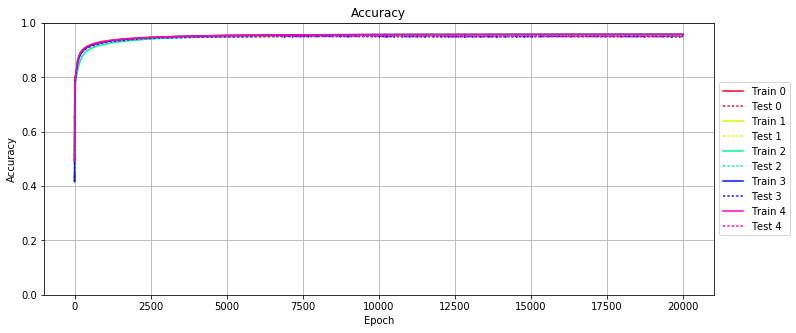

In [27]:
plot_acc(history)

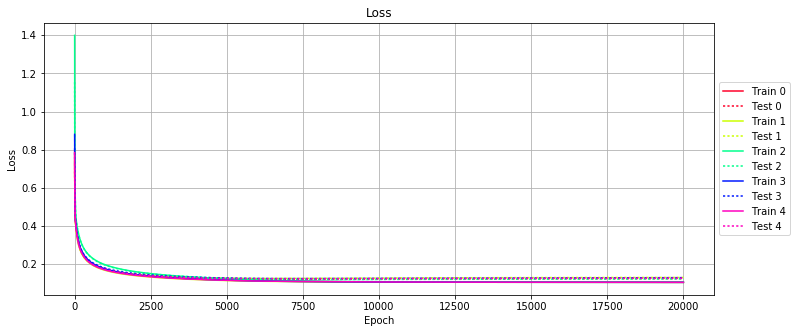

In [28]:
plot_loss(history)

Plotting the confusion matrix


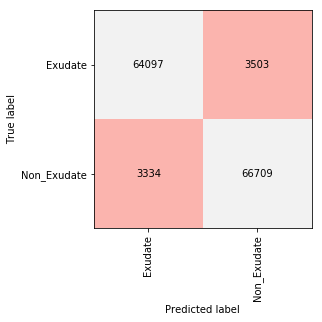

In [16]:
print("Plotting the confusion matrix")
figure = plt.gcf()
figure.set_size_inches(5, 4)
plt.imshow(conf_mat,interpolation='nearest')
for row in range(len(list_fams)):
    for col in range(len(list_fams)):
        plt.annotate(str(int(conf_mat[row][col])),xy=(col,row),ha='center',va='center')
plt.xticks(range(len(list_fams)),list_fams,rotation=90,fontsize=10)
plt.yticks(range(len(list_fams)),list_fams,fontsize=10)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

Plotting the confusion matrix normalized


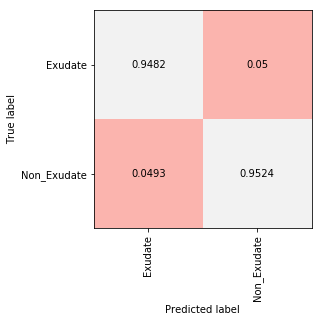

In [17]:
print("Plotting the confusion matrix normalized")
conf_mat_norm = conf_mat/no_imgs  # Normalizing the confusion matrix
conf_mat_norm = np.around(conf_mat_norm,decimals=4)  # rounding to display in figure
figure = plt.gcf()
figure.set_size_inches(5, 4)
plt.imshow(conf_mat_norm,interpolation='nearest')
for row in range(len(list_fams)):
    for col in range(len(list_fams)):
        plt.annotate(str(conf_mat_norm[row][col]),xy=(col,row),ha='center',va='center')
plt.xticks(range(len(list_fams)),list_fams,rotation=90,fontsize=10)
plt.yticks(range(len(list_fams)),list_fams,fontsize=10)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()